## Imports

In [0]:
from pyspark.sql.functions import udf, col
from pyspark.sql import functions as F
import pandas as pd
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pyspark.sql.functions import col,to_date, date_format
from datetime import datetime
from datetime import timezone

In [0]:
import pandas as pd
pd.set_option('display.max_rows', 1500)

In [0]:

units_ignore = pd.read_csv('/dbfs/FileStore/tables/Out_Cracking_Pressure/Units_Ignore.csv')

logfile_id_query = "select distinct ConnectionDeviceID as ID from logfiles_dev"
logfile_id_df = spark.sql(logfile_id_query)

device_list = (set(logfile_id_df.select('ID').toPandas()['ID'])) - (set(units_ignore['Unit']))
device_list = list(filter(None, device_list))

print(device_list)

['WW-066-TE', 'WW-023-TE', 'WW-083-GF', 'WW-089-GF', 'WW-006-GF', 'WW-079-GF', 'W2-201-GF', 'WW-085-GF', 'WW8', 'WW-024-TE', 'WW-033-TE', 'WW-045-TE', 'WW-005-TE', 'WW-078-GF', 'WW-043-TE', 'WW-042-TE', 'WW-021-TE', 'WW-041-TE', 'WW-066-TE_Testing', 'WW-044-TE', 'WW-075-TE', 'WW-039-TE', 'W2-202-GF', 'WW-082-GF', 'WW-022-GF', 'W2-203-GF', 'WW-081-GF', 'WW-067-GF', 'WW-074-TE', 'WW-035-TE', 'WW-026-TE', 'WW-071-TE', 'WW-032-TE', 'WW-100-GF']

In [0]:
['Found It! ' for x in units_ignore.Unit if x=='WW-049-TE']

Out[28]: ['Found It! ']

## Device ID - 'WW-049-TE'

In [0]:
from pyspark.sql.functions import to_timestamp,date_format
from pyspark.sql.functions import col

from pyspark.sql.functions import month,year

 
def getCPFluctuation():
  query = "select connectiondeviceid as Device ,dt as Date from logfiles_dev where connectiondeviceid = 'WW-049-TE' and dt between '2021-08-01' and '2022-07-30'"  # yearly data
  
  query_df = spark.sql(query)
  spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")
  query_df = query_df.withColumn('month',month(query_df.Date)).withColumn('year',year(query_df.Date))
  #query_df = query_df.withColumn("Date",to_timestamp(col("Date"))).withColumn("W_O_M", date_format(col("Date"), "W"))
    
  df_pd = query_df.toPandas().sort_values('Date')
  
  df = df_pd.groupby(['month','year','Device'],as_index=False).agg({'month':'count'})
  
  return df

In [0]:
data = getCPFluctuation()

In [0]:
data

Out[20]:

,year,Device,month
0,2022,WW-049-TE,1063097
1,2022,WW-049-TE,2418009
2,2022,WW-049-TE,2677963
3,2022,WW-049-TE,2590735
4,2022,WW-049-TE,2416464
5,2022,WW-049-TE,2577865
6,2022,WW-049-TE,2495725


In [0]:
%sql

select connectiondeviceid as Device , count(*) as MonthlyNumRecords from logfiles_dev where dt between '2021-08-01' and '2022-08-31' group by Device;

Device,MonthlyNumRecords
WW-075-TE,32254026
WW-079-GF,33328394
WW-068-TE,27206081
WW-033-TE,28927554
WW-024-TE,29532361
WW8,33684769
WW1,260478697
WW-045-TE,32704501
WW-022-GF,22784503
WW-078-GF,33330120


In [0]:
%sql

select * from logfiles_dev where connectiondeviceid like '%49%' and dt like '%2022-03-11%'  --and P3P2BackPressureEvent = 'False' 

BatteryPower,CellularFault,Checksum1,Checksum2,CloudFault,ConnectionDeviceID,DataNum,DripEvent,EnquedTimeUtc,ID,P1P2Delta,P2P1SiphonagPressureEvent,P2P3Delta,P3P2BackPressureEvent,Pressure1,Pressure1_PSI,Pressure2,Pressure2_PSI,Pressure3,Pressure3_PSI,ReliefEvent,SolenoidState,Spare1,Spare2,Spare3,Statebits,SystemTick,Temperature1,Temperature1_Deg,Temperature2,Temperature2_Deg,Tick,_corrupt_record,data,dt,header
false,310,16847,1302,14,WW-049-TE,21,false,3/11/2022 10:46:20 PM,49,5.137362637362628,false,-9.12637362637362,true,1825,60.302197802197796,1740,55.16483516483517,1891,64.29120879120879,false,false,0,0,0,0,44284230,2278,20.813105453796254,2233,19.83022544497294,44289288,null,0015:02a3b946072106cc076308e608b9000516,2022-03-11T22:37:54.2,0000:0000003102a3cd080136000e00000041cf
false,307,-29652,-31066,14,WW-049-TE,4,false,3/11/2022 12:16:18 PM,49,4.291208791208788,false,-22.241758241758234,true,1794,58.42857142857143,1723,54.13736263736264,2091,76.37912087912088,false,false,0,0,0,0,43906120,1903,12.873982507953883,1968,14.218998467295876,43911272,null,0004:029df448070206bb082b076f07b00086a6,2022-03-11T12:07:42.8,0000:00000031029e08680133000e0000008c2c
false,305,-4979,-5632,14,WW-049-TE,3,false,3/11/2022 4:46:25 AM,49,4.47252747252746,false,-16.802197802197796,true,1798,58.670329670329664,1724,54.197802197802204,2002,71.0,false,false,0,0,0,0,43637790,2001,14.905250605988272,2058,16.097356763938762,43641349,null,0003:0299dc1e070606bc07d207d1080a00ea00,2022-03-11T04:40:29.1,0000:000000310299ea050131000e000000ec8d
false,305,-4979,-8977,14,WW-049-TE,4,false,3/11/2022 4:46:25 AM,49,4.291208791208788,false,-17.164835164835168,true,1781,57.64285714285714,1710,53.35164835164835,1994,70.51648351648352,false,false,0,0,0,0,43637800,1999,14.863584218392134,2060,16.139359622069946,43641349,null,0004:0299dc2806f506ae07ca07cf080c00dcef,2022-03-11T04:40:30.1,0000:000000310299ea050131000e000000ec8d
false,305,-4979,-4427,14,WW-049-TE,23,false,3/11/2022 7:46:10 AM,49,4.532967032967022,false,-13.659340659340657,true,1826,60.36263736263736,1751,55.829670329670336,1977,69.48901098901099,false,false,0,0,0,0,43742330,1970,14.260517258358277,2010,15.092876866281415,43749193,null,0017:029b747a072206d707b907b207da00eeb5,2022-03-11T07:34:43.7,0000:00000031029b8f490131000e000000ec8d
false,310,16847,2221,14,WW-049-TE,6,false,3/11/2022 10:46:20 PM,49,6.346153846153854,false,-5.197802197802204,true,1834,60.846153846153854,1729,54.5,1815,59.697802197802204,false,false,0,0,0,0,44284140,2276,20.769184176902456,2235,19.87367872751463,44289288,null,0006:02a3b8ec072a06c1071708e408bb0008ad,2022-03-11T22:37:45.2,0000:0000003102a3cd080136000e00000041cf
false,307,-29652,19379,14,WW-049-TE,36,false,3/11/2022 11:46:32 AM,49,4.593406593406598,false,-23.14835164835165,true,1740,55.16483516483517,1664,50.57142857142857,2047,73.71978021978022,false,false,0,0,0,0,43891680,1921,13.245674940510412,1967,14.198242392222028,43893415,null,0024:029dbbe006cc068007ff078107af004bb3,2022-03-11T11:43:38.5,0000:00000031029dc2a70133000e0000008c2c
false,305,-4979,31918,14,WW-049-TE,8,false,3/11/2022 2:01:11 AM,49,10.274725274725284,false,2.538461538461533,false,1815,59.697802197802204,1645,49.42307692307692,1603,46.88461538461539,false,false,0,0,0,0,43535720,2103,17.045636299136675,2130,17.6180822004373,43542213,null,0008:02984d680717066d064308370852007cae,2022-03-11T01:50:21.7,0000:00000031029866c50131000e000000ec8d
false,305,-4979,20506,14,WW-049-TE,25,false,3/11/2022 8:16:27 AM,49,4.291208791208788,false,-23.087912087912088,true,1740,55.16483516483517,1669,50.87362637362638,2051,73.96153846153847,false,false,0,0,0,0,43764430,1960,14.053010889162351,2021,15.322489650500529,43767367,null,0019:029bcace06cc0685080307a807e500501a,2022-03-11T08:11:33.3,0000:00000031029bd6470131000e000000ec8d
false,309,-4280,11072,14,WW-049-TE,32,false,3/11/2022 7:31:13 PM,49,4.835164835164832,false,-9.670329670329664,true,1822,60.120879120879124,1742,55.28571428571429,1902,64.95604395604396,false,false,0,0

In [0]:
#query_raw_49 = "select * from logfiles_dev where connectiondeviceid like '%49%' and dt like '%2022-03-11%' "

query_raw = "select * from logfiles_dev where connectiondeviceid = 'WW-049-TE' and dt like '%2022-03-11%' "

df_49_raw = spark.sql(query_raw)

df_49_pd_raw = df_49_raw.toPandas().sort_values('dt')

df_49_pd_raw

Out[104]:

,BatteryPower,CellularFault,Checksum1,Checksum2,CloudFault,ConnectionDeviceID,DataNum,DripEvent,EnquedTimeUtc,ID,P1P2Delta,P2P1SiphonagPressureEvent,P2P3Delta,P3P2BackPressureEvent,Pressure1,Pressure1_PSI,Pressure2,Pressure2_PSI,Pressure3,Pressure3_PSI,ReliefEvent,SolenoidState,Spare1,Spare2,Spare3,Statebits,SystemTick,Temperature1,Temperature1_Deg,Temperature2,Temperature2_Deg,Tick,_corrupt_record,data,dt,header
26122,False,304,31964,-13432,14,WW-049-TE,2,False,3/11/2022 12:01:34 AM,49,5.137363,False,-13.901099,True,1842,61.329670,1757,56.192308,1987,70.093407,False,False,0,0,0,0,43469510,2176,18.600106,2164,18.343059,43470441,None,0002:02974ac6073206dd07c30880087400cb88,2022-03-11T00:00:00.9,0000:0000003102974e690130000e0000007cdc
72563,False,304,31964,-16965,14,WW-049-TE,3,False,3/11/2022 12:01:34 AM,49,4.653846,False,-15.109890,True,1832,60.725275,1755,56.071429,2005,71.181319,False,False,0,0,0,0,43469520,2177,18.621555,2163,18.321667,43470441,None,0003:02974ad0072806db07d50881087300bdbb,2022-03-11T00:00:01.9,0000:0000003102974e690130000e0000007cdc
72565,False,304,31964,30325,14,WW-049-TE,4,False,3/11/2022 12:01:34 AM,49,4.653846,False,-14.928571,True,1833,60.785714,1756,56.131868,2003,71.060440,False,False,0,0,0,0,43469530,2177,18.621555,2163,18.321667,43470441,None,0004:02974ada072906dc07d308810873007675,2022-03-11T00:00:02.9,0000:0000003102974e690130000e0000007cdc
86426,False,304,31964,26830,14,WW-049-TE,5,False,3/11/2022 12:01:34 AM,49,4.351648,False,-16.379121,True,1831,60.664835,1759,56.313187,2030,72.692308,False,False,0,0,0,0,43469540,2175,18.578661,2165,18.364455,43470441,None,0005:02974ae4072706df07ee087f08750068ce,2022-03-11T00:00:03.9,0000:0000003102974e690130000e0000007cdc
31657,False,304,31964,16086,14,WW-049-TE,6,False,3/11/2022 12:01:34 AM,49,4.532967,False,-15.956044,True,1836,60.967033,1761,56.434066,2025,72.390110,False,False,0,0,0,0,43469550,2177,18.621555,2166,18.385856,43470441,None,0006:02974aee072c06e107e908810876003ed6,2022-03-11T00:00:04.9,0000:0000003102974e690130000e0000007cdc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39233,False,310,16847,-23957,14,WW-049-TE,4,False,3/12/2022 12:01:39 AM,49,5.016484,False,-9.489011,True,1843,61.390110,1760,56.373626,1917,65.862637,False,False,0,0,0,0,44333440,2235,19.873679,2210,19.331971,44334477,None,0004:02a47980073306e0077d08bb08a200a26b,2022-03-11T23:59:55.3,0000:0000003102a47d8d0136000e00000041cf
73262,False,310,16847,-1839,14,WW-049-TE,5,False,3/12/2022 12:01:39 AM,49,5.379121,False,-8.884615,True,1846,61.571429,1757,56.192308,1904,65.076923,False,False,0,0,0,0,44333450,2239,19.960648,2210,19.331971,44334477,None,0005:02a4798a073606dd077008bf08a200f8d1,2022-03-11T23:59:56.3,0000:0000003102a47d8d0136000e00000041cf
50432,False,310,16847,-26340,14,WW-049-TE,6,False,3/12/2022 12:01:39 AM,49,5.076923,False,-9.851648,True,1843,61.390110,1759,56.313187,1922,66.164835,False,False,0,0,0,0,44333460,2245,20.091258,2211,19.353580,44334477,None,0006:02a47994073306df078208c508a300991c,2022-03-11T23:59:57.3,0000:0000003102a47d8d0136000e00000041cf
61351,False,310,16847,-32744,14,WW-049-TE,7,False,3/12/2022 12:01:39 AM,49,4.774725,False,-10.637363,True,1844,61.450549,1765,56.675824,1941,67.313187,False,False,0,0,0,0,44333470,2239,19.960648,2211,19.353580,44334477,None,0007:02a4799e073406e5079508bf08a3008018,2022-03-11T23:59:58.3,0000:0000003102a47d8d0136000e00000041cf


In [0]:
df_49_pd_raw.iloc[0,df_49_pd_raw.columns.get_loc('P2P3Delta')]

Out[110]: -13.901098901098905

In [0]:
df_49_pd_raw.loc[df_49_pd_raw.P2P3Delta < 0,:]

Out[116]:

,BatteryPower,CellularFault,Checksum1,Checksum2,CloudFault,ConnectionDeviceID,DataNum,DripEvent,EnquedTimeUtc,ID,P1P2Delta,P2P1SiphonagPressureEvent,P2P3Delta,P3P2BackPressureEvent,Pressure1,Pressure1_PSI,Pressure2,Pressure2_PSI,Pressure3,Pressure3_PSI,ReliefEvent,SolenoidState,Spare1,Spare2,Spare3,Statebits,SystemTick,Temperature1,Temperature1_Deg,Temperature2,Temperature2_Deg,Tick,_corrupt_record,data,dt,header
26122,False,304,31964,-13432,14,WW-049-TE,2,False,3/11/2022 12:01:34 AM,49,5.137363,False,-13.901099,True,1842,61.329670,1757,56.192308,1987,70.093407,False,False,0,0,0,0,43469510,2176,18.600106,2164,18.343059,43470441,None,0002:02974ac6073206dd07c30880087400cb88,2022-03-11T00:00:00.9,0000:0000003102974e690130000e0000007cdc
72563,False,304,31964,-16965,14,WW-049-TE,3,False,3/11/2022 12:01:34 AM,49,4.653846,False,-15.109890,True,1832,60.725275,1755,56.071429,2005,71.181319,False,False,0,0,0,0,43469520,2177,18.621555,2163,18.321667,43470441,None,0003:02974ad0072806db07d50881087300bdbb,2022-03-11T00:00:01.9,0000:0000003102974e690130000e0000007cdc
72565,False,304,31964,30325,14,WW-049-TE,4,False,3/11/2022 12:01:34 AM,49,4.653846,False,-14.928571,True,1833,60.785714,1756,56.131868,2003,71.060440,False,False,0,0,0,0,43469530,2177,18.621555,2163,18.321667,43470441,None,0004:02974ada072906dc07d308810873007675,2022-03-11T00:00:02.9,0000:0000003102974e690130000e0000007cdc
86426,False,304,31964,26830,14,WW-049-TE,5,False,3/11/2022 12:01:34 AM,49,4.351648,False,-16.379121,True,1831,60.664835,1759,56.313187,2030,72.692308,False,False,0,0,0,0,43469540,2175,18.578661,2165,18.364455,43470441,None,0005:02974ae4072706df07ee087f08750068ce,2022-03-11T00:00:03.9,0000:0000003102974e690130000e0000007cdc
31657,False,304,31964,16086,14,WW-049-TE,6,False,3/11/2022 12:01:34 AM,49,4.532967,False,-15.956044,True,1836,60.967033,1761,56.434066,2025,72.390110,False,False,0,0,0,0,43469550,2177,18.621555,2166,18.385856,43470441,None,0006:02974aee072c06e107e908810876003ed6,2022-03-11T00:00:04.9,0000:0000003102974e690130000e0000007cdc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39233,False,310,16847,-23957,14,WW-049-TE,4,False,3/12/2022 12:01:39 AM,49,5.016484,False,-9.489011,True,1843,61.390110,1760,56.373626,1917,65.862637,False,False,0,0,0,0,44333440,2235,19.873679,2210,19.331971,44334477,None,0004:02a47980073306e0077d08bb08a200a26b,2022-03-11T23:59:55.3,0000:0000003102a47d8d0136000e00000041cf
73262,False,310,16847,-1839,14,WW-049-TE,5,False,3/12/2022 12:01:39 AM,49,5.379121,False,-8.884615,True,1846,61.571429,1757,56.192308,1904,65.076923,False,False,0,0,0,0,44333450,2239,19.960648,2210,19.331971,44334477,None,0005:02a4798a073606dd077008bf08a200f8d1,2022-03-11T23:59:56.3,0000:0000003102a47d8d0136000e00000041cf
50432,False,310,16847,-26340,14,WW-049-TE,6,False,3/12/2022 12:01:39 AM,49,5.076923,False,-9.851648,True,1843,61.390110,1759,56.313187,1922,66.164835,False,False,0,0,0,0,44333460,2245,20.091258,2211,19.353580,44334477,None,0006:02a47994073306df078208c508a300991c,2022-03-11T23:59:57.3,0000:0000003102a47d8d0136000e00000041cf
61351,False,310,16847,-32744,14,WW-049-TE,7,False,3/12/2022 12:01:39 AM,49,4.774725,False,-10.637363,True,1844,61.450549,1765,56.675824,1941,67.313187,False,False,0,0,0,0,44333470,2239,19.960648,2211,19.353580,44334477,None,0007:02a4799e073406e5079508bf08a3008018,2022-03-11T23:59:58.3,0000:0000003102a47d8d0136000e00000041cf


In [0]:
# Without BackPressure

#query_raw_49 = "select * from logfiles_dev where connectiondeviceid like '%49%' and dt like '%2022-03-11%' "

query_raw_49 = "select * from logfiles_dev where connectiondeviceid like '%49%' and dt like '%2022-03-11%' and P3P2BackPressureEvent = 'False' "

df_49 = spark.sql(query_raw_49)

df_49_pd = df_49.toPandas().sort_values('dt')

df_49_pd

Out[77]:

,BatteryPower,CellularFault,Checksum1,Checksum2,CloudFault,ConnectionDeviceID,DataNum,DripEvent,EnquedTimeUtc,ID,P1P2Delta,P2P1SiphonagPressureEvent,P2P3Delta,P3P2BackPressureEvent,Pressure1,Pressure1_PSI,Pressure2,Pressure2_PSI,Pressure3,Pressure3_PSI,ReliefEvent,SolenoidState,Spare1,Spare2,Spare3,Statebits,SystemTick,Temperature1,Temperature1_Deg,Temperature2,Temperature2_Deg,Tick,_corrupt_record,data,dt,header
2423,False,304,31964,6208,14,WW-049-TE,16,False,3/11/2022 12:16:00 AM,49,7.736264,False,2.115385,False,1832,60.725275,1704,52.989011,1669,50.873626,False,False,0,0,0,0,43470100,2175,18.578661,2172,18.514353,43479099,None,0010:02974d14072806a80685087f087c001840,2022-03-11T00:01:00.1,0000:000000310297703b0130000e0000007cdc
678,False,304,31964,-980,14,WW-049-TE,8,False,3/11/2022 12:16:04 AM,49,10.637363,False,2.659341,False,1801,58.851648,1625,48.214286,1581,45.554945,False,False,0,0,0,0,43470800,2176,18.600106,2163,18.321667,43479134,None,0008:02974fd007090659062d0880087300fc2c,2022-03-11T00:02:10.6,0000:000000310297705e0130000e0000007cdc
3109,False,304,31964,18501,14,WW-049-TE,9,False,3/11/2022 12:16:04 AM,49,9.307692,False,2.719780,False,1810,59.395604,1656,50.087912,1611,47.368132,False,False,0,0,0,0,43470810,2176,18.600106,2163,18.321667,43479134,None,0009:02974fda07120678064b08800873004845,2022-03-11T00:02:11.6,0000:000000310297705e0130000e0000007cdc
1655,False,304,31964,-3241,14,WW-049-TE,16,False,3/11/2022 12:16:04 AM,49,8.401099,False,2.175824,False,1820,60.000000,1681,51.598901,1645,49.423077,False,False,0,0,0,0,43470820,2169,18.450085,2165,18.364455,43479134,None,0010:02974fe4071c0691066d0879087500f357,2022-03-11T00:02:12.6,0000:000000310297705e0130000e0000007cdc
6195,False,304,31964,-5107,14,WW-049-TE,17,False,3/11/2022 12:16:04 AM,49,8.703297,False,1.994505,False,1810,59.395604,1666,50.692308,1633,48.697802,False,False,0,0,0,0,43470830,2173,18.535784,2165,18.364455,43479134,None,0011:02974fee071206820661087d087500ec0d,2022-03-11T00:02:13.6,0000:000000310297705e0130000e0000007cdc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
632,False,310,16847,-9411,14,WW-049-TE,22,False,3/12/2022 12:01:36 AM,49,8.461538,False,1.692308,False,1836,60.967033,1696,52.505495,1668,50.813187,False,False,0,0,0,0,44332840,2238,19.938898,2210,19.331971,44334446,None,0016:02a47728072c06a0068408be08a200db3d,2022-03-11T23:58:55.4,0000:0000003102a47d6e0136000e00000041cf
2360,False,310,16847,12033,14,WW-049-TE,19,False,3/12/2022 12:01:37 AM,49,9.186813,False,2.417582,False,1837,61.027473,1685,51.840659,1645,49.423077,False,False,0,0,0,0,44333050,2240,19.982403,2211,19.353580,44334457,None,0013:02a477fa072d0695066d08c008a3002f01,2022-03-11T23:59:16.3,0000:0000003102a47d790136000e00000041cf
7456,False,310,16847,23529,14,WW-049-TE,20,False,3/12/2022 12:01:37 AM,49,9.247253,False,2.357143,False,1845,61.510989,1692,52.263736,1653,49.906593,False,False,0,0,0,0,44333060,2239,19.960648,2211,19.353580,44334457,None,0014:02a478040735069c067508bf08a3005be9,2022-03-11T23:59:17.3,0000:0000003102a47d790136000e00000041cf
394,False,310,16847,-18602,14,WW-049-TE,21,False,3/12/2022 12:01:37 AM,49,8.582418,False,1.631868,False,1854,62.054945,1712,53.472527,1685,51.840659,False,False,0,0,0,0,44333070,2238,19.938898,2211,19.353580,44334457,None,0015:02a4780e073e06b0069508be08a300b756,2022-03-11T23:59:18.3,0000:0000003102a47d790136000e00000041cf


In [0]:
# import datetime
# from datetime import datetime

# datetime_obj = df_49_pd['dt'][0].split('T')[-1]
  
# # It will print the datetime object
# print(datetime_obj)
  
# # extract the time from datetime_obj
# #time = datetime_obj.time()

In [0]:
# for i,idx in enumerate(df_49_pd['dt']):
#   print(idx)

In [0]:
# df_49_pd['dt'] = pd.to_datetime(df_49_pd['dt'])

# x = []
# for i,idx in enumerate(df_49_pd['dt']):
#   x.append(idx.split('T')[-1])
  
# #print(x)



# lstDateTime = [datetime.strptime(x,'%H:%M:%S.%f') for x in df_49_pd['dt']]
# print("lstDateTime:",lstDateTime)
  

In [0]:
#df_49_pd['dt'].dt.time

Legend

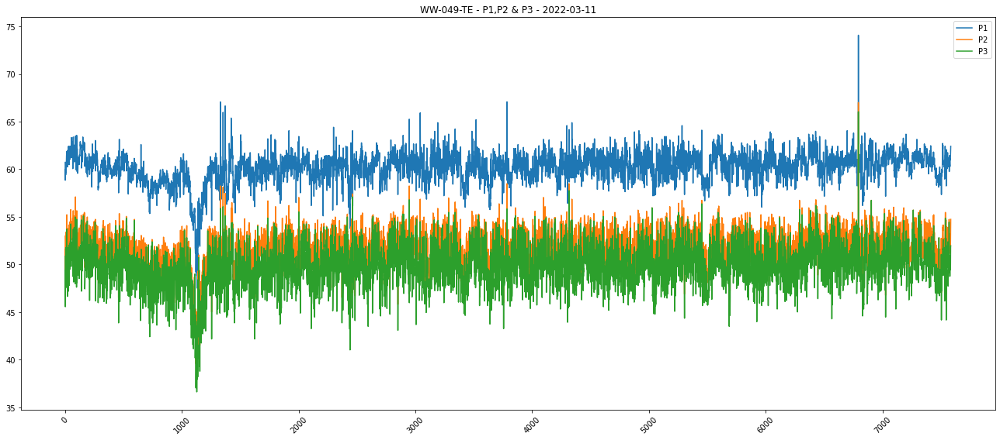

None

In [0]:
plt.figure(figsize=(18,8))

length = range(1, len(df_49_pd['Pressure1_PSI'])+1)
plt.plot(length, df_49_pd['Pressure1_PSI'], label='P1')
plt.plot(length, df_49_pd['Pressure2_PSI'], label='P2')
plt.plot(length, df_49_pd['Pressure3_PSI'], label='P3')


plt.xticks(rotation = 45)
plt.title("WW-049-TE - P1,P2 & P3 - 2022-03-11")
print(plt.legend())
print(plt.show())

Legend

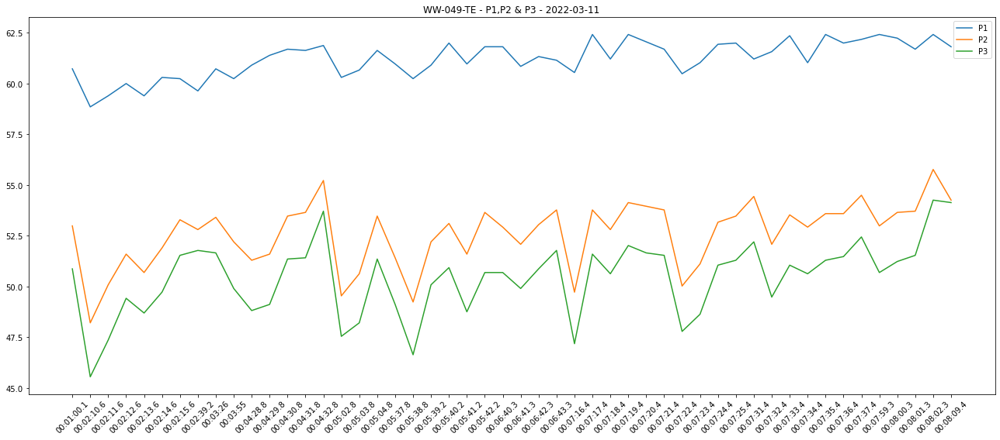

None

In [0]:

plt.figure(figsize=(18,8))

plt.plot(x[:50], df_49_pd['Pressure1_PSI'][:50], label='P1')
plt.plot(x[:50], df_49_pd['Pressure2_PSI'][:50], label='P2')
plt.plot(x[:50], df_49_pd['Pressure3_PSI'][:50], label='P3')


plt.xticks(rotation = 45)
plt.title("WW-049-TE - P1,P2 & P3 - 2022-03-11")
print(plt.legend())
print(plt.show())

In [0]:
query_raw_49_BP = "select * from logfiles_dev where connectiondeviceid like '%49%' and dt like '%2022-03-11%' and P3P2BackPressureEvent = 'True' "

df_49_BP = spark.sql(query_raw_49_BP)

df_49_BP_pd = df_49_BP.toPandas().sort_values('dt')

df_49_BP_pd

Out[94]:

,BatteryPower,CellularFault,Checksum1,Checksum2,CloudFault,ConnectionDeviceID,DataNum,DripEvent,EnquedTimeUtc,ID,P1P2Delta,P2P1SiphonagPressureEvent,P2P3Delta,P3P2BackPressureEvent,Pressure1,Pressure1_PSI,Pressure2,Pressure2_PSI,Pressure3,Pressure3_PSI,ReliefEvent,SolenoidState,Spare1,Spare2,Spare3,Statebits,SystemTick,Temperature1,Temperature1_Deg,Temperature2,Temperature2_Deg,Tick,_corrupt_record,data,dt,header
23835,False,304,31964,-13432,14,WW-049-TE,2,False,3/11/2022 12:01:34 AM,49,5.137363,False,-13.901099,True,1842,61.329670,1757,56.192308,1987,70.093407,False,False,0,0,0,0,43469510,2176,18.600106,2164,18.343059,43470441,None,0002:02974ac6073206dd07c30880087400cb88,2022-03-11T00:00:00.9,0000:0000003102974e690130000e0000007cdc
66198,False,304,31964,-16965,14,WW-049-TE,3,False,3/11/2022 12:01:34 AM,49,4.653846,False,-15.109890,True,1832,60.725275,1755,56.071429,2005,71.181319,False,False,0,0,0,0,43469520,2177,18.621555,2163,18.321667,43470441,None,0003:02974ad0072806db07d50881087300bdbb,2022-03-11T00:00:01.9,0000:0000003102974e690130000e0000007cdc
66200,False,304,31964,30325,14,WW-049-TE,4,False,3/11/2022 12:01:34 AM,49,4.653846,False,-14.928571,True,1833,60.785714,1756,56.131868,2003,71.060440,False,False,0,0,0,0,43469530,2177,18.621555,2163,18.321667,43470441,None,0004:02974ada072906dc07d308810873007675,2022-03-11T00:00:02.9,0000:0000003102974e690130000e0000007cdc
78853,False,304,31964,26830,14,WW-049-TE,5,False,3/11/2022 12:01:34 AM,49,4.351648,False,-16.379121,True,1831,60.664835,1759,56.313187,2030,72.692308,False,False,0,0,0,0,43469540,2175,18.578661,2165,18.364455,43470441,None,0005:02974ae4072706df07ee087f08750068ce,2022-03-11T00:00:03.9,0000:0000003102974e690130000e0000007cdc
28838,False,304,31964,16086,14,WW-049-TE,6,False,3/11/2022 12:01:34 AM,49,4.532967,False,-15.956044,True,1836,60.967033,1761,56.434066,2025,72.390110,False,False,0,0,0,0,43469550,2177,18.621555,2166,18.385856,43470441,None,0006:02974aee072c06e107e908810876003ed6,2022-03-11T00:00:04.9,0000:0000003102974e690130000e0000007cdc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35798,False,310,16847,-23957,14,WW-049-TE,4,False,3/12/2022 12:01:39 AM,49,5.016484,False,-9.489011,True,1843,61.390110,1760,56.373626,1917,65.862637,False,False,0,0,0,0,44333440,2235,19.873679,2210,19.331971,44334477,None,0004:02a47980073306e0077d08bb08a200a26b,2022-03-11T23:59:55.3,0000:0000003102a47d8d0136000e00000041cf
66837,False,310,16847,-1839,14,WW-049-TE,5,False,3/12/2022 12:01:39 AM,49,5.379121,False,-8.884615,True,1846,61.571429,1757,56.192308,1904,65.076923,False,False,0,0,0,0,44333450,2239,19.960648,2210,19.331971,44334477,None,0005:02a4798a073606dd077008bf08a200f8d1,2022-03-11T23:59:56.3,0000:0000003102a47d8d0136000e00000041cf
46029,False,310,16847,-26340,14,WW-049-TE,6,False,3/12/2022 12:01:39 AM,49,5.076923,False,-9.851648,True,1843,61.390110,1759,56.313187,1922,66.164835,False,False,0,0,0,0,44333460,2245,20.091258,2211,19.353580,44334477,None,0006:02a47994073306df078208c508a300991c,2022-03-11T23:59:57.3,0000:0000003102a47d8d0136000e00000041cf
56037,False,310,16847,-32744,14,WW-049-TE,7,False,3/12/2022 12:01:39 AM,49,4.774725,False,-10.637363,True,1844,61.450549,1765,56.675824,1941,67.313187,False,False,0,0,0,0,44333470,2239,19.960648,2211,19.353580,44334477,None,0007:02a4799e073406e5079508bf08a3008018,2022-03-11T23:59:58.3,0000:0000003102a47d8d0136000e00000041cf


In [0]:
z = []
for i,idx in enumerate(df_49_BP_pd['dt']):
  z.append(idx.split('T')[-1])

Legend

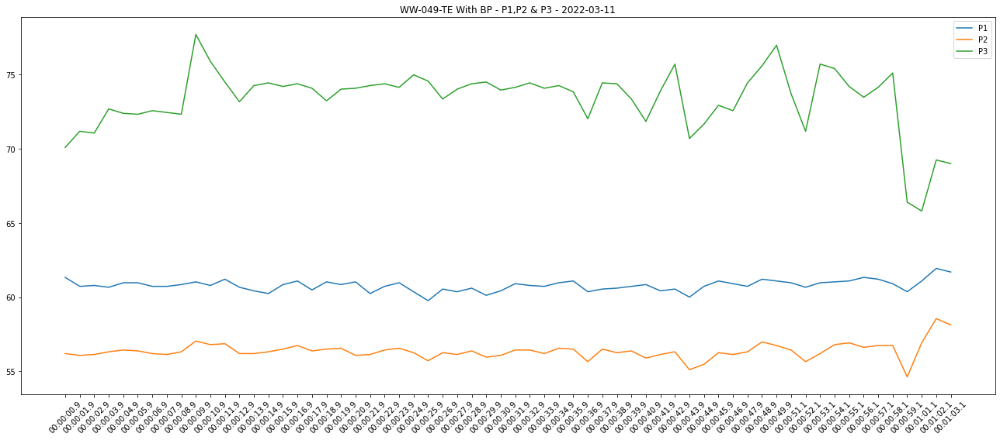

None

In [0]:
plt.figure(figsize=(18,8))

plt.plot(z[:62], df_49_BP_pd['Pressure1_PSI'][:62], label='P1')
plt.plot(z[:62], df_49_BP_pd['Pressure2_PSI'][:62], label='P2')
plt.plot(z[:62], df_49_BP_pd['Pressure3_PSI'][:62], label='P3')


plt.xticks(rotation = 45)
plt.title("WW-049-TE With BP - P1,P2 & P3 - 2022-03-11")
print(plt.legend())
print(plt.show())

In [0]:
# CP_Patterns_2Filter_Comb_MedMean_Summary%sql

# select min(date) as MinDate, max(date) as MaxDate from CP_Patterns_2Filter_Comb_MedMean_Summary --where Date between '2021-10-01' and '2021-10-31' group by Device;

In [0]:
%sql

select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device = 'WW-049-TE'

Device,Date,CP_P1P2D,CP_P2P3D


## Device ID WW-005-TE

In [0]:
%sql

select device,count(*) as NumRecords from CP_Patterns_2Filter_Comb_MedMean_Summary where Date between '2021-08-01' and '2021-08-31' group by Device;

device,NumRecords
WW-075-TE,30
WW-079-GF,14
WW-033-TE,15
WW-024-TE,30
WW8,31
WW-045-TE,30
WW-032-TE,4
WW-067-GF,26
WW-006-GF,26
WW-023-TE,30


In [0]:
# Device in scope - WW-035-TE 198 Days , WW-033-TE 455  , WW-041-TE 493 , WW-044-TE 354  , WW-005-TE  490 , WW8  498, 
#
#
#

In [0]:
query_CP = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where Date between '2021-10-01' and '2021-10-31' "

sdf = spark.sql(query_CP)

df = sdf.toPandas()

df

Out[119]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-005-TE,2021-10-01,9.9,2.1
1,WW-005-TE,2021-10-02,9.8,1.9
2,WW-005-TE,2021-10-03,9.8,1.9
3,WW-005-TE,2021-10-04,9.9,2.1
4,WW-005-TE,2021-10-05,9.9,2.1
...,...,...,...,...
629,WW8,2021-10-27,8.0,2.0
630,WW8,2021-10-28,8.0,1.9
631,WW8,2021-10-29,8.0,1.9
632,WW8,2021-10-30,8.0,2.0


In [0]:
#df.Device.unique()

Out[76]: array(['WW-005-TE', 'WW-006-GF', 'WW-021-TE', 'WW-023-TE', 'WW-024-TE',
 'WW-026-TE', 'WW-033-TE', 'WW-035-TE', 'WW-039-TE', 'WW-041-TE',
 'WW-043-TE', 'WW-044-TE', 'WW-045-TE', 'WW-066-TE', 'WW-067-GF',
 'WW-071-TE', 'WW-074-TE', 'WW-075-TE', 'WW-079-GF', 'WW-085-GF',
 'WW-089-GF', 'WW8'], dtype=object)

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(12,10)})

In [0]:
# length = range(1, len(df['CP_P2P3D'])+1)
# plt.plot(length, df['CP_P2P3D'], label='P1')

In [0]:
df

Out[124]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-005-TE,2021-10-01,9.9,2.1
1,WW-005-TE,2021-10-02,9.8,1.9
2,WW-005-TE,2021-10-03,9.8,1.9
3,WW-005-TE,2021-10-04,9.9,2.1
4,WW-005-TE,2021-10-05,9.9,2.1
...,...,...,...,...
629,WW8,2021-10-27,8.0,2.0
630,WW8,2021-10-28,8.0,1.9
631,WW8,2021-10-29,8.0,1.9
632,WW8,2021-10-30,8.0,2.0


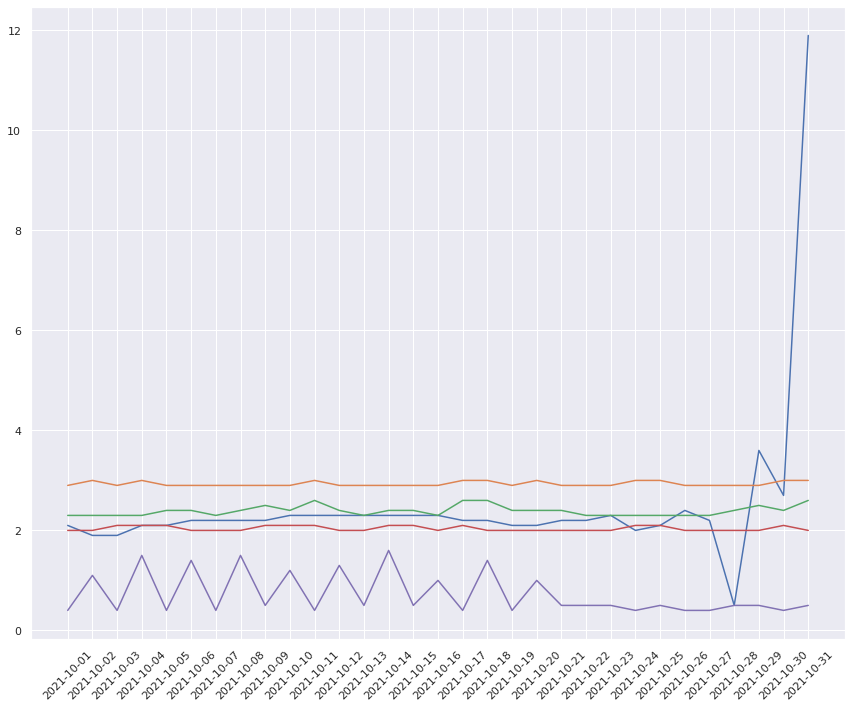

--------------------------------------------------------------------------- 
 ValueError Traceback (most recent call last)
 <command-2225150596266279> in <module> 
 3 for device in dev : 
 4 df_plot = df [ df [ 'Device' ] == device ] 
 ----> 5 plt . plot ( df . Date . unique ( ) , df_plot [ 'CP_P2P3D' ] ) 
 6 plt . xticks ( rotation = 45 ) 
 7 

 /databricks/python/lib/python3.8/site-packages/matplotlib/pyplot.py in plot (scalex, scaley, data, *args, **kwargs) 
 3017 @ _copy_docstring_and_deprecators ( Axes . plot ) 
 3018 def plot ( * args , scalex = True , scaley = True , data = None , ** kwargs ) : 
 -> 3019 return gca().plot(
 3020 * args , scalex = scalex , scaley = scaley , 
 3021 **({"data": data} if data is not None else {}), **kwargs)

 /databricks/python/lib/python3.8/site-packages/matplotlib/axes/_axes.py in plot (self, scalex, scaley, data, *args, **kwargs) 
 1603 """
 1604 kwargs = cbook . normalize_kwargs ( kwargs , mlines . Line2D ) 
 -> 1605 lines = [ * self . _get_lines ( * args , data = data , ** kwargs ) ] 
 1606 for line in lines : 
 1607 self . add_line ( line ) 

 /databricks/python/lib/python3.8/site-packages/matplotlib/axes/_base.py in __call__ (self, data, *args, **kwargs) 
 313 this += args [ 0 ] , 
 314 args = args [ 1 : ] 
 --> 315 yield from self . _plot_args ( this , kwargs ) 
 316 
 317 def get_next_color ( self ) : 

 /databricks/python/lib/python3.8/site-packages/matplotlib/axes/_base.py in _plot_args (self, tup, kwargs, return_kwargs) 
 499 
 500 if x . shape [ 0 ] != y . shape [ 0 ] : 
 --> 501 raise ValueError(f"x and y must have same first dimension, but "
 502 f"have shapes {x.shape} and {y.shape}")
 503 if x . ndim > 2 or y . ndim > 2 : 

 ValueError : x and y must have same first dimension, but have shapes (31,) and (22,)

In [0]:
dev = df.Device.unique()
#length = range(1,len(df['CP_P2P3D'] + 1))
for device in dev:
  df_plot = df[df['Device']==device]
  plt.plot(df.Date.unique(),df_plot['CP_P2P3D'])
  plt.xticks(rotation = 45)
  

In [0]:
df_005 = df[df['Device']=='WW-005-TE']
df_005

Out[36]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-005-TE,2021-10-01,9.9,2.1
1,WW-005-TE,2021-10-02,9.8,1.9
2,WW-005-TE,2021-10-03,9.8,1.9
3,WW-005-TE,2021-10-04,9.9,2.1
4,WW-005-TE,2021-10-05,9.9,2.1
5,WW-005-TE,2021-10-06,10.1,2.2
6,WW-005-TE,2021-10-07,10.0,2.2
7,WW-005-TE,2021-10-08,10.0,2.2
8,WW-005-TE,2021-10-09,9.9,2.2
9,WW-005-TE,2021-10-10,9.9,2.3


Out[28]:

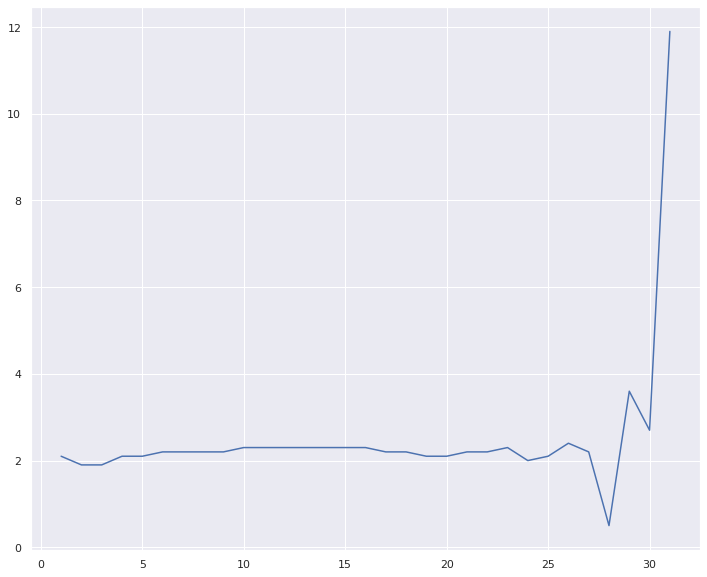

[<matplotlib.lines.Line2D at 0x7fb75a7275e0>]

In [0]:
length = range(1, len(df_005['CP_P2P3D'])+1)
plt.plot(length, df_005['CP_P2P3D'])

In [0]:
%sql

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id = 'WW-005-TE' and Date = '2021-10-30'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW-005-TE,2021-10-30,0.2,60,1,68,9.923642533936652,2.756221719457013,9.972527472527474,2.780219780219781,9.912087912087912,2.780219780219781
WW-005-TE,2021-10-30,0.3,30,95,4988,9.922338888056602,2.646957092626702,9.912087912087912,2.236263736263737,9.912087912087912,2.538461538461547
WW-005-TE,2021-10-30,0.3,20,180,6999,9.914514475380354,2.6476309802499376,9.912087912087912,2.236263736263737,9.912087912087912,2.478021978021985
WW-005-TE,2021-10-30,0.3,60,26,2224,9.931844908688493,2.4149463396315896,9.912087912087912,1.6318681318681314,9.912087912087912,2.357142857142861
WW-005-TE,2021-10-30,0.2,30,17,681,9.902325281179882,2.9891400816510934,9.912087912087912,2.719780219780219,9.912087912087912,2.780219780219781
WW-005-TE,2021-10-30,0.2,20,61,1704,9.895452845276871,2.893685832946397,9.912087912087912,2.719780219780219,9.912087912087912,2.840659340659343


In [0]:
%sql

select * from Daily_CP_Patterns_Full_Granular where id = 'WW-005-TE' and Date = '2021-10-30'

ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,Date,Pressure1_SD,Pressure2_SD,Pressure3_SD,Counter,Pattern,SD_Filter,Duration_Filter
WW-005-TE,2021-10-30T00:20:40.8,54.43956043956044,44.467032967032964,41.86813186813187,9.972527472527474,2.598901098901095,false,false,2021-10-30,0.0,0.3846350073487263,0.12821166911624546,1,106,0.3,20
WW-005-TE,2021-10-30T00:20:51.6,54.13736263736264,44.104395604395606,41.747252747252745,10.032967032967036,2.357142857142861,false,false,2021-10-30,0.04273722303874848,0.0,0.0,12,106,0.3,20
WW-005-TE,2021-10-30T00:20:56.6,54.74175824175825,44.58791208791209,41.80769230769231,10.15384615384616,2.780219780219781,false,false,2021-10-30,0.08547444607749696,0.17094889215498388,0.17094889215498388,17,106,0.3,20
WW-005-TE,2021-10-30T00:20:57.6,54.74175824175825,44.769230769230774,41.80769230769231,9.972527472527474,2.961538461538467,false,false,2021-10-30,0.0,0.12821166911624546,0.0,18,106,0.3,20
WW-005-TE,2021-10-30T00:20:59.6,54.802197802197796,44.769230769230774,41.86813186813187,10.032967032967022,2.901098901098905,false,false,2021-10-30,0.042737223038738434,0.2136861151937424,0.04273722303874848,20,106,0.3,20
WW-005-TE,2021-10-30T00:21:02.6,54.43956043956044,44.58791208791209,41.747252747252745,9.85164835164835,2.840659340659343,false,false,2021-10-30,0.08547444607749696,0.12821166911624546,0.04273722303874848,23,106,0.3,20
WW-005-TE,2021-10-30T00:21:06.6,53.895604395604394,44.28571428571429,41.80769230769231,9.609890109890102,2.478021978021985,false,false,2021-10-30,0.08547444607749696,0.04273722303874848,0.0,27,106,0.3,20
WW-005-TE,2021-10-30T00:21:07.6,54.01648351648352,44.346153846153854,41.747252747252745,9.670329670329664,2.598901098901109,false,false,2021-10-30,0.08547444607749696,0.04273722303874848,0.04273722303874848,28,106,0.3,20
WW-005-TE,2021-10-30T00:21:13.6,54.74175824175825,44.769230769230774,41.68681318681318,9.972527472527474,3.082417582417591,false,false,2021-10-30,0.0,0.04273722303874848,0.17094889215499393,6,107,0.3,20
WW-005-TE,2021-10-30T00:21:17.6,54.25824175824175,44.346153846153854,41.80769230769231,9.912087912087898,2.538461538461547,false,false,2021-10-30,0.12821166911624546,0.12821166911623538,0.08547444607749696,10,107,0.3,20


In [0]:
# for devices in df['Device'].unique():
#   print(f'Fluctuation in CP for device {devices} is: ', (df[df['Device']==devices]['CP_P2P3D'].max() - df[df['Device']==devices]['CP_P2P3D'].min())/ df[df['Device']==devices]['CP_P2P3D'].mean())

In [0]:
# for devices in df['Device'].unique():
#   print(f'Fluctuation in CP for device {devices} is: ', (df[df['Device']==devices]['CP_P2P3D'].max() - df[df['Device']==devices]['CP_P2P3D'].min())/ df[df['Device']==devices]['CP_P2P3D'].mean())

In [0]:
# df_005['CP_P2P3D'].max(), df_005['CP_P2P3D'].min(), df_005['CP_P2P3D'].mean()

Out[43]: (11.9, 0.5, 2.5064516129032257)

In [0]:
# df[df['Device']=='WW-026-TE']['CP_P2P3D'].max(), df[df['Device']=='WW-026-TE']['CP_P2P3D'].min(), df[df['Device']=='WW-026-TE']['CP_P2P3D'].mean()

Out[47]: (2.9, 0.0, 0.4454545454545455)

In [0]:
df[df['Device']=='WW-005-TE'][['Date','CP_P2P3D']]

Out[132]:

,Date,CP_P2P3D
0,2021-10-01,2.1
1,2021-10-02,1.9
2,2021-10-03,1.9
3,2021-10-04,2.1
4,2021-10-05,2.1
5,2021-10-06,2.2
6,2021-10-07,2.2
7,2021-10-08,2.2
8,2021-10-09,2.2
9,2021-10-10,2.3


In [0]:
# '2021-10-30'

query_005 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-10-30%'  and ConnectionDeviceID = 'WW-005-TE' "

df_05_30th = spark.sql(query_005)

df_pd_05 = df_05_30th.toPandas().sort_values('dt')

In [0]:
df_pd_05.head()

Out[2]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
27974,WW-005-TE,2021-10-30T00:00:00.5,55.406593,45.434066,41.565934,9.972527,3.868132,False,False
71423,WW-005-TE,2021-10-30T00:00:01.5,55.587912,45.554945,41.505495,10.032967,4.049451,False,False
10797,WW-005-TE,2021-10-30T00:00:02.5,55.467033,45.554945,41.505495,9.912088,4.049451,False,False
1795,WW-005-TE,2021-10-30T00:00:03.5,55.467033,45.494505,41.565934,9.972527,3.928571,False,False
47910,WW-005-TE,2021-10-30T00:00:04.5,55.104396,45.313187,41.565934,9.791209,3.747253,False,False


In [0]:
# df_pd_05['std_P1P2'] = pd.rolling_apply(df_pd_05['P1P2Delta'], 2, lambda x: std(x[0],x[1]))
# df_pd_05['std_P2P3'] = pd.rolling_apply(df_pd_05['P2P3Delta'], 2, lambda x: std(x[0],x[1]))

#rolling_std = df_pd_05['P2P3Delta'].rolling(window).std()

df_pd_05['roll_median_P1P2'] = df_pd_05['P1P2Delta'].rolling(3).median()
df_pd_05['roll_median_P2P3'] = df_pd_05['P2P3Delta'].rolling(3).median()


df_pd_05['roll_std_P1P2'] = df_pd_05['P1P2Delta'].rolling(2).std()
df_pd_05['roll_std_P2P3'] = df_pd_05['P2P3Delta'].rolling(2).std()

df_pd_05['Diff_Std_P1P2_P2P3'] = df_pd_05['roll_std_P1P2'] - df_pd_05['roll_std_P2P3']
df_pd_05['Diff_Std_P1P2_P2P3'] = df_pd_05['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
df_pd_05

Out[4]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
27974,WW-005-TE,2021-10-30T00:00:00.5,55.406593,45.434066,41.565934,9.972527,3.868132,False,False,NaN,NaN,NaN,NaN,NaN
71423,WW-005-TE,2021-10-30T00:00:01.5,55.587912,45.554945,41.505495,10.032967,4.049451,False,False,NaN,NaN,0.042737,0.128212,-0.08547
10797,WW-005-TE,2021-10-30T00:00:02.5,55.467033,45.554945,41.505495,9.912088,4.049451,False,False,9.972527,4.049451,0.085474,0.000000,0.08547
1795,WW-005-TE,2021-10-30T00:00:03.5,55.467033,45.494505,41.565934,9.972527,3.928571,False,False,9.972527,4.049451,0.042737,0.085474,-0.04274
47910,WW-005-TE,2021-10-30T00:00:04.5,55.104396,45.313187,41.565934,9.791209,3.747253,False,False,9.912088,3.928571,0.128212,0.128212,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84408,WW-005-TE,2021-10-30T23:59:55,53.532967,43.620879,44.406593,9.912088,-0.785714,True,False,9.851648,-0.906593,0.042737,0.085474,-0.04274
27897,WW-005-TE,2021-10-30T23:59:56,53.412088,43.802198,44.467033,9.609890,-0.664835,True,False,9.851648,-0.785714,0.213686,0.085474,0.12821
67843,WW-005-TE,2021-10-30T23:59:57,54.016484,43.923077,44.467033,10.093407,-0.543956,True,False,9.912088,-0.664835,0.341898,0.085474,0.25642
34513,WW-005-TE,2021-10-30T23:59:58,54.318681,44.164835,44.527473,10.153846,-0.362637,True,False,10.093407,-0.543956,0.042737,0.128212,-0.08547


In [0]:
df_pd_05.sort_values('Diff_Std_P1P2_P2P3')

Out[5]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
44406,WW-005-TE,2021-10-30T18:10:28.3,33.890110,31.049451,47.670330,2.840659,-16.620879,True,False,2.840659,-10.153846,0.170949,4.572883,-4.40193
62021,WW-005-TE,2021-10-30T07:42:26.2,41.263736,38.060440,41.868132,3.203297,-3.807692,True,False,2.598901,3.021978,0.598321,4.829306,-4.23099
24160,WW-005-TE,2021-10-30T07:42:33.2,54.923077,45.796703,41.928571,9.126374,3.868132,False,False,7.131868,-1.571429,1.410328,3.846350,-2.43602
20323,WW-005-TE,2021-10-30T18:10:30.3,49.060440,41.021978,47.609890,8.038462,-6.587912,True,False,6.708791,-11.120879,0.940219,3.205292,-2.26507
30982,WW-005-TE,2021-10-30T18:10:31.3,56.857143,46.401099,47.670330,10.456044,-1.269231,True,False,8.038462,-6.587912,1.709489,3.760876,-2.05139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51359,WW-005-TE,2021-10-30T12:23:39,54.983516,45.554945,42.774725,9.428571,2.780220,False,False,6.769231,2.719780,1.880438,0.042737,1.83770
14023,WW-005-TE,2021-10-30T12:23:27,55.346154,44.708791,42.714286,10.637363,1.994505,False,False,5.318681,-0.664835,3.760876,1.880438,1.88044
69056,WW-005-TE,2021-10-30T13:33:02.4,54.439560,44.467033,43.620879,9.972527,0.846154,False,False,6.104396,-0.241758,2.735182,0.769270,1.96591
66854,WW-005-TE,2021-10-30T16:12:24.6,53.412088,43.379121,48.274725,10.032967,-4.895604,True,False,5.500000,-6.527473,3.248029,1.153905,2.09412


In [0]:
final_df_05_30 = df_pd_05.drop(df_pd_05.loc[(df_pd_05.P2P3Delta > 6) | (df_pd_05.P2P3Delta < 0 ) | (df_pd_05.P1P2Delta < 5 ) |(df_pd_05.P1P2Delta > 15 )].index)

Legend

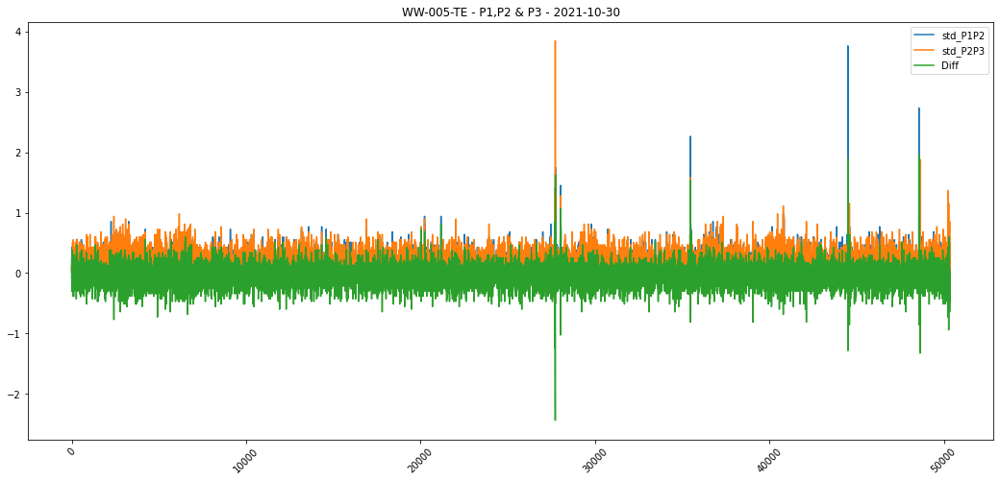

None

In [0]:
plt.figure(figsize=(18,8))

length = range(1, len(final_df_05_30['roll_std_P1P2'])+1)
plt.plot(length, final_df_05_30['roll_std_P1P2'], label='std_P1P2')
plt.plot(length, final_df_05_30['roll_std_P2P3'], label='std_P2P3')
plt.plot(length, final_df_05_30['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("WW-005-TE - P1,P2 & P3 - 2021-10-30")
print(plt.legend())
print(plt.show())

In [0]:
final_df_05_30.sort_values('Diff_Std_P1P2_P2P3',ascending=True)

Out[7]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
24160,WW-005-TE,2021-10-30T07:42:33.2,54.923077,45.796703,41.928571,9.126374,3.868132,False,False,7.131868,-1.571429,1.410328,3.846350,-2.43602
11135,WW-005-TE,2021-10-30T13:34:22.1,57.824176,47.005495,43.560440,10.818681,3.445055,False,False,10.818681,3.445055,0.384635,1.709489,-1.32485
30072,WW-005-TE,2021-10-30T13:34:21.1,59.758242,49.483516,43.620879,10.274725,5.862637,False,False,10.576923,3.203297,0.555584,1.880438,-1.32485
76622,WW-005-TE,2021-10-30T12:23:31,54.802198,44.406593,42.653846,10.395604,1.752747,False,False,10.758242,2.296703,0.256423,1.538540,-1.28212
52846,WW-005-TE,2021-10-30T07:42:02.3,55.467033,44.587912,41.686813,10.879121,2.901099,False,False,10.879121,1.027473,0.085474,1.324854,-1.23938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31331,WW-005-TE,2021-10-30T07:42:51.2,52.263736,47.005495,41.747253,5.258242,5.258242,False,False,7.736264,5.439560,1.752226,0.128212,1.62401
51359,WW-005-TE,2021-10-30T12:23:39,54.983516,45.554945,42.774725,9.428571,2.780220,False,False,6.769231,2.719780,1.880438,0.042737,1.83770
14023,WW-005-TE,2021-10-30T12:23:27,55.346154,44.708791,42.714286,10.637363,1.994505,False,False,5.318681,-0.664835,3.760876,1.880438,1.88044
69056,WW-005-TE,2021-10-30T13:33:02.4,54.439560,44.467033,43.620879,9.972527,0.846154,False,False,6.104396,-0.241758,2.735182,0.769270,1.96591


### Max Std()

In [0]:
# Create dfs based on max diff in std column in descending order

df_std_max1 = final_df_05_30[(final_df_05_30.dt >= '2021-10-30T07:42:20.2') & (final_df_05_30.dt <= '2021-10-30T07:42:45.2')]



In [0]:
df_std_max1

Out[9]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
13909,WW-005-TE,2021-10-30T07:42:20.2,52.021978,45.917582,41.686813,6.104396,4.230769,False,False,5.862637,4.230769,0.170949,0.170949,0.00000
55532,WW-005-TE,2021-10-30T07:42:21.2,51.417582,46.038462,41.747253,5.379121,4.291209,False,False,5.862637,4.230769,0.512847,0.042737,0.47011
16618,WW-005-TE,2021-10-30T07:42:22.2,51.357143,46.038462,41.626374,5.318681,4.412088,False,False,5.379121,4.291209,0.042737,0.085474,-0.04274
24160,WW-005-TE,2021-10-30T07:42:33.2,54.923077,45.796703,41.928571,9.126374,3.868132,False,False,7.131868,-1.571429,1.410328,3.846350,-2.43602
12002,WW-005-TE,2021-10-30T07:42:34.2,57.945055,47.609890,41.807692,10.335165,5.802198,False,False,9.126374,3.868132,0.854744,1.367591,-0.51285
50431,WW-005-TE,2021-10-30T07:42:35.2,57.219780,47.247253,41.807692,9.972527,5.439560,False,False,9.972527,5.439560,0.256423,0.256423,-0.00000
19982,WW-005-TE,2021-10-30T07:42:36.2,58.307692,47.791209,41.807692,10.516484,5.983516,False,False,10.335165,5.802198,0.384635,0.384635,0.00000
41893,WW-005-TE,2021-10-30T07:42:37.2,57.098901,47.005495,41.747253,10.093407,5.258242,False,False,10.093407,5.439560,0.299161,0.512847,-0.21369
28012,WW-005-TE,2021-10-30T07:42:38.2,54.258242,45.675824,41.626374,8.582418,4.049451,False,False,10.093407,5.258242,1.068431,0.854744,0.21369
82850,WW-005-TE,2021-10-30T07:42:39.2,56.434066,46.763736,41.747253,9.670330,5.016484,False,False,9.670330,5.016484,0.769270,0.683796,0.08547


In [0]:
# #IMP - We do see Backpressure just before we see max std in P2P3 sensor

raw_1stMax_05 = df_pd_05[(df_pd_05.dt >= '2021-10-30T07:42:20.2') & (df_pd_05.dt <= '2021-10-30T07:42:39.2')]

In [0]:
raw_1stMax_05

Out[36]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
13909,WW-005-TE,2021-10-30T07:42:20.2,52.021978,45.917582,41.686813,6.104396,4.230769,False,False,5.862637,4.230769,0.170949,0.170949,0.00000
55532,WW-005-TE,2021-10-30T07:42:21.2,51.417582,46.038462,41.747253,5.379121,4.291209,False,False,5.862637,4.230769,0.512847,0.042737,0.47011
16618,WW-005-TE,2021-10-30T07:42:22.2,51.357143,46.038462,41.626374,5.318681,4.412088,False,False,5.379121,4.291209,0.042737,0.085474,-0.04274
21438,WW-005-TE,2021-10-30T07:42:23.2,50.269231,45.615385,41.747253,4.653846,3.868132,False,False,5.318681,4.291209,0.470109,0.384635,0.08547
17093,WW-005-TE,2021-10-30T07:42:24.2,47.912088,45.313187,41.445055,2.598901,3.868132,False,False,4.653846,3.868132,1.453066,0.000000,1.45307
15798,WW-005-TE,2021-10-30T07:42:25.2,47.186813,44.829670,41.807692,2.357143,3.021978,False,False,2.598901,3.868132,0.170949,0.598321,-0.42737
62021,WW-005-TE,2021-10-30T07:42:26.2,41.263736,38.060440,41.868132,3.203297,-3.807692,True,False,2.598901,3.021978,0.598321,4.829306,-4.23099
5370,WW-005-TE,2021-10-30T07:42:27.2,39.692308,35.945055,41.807692,3.747253,-5.862637,True,False,3.203297,-3.807692,0.384635,1.453066,-1.06843
63825,WW-005-TE,2021-10-30T07:42:28.2,38.241758,34.796703,41.807692,3.445055,-7.010989,True,False,3.445055,-5.862637,0.213686,0.812007,-0.59832
11921,WW-005-TE,2021-10-30T07:42:29.2,35.884615,32.318681,41.807692,3.565934,-9.489011,True,False,3.565934,-7.010989,0.085474,1.752226,-1.66675


Legend

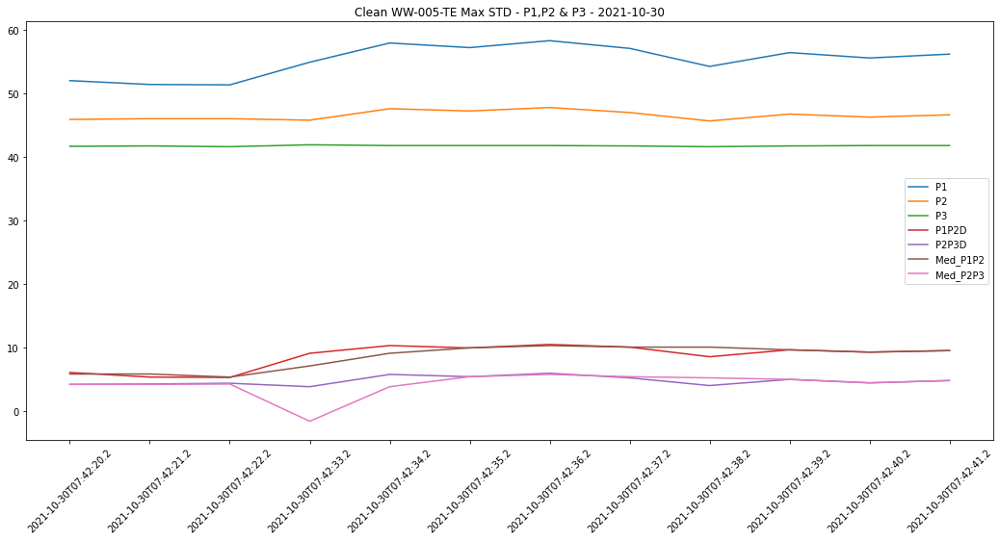

None

In [0]:
### CLEAN ####

plt.figure(figsize=(18,8))

#length = range(1, len(final_df_05_30['std_P1P2'])+1)
plt.plot(df_std_max1['dt'], df_std_max1['Pressure1_PSI'], label='P1')
plt.plot(df_std_max1['dt'], df_std_max1['Pressure2_PSI'], label='P2')
plt.plot(df_std_max1['dt'], df_std_max1['Pressure3_PSI'], label='P3')
plt.plot(df_std_max1['dt'], df_std_max1['P1P2Delta'], label='P1P2D')
plt.plot(df_std_max1['dt'], df_std_max1['P2P3Delta'], label='P2P3D')

plt.plot(df_std_max1['dt'], df_std_max1['roll_median_P1P2'], label='Med_P1P2')
plt.plot(df_std_max1['dt'], df_std_max1['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean WW-005-TE Max STD - P1,P2 & P3 - 2021-10-30")
print(plt.legend())
print(plt.show())

Legend

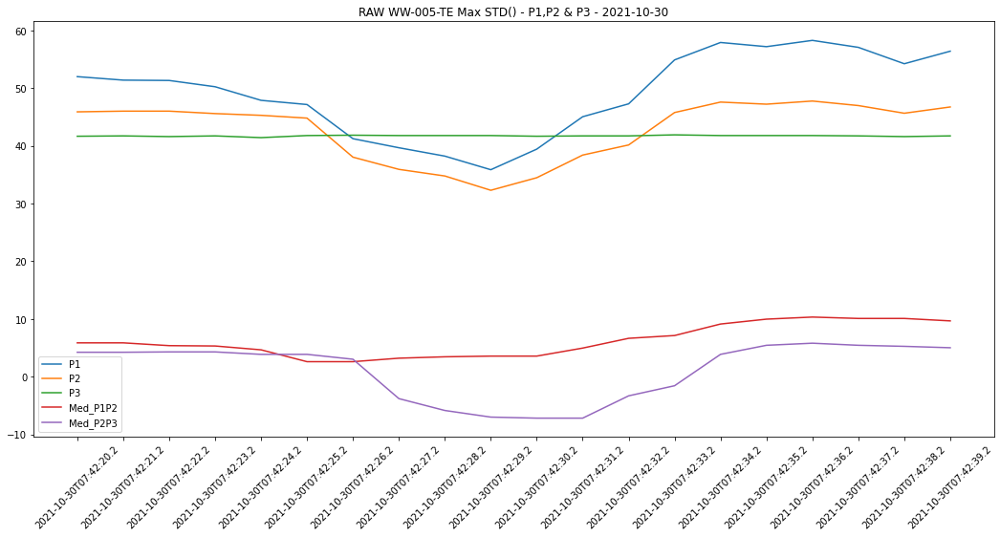

None

In [0]:
### RAW ####

plt.figure(figsize=(18,8))

#length = range(1, len(final_df_05_30['std_P1P2'])+1)
plt.plot(raw_1stMax_05['dt'], raw_1stMax_05['Pressure1_PSI'], label='P1')
plt.plot(raw_1stMax_05['dt'], raw_1stMax_05['Pressure2_PSI'], label='P2')
plt.plot(raw_1stMax_05['dt'], raw_1stMax_05['Pressure3_PSI'], label='P3')
#plt.plot(raw_1stMax_05['dt'], raw_1stMax_05['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(raw_1stMax_05['dt'], raw_1stMax_05['roll_std_P2P3'], label='STD_P2P3')

plt.plot(raw_1stMax_05['dt'], raw_1stMax_05['roll_median_P1P2'], label='Med_P1P2')
plt.plot(raw_1stMax_05['dt'], raw_1stMax_05['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("RAW WW-005-TE Max STD() - P1,P2 & P3 - 2021-10-30")
print(plt.legend())
print(plt.show())

In [0]:
raw_1stMax_05

Out[41]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
13909,WW-005-TE,2021-10-30T07:42:20.2,52.021978,45.917582,41.686813,6.104396,4.230769,False,False,5.862637,4.230769,0.170949,0.170949,0.00000
55532,WW-005-TE,2021-10-30T07:42:21.2,51.417582,46.038462,41.747253,5.379121,4.291209,False,False,5.862637,4.230769,0.512847,0.042737,0.47011
16618,WW-005-TE,2021-10-30T07:42:22.2,51.357143,46.038462,41.626374,5.318681,4.412088,False,False,5.379121,4.291209,0.042737,0.085474,-0.04274
21438,WW-005-TE,2021-10-30T07:42:23.2,50.269231,45.615385,41.747253,4.653846,3.868132,False,False,5.318681,4.291209,0.470109,0.384635,0.08547
17093,WW-005-TE,2021-10-30T07:42:24.2,47.912088,45.313187,41.445055,2.598901,3.868132,False,False,4.653846,3.868132,1.453066,0.000000,1.45307
15798,WW-005-TE,2021-10-30T07:42:25.2,47.186813,44.829670,41.807692,2.357143,3.021978,False,False,2.598901,3.868132,0.170949,0.598321,-0.42737
62021,WW-005-TE,2021-10-30T07:42:26.2,41.263736,38.060440,41.868132,3.203297,-3.807692,True,False,2.598901,3.021978,0.598321,4.829306,-4.23099
5370,WW-005-TE,2021-10-30T07:42:27.2,39.692308,35.945055,41.807692,3.747253,-5.862637,True,False,3.203297,-3.807692,0.384635,1.453066,-1.06843
63825,WW-005-TE,2021-10-30T07:42:28.2,38.241758,34.796703,41.807692,3.445055,-7.010989,True,False,3.445055,-5.862637,0.213686,0.812007,-0.59832
11921,WW-005-TE,2021-10-30T07:42:29.2,35.884615,32.318681,41.807692,3.565934,-9.489011,True,False,3.565934,-7.010989,0.085474,1.752226,-1.66675


In [0]:
df_std_max1.P1P2Delta.std(),df_std_max1.P2P3Delta.std(),df_std_max1.std_P1P2.sum(),df_std_max1.std_P2P3.sum(),df_std_max1.Diff_Std_P1P2_P2P3.sum()

Out[60]: (1.929309627773117,
 0.6970230139636194,
 6.1968973406183885,
 8.846605169020705,
 -2.6497100000000002)

### 2nd Highest STD()

In [0]:
# Create dfs based on max diff in std column in descending order

df_std_max2 = final_df_05_30[(final_df_05_30.dt >= '2021-10-30T13:34:16.1') & (final_df_05_30.dt <= '2021-10-30T13:34:28.1')]

raw_2ndMax_05 = df_pd_05[(df_pd_05.dt >= '2021-10-30T13:34:16.1') & (df_pd_05.dt <= '2021-10-30T13:34:28.1')]


In [0]:
# #IMP - We do see Backpressure just before we see max std in P2P3 sensor

df_std_max2

Out[15]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
84346,WW-005-TE,2021-10-30T13:34:16.1,54.016484,44.225275,43.681319,9.791209,0.543956,False,False,9.791209,0.543956,0.000000,0.000000,0.00000
70416,WW-005-TE,2021-10-30T13:34:17.1,53.895604,44.104396,43.681319,9.791209,0.423077,False,False,9.791209,0.543956,0.000000,0.085474,-0.08547
2516,WW-005-TE,2021-10-30T13:34:18.1,54.318681,44.346154,43.620879,9.972527,0.725275,False,False,9.791209,0.543956,0.128212,0.213686,-0.08547
1633,WW-005-TE,2021-10-30T13:34:19.1,56.857143,46.280220,43.560440,10.576923,2.719780,False,False,9.972527,0.725275,0.427372,1.410328,-0.98296
78388,WW-005-TE,2021-10-30T13:34:20.1,58.005495,46.945055,43.741758,11.060440,3.203297,False,False,10.576923,2.719780,0.341898,0.341898,0.00000
30072,WW-005-TE,2021-10-30T13:34:21.1,59.758242,49.483516,43.620879,10.274725,5.862637,False,False,10.576923,3.203297,0.555584,1.880438,-1.32485
11135,WW-005-TE,2021-10-30T13:34:22.1,57.824176,47.005495,43.560440,10.818681,3.445055,False,False,10.818681,3.445055,0.384635,1.709489,-1.32485
36662,WW-005-TE,2021-10-30T13:34:23.1,57.884615,47.307692,43.439560,10.576923,3.868132,False,False,10.576923,3.868132,0.170949,0.299161,-0.12821
84029,WW-005-TE,2021-10-30T13:34:24.1,56.373626,46.521978,43.681319,9.851648,2.840659,False,False,10.576923,3.445055,0.512847,0.726533,-0.21369
29701,WW-005-TE,2021-10-30T13:34:25.1,56.434066,46.582418,43.620879,9.851648,2.961538,False,False,9.851648,2.961538,0.000000,0.085474,-0.08547


In [0]:
raw_2ndMax_05

Out[16]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
84346,WW-005-TE,2021-10-30T13:34:16.1,54.016484,44.225275,43.681319,9.791209,0.543956,False,False,9.791209,0.543956,0.000000,0.000000,0.00000
70416,WW-005-TE,2021-10-30T13:34:17.1,53.895604,44.104396,43.681319,9.791209,0.423077,False,False,9.791209,0.543956,0.000000,0.085474,-0.08547
2516,WW-005-TE,2021-10-30T13:34:18.1,54.318681,44.346154,43.620879,9.972527,0.725275,False,False,9.791209,0.543956,0.128212,0.213686,-0.08547
1633,WW-005-TE,2021-10-30T13:34:19.1,56.857143,46.280220,43.560440,10.576923,2.719780,False,False,9.972527,0.725275,0.427372,1.410328,-0.98296
78388,WW-005-TE,2021-10-30T13:34:20.1,58.005495,46.945055,43.741758,11.060440,3.203297,False,False,10.576923,2.719780,0.341898,0.341898,0.00000
30072,WW-005-TE,2021-10-30T13:34:21.1,59.758242,49.483516,43.620879,10.274725,5.862637,False,False,10.576923,3.203297,0.555584,1.880438,-1.32485
11135,WW-005-TE,2021-10-30T13:34:22.1,57.824176,47.005495,43.560440,10.818681,3.445055,False,False,10.818681,3.445055,0.384635,1.709489,-1.32485
36662,WW-005-TE,2021-10-30T13:34:23.1,57.884615,47.307692,43.439560,10.576923,3.868132,False,False,10.576923,3.868132,0.170949,0.299161,-0.12821
84029,WW-005-TE,2021-10-30T13:34:24.1,56.373626,46.521978,43.681319,9.851648,2.840659,False,False,10.576923,3.445055,0.512847,0.726533,-0.21369
29701,WW-005-TE,2021-10-30T13:34:25.1,56.434066,46.582418,43.620879,9.851648,2.961538,False,False,9.851648,2.961538,0.000000,0.085474,-0.08547


Legend

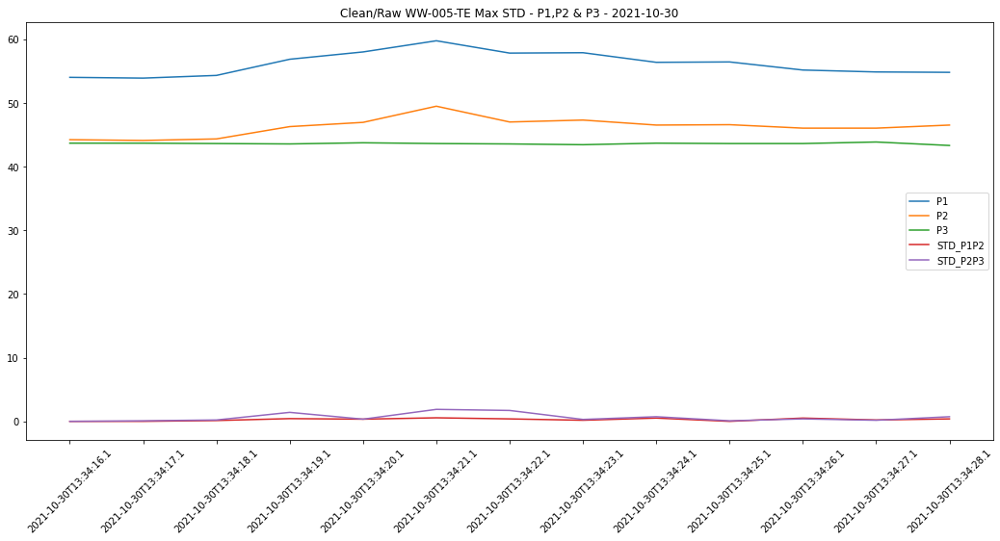

None

In [0]:
### RAW ####

plt.figure(figsize=(18,8))

#length = range(1, len(final_df_05_30['std_P1P2'])+1)
plt.plot(raw_2ndMax_05['dt'], raw_2ndMax_05['Pressure1_PSI'], label='P1')
plt.plot(raw_2ndMax_05['dt'], raw_2ndMax_05['Pressure2_PSI'], label='P2')
plt.plot(raw_2ndMax_05['dt'], raw_2ndMax_05['Pressure3_PSI'], label='P3')
plt.plot(raw_2ndMax_05['dt'], raw_2ndMax_05['roll_std_P1P2'], label='STD_P1P2')
plt.plot(raw_2ndMax_05['dt'], raw_2ndMax_05['roll_std_P2P3'], label='STD_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean/Raw WW-005-TE Max STD - P1,P2 & P3 - 2021-10-30")
print(plt.legend())
print(plt.show())

Legend

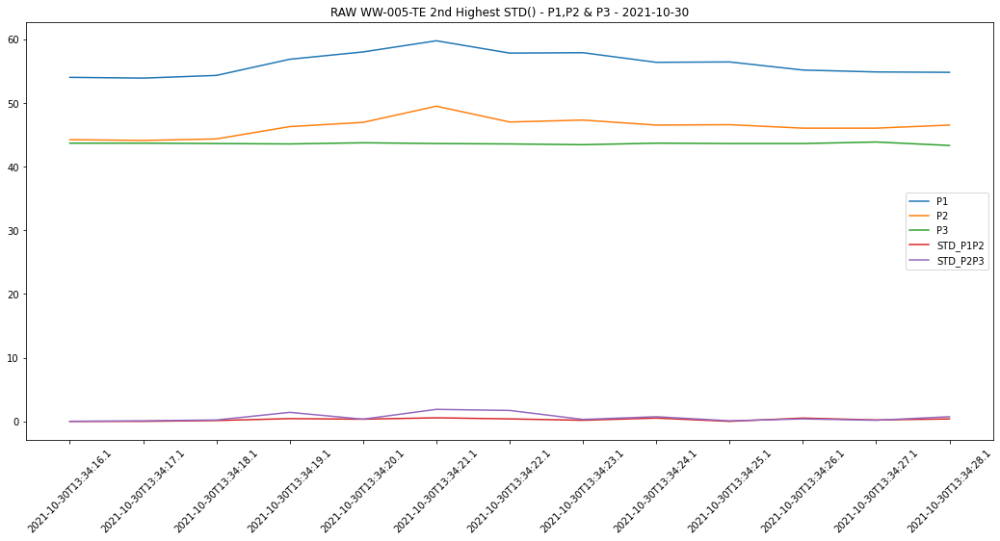

None

In [0]:
### Raw ####

plt.figure(figsize=(18,8))

#length = range(1, len(final_df_05_30['std_P1P2'])+1)
plt.plot(df_std_max2['dt'], df_std_max2['Pressure1_PSI'], label='P1')
plt.plot(df_std_max2['dt'], df_std_max2['Pressure2_PSI'], label='P2')
plt.plot(df_std_max2['dt'], df_std_max2['Pressure3_PSI'], label='P3')
plt.plot(df_std_max2['dt'], df_std_max2['roll_std_P1P2'], label='STD_P1P2')
plt.plot(df_std_max2['dt'], df_std_max2['roll_std_P2P3'], label='STD_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("RAW WW-005-TE 2nd Highest STD() - P1,P2 & P3 - 2021-10-30")
print(plt.legend())
print(plt.show())

In [0]:
final_df_05_30.sort_values('std_P2P3',ascending=False)

--------------------------------------------------------------------------- 
 KeyError Traceback (most recent call last)
 <command-3369478843342958> in <module> 
 ----> 1 final_df_05_30 . sort_values ( 'std_P2P3' , ascending = False ) 

 /databricks/python/lib/python3.8/site-packages/pandas/core/frame.py in sort_values (self, by, axis, ascending, inplace, kind, na_position, ignore_index, key) 
 5453 
 5454 by = by [ 0 ] 
 -> 5455 k = self . _get_label_or_level_values ( by , axis = axis ) 
 5456 
 5457 # need to rewrap column in Series to apply key function 

 /databricks/python/lib/python3.8/site-packages/pandas/core/generic.py in _get_label_or_level_values (self, key, axis) 
 1682 values = self . axes [ axis ] . get_level_values ( key ) . _values
 1683 else : 
 -> 1684 raise KeyError ( key ) 
 1685 
 1686 # Check for duplicates 

 KeyError : 'std_P2P3'

## Device # WW8

In [0]:
dev_WW8 = data[data['Device']=='WW8'].sort_values(['Device','year','month','W_O_M'])

In [0]:
dev_WW8['W-M'] = dev_WW8['W_O_M'].values +'-' + dev_WW8['month'].map(str)
#x = dev_WW8.sort_values(['year','month'])

In [0]:
dev_WW8.head()

Out[55]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,W-M
174,1,8,2021,WW8,8.328571,1.914286,1-8
454,2,8,2021,WW8,8.371429,1.914286,2-8
734,3,8,2021,WW8,8.371429,1.942857,3-8
1010,4,8,2021,WW8,8.185714,1.857143,4-8
1285,5,8,2021,WW8,8.133333,1.933333,5-8


Legend

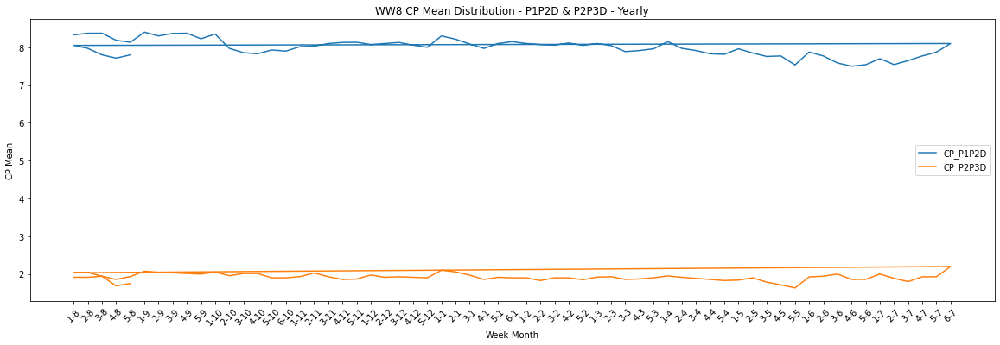

None

In [0]:
# CP Mean Spread for WW8 Over the months for P1P2D and P2P3D

plt.figure(figsize=(20,6))
plt.plot(dev_WW8['W-M'], dev_WW8['CP_P1P2D'], label='CP_P1P2D')
plt.plot(dev_WW8['W-M'], dev_WW8['CP_P2P3D'], label='CP_P2P3D')

plt.xticks(rotation = 45)
plt.title("WW8 CP Mean Distribution - P1P2D & P2P3D - Yearly")
plt.xlabel("Week-Month")
plt.ylabel("CP Mean")
print(plt.legend())
print(plt.show())

In [0]:
%sql

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id = 'WW8' and Date between '2021-11-11' and '2021-11-14'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW8,2021-11-13,0.3,20,38,919,7.993411376436441,1.866194741058724,8.159340659340657,2.054945054945051,8.038461538461547,1.9340659340659414
WW8,2021-11-13,0.3,30,5,180,8.074725274725271,1.9750305250305256,8.159340659340657,2.054945054945051,8.09890109890111,2.054945054945051
WW8,2021-11-11,0.3,20,56,1348,7.86732073564422,1.9145172335083331,7.796703296703299,1.9945054945054892,7.857142857142861,1.9340659340659272
WW8,2021-11-11,0.2,20,1,24,7.972985347985347,1.9516941391941411,8.038461538461533,1.9340659340659414,8.038461538461533,1.9340659340659414
WW8,2021-11-11,0.3,30,6,201,7.837597725657422,1.9175277458859525,7.736263736263737,1.9945054945054892,7.796703296703299,1.9340659340659272
WW8,2021-11-12,0.3,20,20,458,8.322712222275538,2.222407505158596,8.280219780219781,2.236263736263737,8.340659340659329,2.236263736263737
WW8,2021-11-12,0.3,30,1,34,8.34243697478992,2.266483516483515,8.280219780219781,2.296703296703299,8.280219780219781,2.296703296703292
WW8,2021-11-14,0.3,30,35,1218,8.00595914758478,1.8708475432613472,8.098901098901095,2.054945054945051,8.038461538461547,1.9340659340659272
WW8,2021-11-14,0.2,20,2,43,7.9864554050600605,1.7611806797853296,8.401098901098905,1.5109890109890074,8.098901098901095,1.8736263736263652
WW8,2021-11-14,0.3,20,236,5804,7.9667546443907495,1.8247248960550302,8.219780219780219,2.054945054945051,8.038461538461533,1.9340659340659272


In [0]:
dev_WW8['std_CP_P1P2'] = dev_WW8['CP_P1P2D'].rolling(2).std()
dev_WW8['std_CP_P2P3'] = dev_WW8['CP_P2P3D'].rolling(2).std()

dev_WW8['Diff_Std_P1P2_P2P3'] = dev_WW8['std_CP_P1P2'] - dev_WW8['std_CP_P2P3']
dev_WW8['Diff_Std_P1P2_P2P3'] = dev_WW8['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
dev_WW8.sort_values('Diff_Std_P1P2_P2P3')

Out[58]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,W-M,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
1031,4,8,2022,WW8,7.714286,1.685714,4-8,0.060609,0.181827,-0.12122
194,1,8,2022,WW8,8.050000,2.033333,1-8,0.035355,0.117851,-0.08250
538,2,11,2021,WW8,8.028571,2.028571,2-11,0.008418,0.067344,-0.05893
603,3,2,2022,WW8,8.057143,1.900000,3-2,0.010102,0.050508,-0.04041
972,4,6,2022,WW8,7.500000,1.857143,4-6,0.060609,0.101015,-0.04041
949,4,5,2022,WW8,7.771429,1.714286,4-5,0.010102,0.050508,-0.04041
277,1,12,2021,WW8,8.075000,1.975000,1-12,0.041248,0.076603,-0.03536
1427,6,7,2022,WW8,8.100000,2.200000,6-7,0.161624,0.191929,-0.03030
1090,4,11,2021,WW8,8.128571,1.857143,4-11,0.020203,0.050508,-0.03030
321,2,2,2022,WW8,8.071429,1.828571,2-2,0.020203,0.050508,-0.03030


In [0]:
#query_val_WW8 = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device in ('WW8') and Date between '2021-11-01' and '2021-11-30'";
query_val_WW8 = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device in ('WW8') and Date between '2022-08-01' and '2022-08-31'";
query_val_df_WW8 = spark.sql(query_val_WW8);
    
df_val_pd_WW8 = query_val_df_WW8.toPandas().sort_values('Date')

In [0]:
df_val_pd_WW8

Out[60]:

,Device,Date,CP_P1P2D,CP_P2P3D
8,WW8,2022-08-01,8.1,2.1
2,WW8,2022-08-02,7.8,1.9
0,WW8,2022-08-03,8.3,2.2
3,WW8,2022-08-04,8.0,2.0
4,WW8,2022-08-05,8.0,2.0
5,WW8,2022-08-06,8.1,2.0
6,WW8,2022-08-07,8.1,1.9
7,WW8,2022-08-08,8.2,2.1
1,WW8,2022-08-09,8.0,2.1
27,WW8,2022-08-10,8.2,2.2


In [0]:
# query_WW8 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-11-12%'  and ConnectionDeviceID = 'WW8' "

query_WW8 = "select ID,Date,Pattern,Start_Time,End_Time,SD_P1, SD_P2,SD_P3, SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter from Daily_Cp_Patterns where ID='WW8' and Date between '2021-08-01' and '2022-08-31' ";

df_WW8 = spark.sql(query_WW8)

df_pd_WW8 = df_WW8.toPandas()

In [0]:
df_pd_WW8.sort_values('SD_P2P3D',ascending=False).head(16)

Out[70]:

,ID,Date,Pattern,Start_Time,End_Time,SD_P1,SD_P2,SD_P3,SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter
26667,WW8,2021-09-11,22586,2021-09-11 20:29:24.700,2021-09-11 20:29:45.700,0.1792,0.2588,0.0843,0.2234,0.3076,22,0.3,20
33524,WW8,2022-07-23,9001,2022-07-23 08:20:31.100,2022-07-23 08:20:54.100,0.2900,0.2537,0.0938,0.2068,0.2986,24,0.3,20
11168,WW8,2021-08-22,14992,2021-08-22 16:09:53.000,2021-08-22 16:10:13.900,0.1960,0.2392,0.1270,0.1658,0.2938,21,0.3,20
33103,WW8,2022-01-15,23042,2022-01-15 19:59:54.300,2022-01-15 20:00:15.300,0.2651,0.2554,0.0713,0.2491,0.2931,22,0.3,20
28172,WW8,2022-08-15,3186,2022-08-15 03:44:08.600,2022-08-15 03:44:29.600,0.2076,0.2314,0.1397,0.1706,0.2914,22,0.3,20
25167,WW8,2022-07-25,832,2022-07-25 00:58:00.100,2022-07-25 00:58:19.100,0.1834,0.2731,0.0705,0.2443,0.2904,20,0.3,20
34268,WW8,2022-08-19,1825,2022-08-19 01:36:03.200,2022-08-19 01:36:22.300,0.2175,0.2870,0.0592,0.1929,0.2900,20,0.3,20
34771,WW8,2022-05-28,24563,2022-05-28 21:19:04.600,2022-05-28 21:19:24.700,0.2520,0.2655,0.1065,0.1996,0.2878,21,0.3,20
24971,WW8,2022-05-31,21922,2022-05-31 18:47:23.700,2022-05-31 18:47:44.700,0.2864,0.2790,0.0698,0.1474,0.2869,22,0.3,20
11138,WW8,2021-08-22,18274,2021-08-22 19:40:14.500,2021-08-22 19:40:36.400,0.2766,0.2700,0.0823,0.1845,0.2848,22,0.3,20


In [0]:
df_pd_WW8.sort_values('SD_P1P2D',ascending=False).head(10)

Out[65]:

,ID,Date,Pattern,Start_Time,End_Time,SD_P1,SD_P2,SD_P3,SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter
46810,WW8,2022-01-27,31890,2022-01-27 23:25:09.400,2022-01-27 23:25:28.400,0.2765,0.1736,0.1086,0.3779,0.1457,20,0.3,20
5658,WW8,2022-06-26,14914,2022-06-26 16:48:09.300,2022-06-26 16:48:28.300,0.2766,0.1883,0.0813,0.3729,0.2085,20,0.3,20
41896,WW8,2022-06-22,8578,2022-06-22 08:21:37.100,2022-06-22 08:22:01.000,0.2902,0.1386,0.0699,0.3513,0.1489,25,0.3,20
27707,WW8,2022-05-21,7741,2022-05-21 07:19:19.100,2022-05-21 07:19:41.100,0.2470,0.2088,0.0500,0.3503,0.2188,23,0.3,20
22890,WW8,2021-12-01,6872,2021-12-01 05:44:15.700,2021-12-01 05:44:35.700,0.2967,0.1391,0.0548,0.3498,0.1422,21,0.3,20
33978,WW8,2021-12-07,10274,2021-12-07 08:18:02.800,2021-12-07 08:18:22.400,0.2644,0.1662,0.0902,0.3433,0.1544,20,0.3,20
17910,WW8,2022-05-01,20995,2022-05-01 21:17:54.400,2022-05-01 21:18:17.300,0.2703,0.1510,0.0997,0.3427,0.1790,24,0.3,20
39294,WW8,2022-04-08,5892,2022-04-08 05:30:56.300,2022-04-08 05:31:18.300,0.2651,0.1457,0.0549,0.3394,0.1799,23,0.3,20
1404,WW8,2021-11-07,18468,2021-11-07 19:10:52.600,2021-11-07 19:11:14.500,0.2942,0.2533,0.0586,0.3369,0.2641,23,0.3,20
25974,WW8,2022-04-02,11520,2022-04-02 10:47:03.100,2022-04-02 10:47:22.100,0.2517,0.1763,0.0447,0.3359,0.1723,20,0.3,20


In [0]:
# MedMean summary table
data[((data['Device']=='WW8'))& (data['month']==8) & (data['year']==2022) ].sort_values(['Device','year','month','W_O_M'])

Out[67]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
194,1,8,2022,WW8,8.050000,2.033333
475,2,8,2022,WW8,7.971429,2.042857
755,3,8,2022,WW8,7.800000,1.942857
1031,4,8,2022,WW8,7.714286,1.685714
1304,5,8,2022,WW8,7.800000,1.750000


In [0]:
%sql

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id='WW8' and Date between '2022-08-20' and '2022-08-30'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW8,2022-08-21,0.3,30,43,1540,7.872409733124034,1.9032574568289045,7.857142857142861,2.054945054945051,7.917582417582423,1.9945054945054892
WW8,2022-08-21,0.2,20,3,62,7.7586848635235715,1.9291917759659725,7.615384615384613,1.9945054945055034,7.796703296703299,1.9340659340659414
WW8,2022-08-21,0.3,20,253,6340,7.799277221201529,1.8141973168787213,7.796703296703299,1.9945054945054892,7.917582417582409,1.9340659340659272
WW8,2022-08-23,0.3,20,74,1743,7.351017886301874,1.4013794581780814,7.131868131868131,1.7527472527472554,7.313186813186803,1.5109890109890074
WW8,2022-08-23,0.2,20,1,21,6.9850863422291996,0.6389324960753501,6.950549450549445,0.6043956043956058,6.950549450549445,0.6043956043956058
WW8,2022-08-23,0.3,30,8,274,7.217895243442689,1.193129862837889,7.071428571428569,0.6043956043956058,7.071428571428569,1.2087912087911974
WW8,2022-08-22,0.3,20,160,3976,7.283575076834633,1.4160125588697001,7.554945054945051,1.6318681318681314,7.313186813186817,1.5109890109890216
WW8,2022-08-22,0.3,60,1,66,7.464285714285709,1.646520146520145,7.434065934065927,1.6318681318681314,7.434065934065927,1.6318681318681314
WW8,2022-08-22,0.3,30,21,795,7.353175755062546,1.5004215909876284,7.554945054945051,1.6923076923076934,7.434065934065927,1.6318681318681314
WW8,2022-08-22,0.2,20,1,20,6.660439560439562,0.6890109890109926,6.708791208791212,0.7252747252747298,6.678571428571431,0.6950549450549488


In [0]:
# '2022-08-22'

query_WW8 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2022-08-22%'  and ConnectionDeviceID = 'WW8' "

df_WW8 = spark.sql(query_WW8)

df_WW8_pd = df_WW8.toPandas().sort_values('dt')

In [0]:
df_WW8_pd

Out[21]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
14529,WW8,2022-08-22T00:00:00.6,46.401099,38.423077,37.153846,7.978022,1.269231,False,False
35338,WW8,2022-08-22T00:00:01.6,46.521978,38.604396,36.549451,7.917582,2.054945,False,False
44135,WW8,2022-08-22T00:00:02.6,46.703297,38.664835,36.609890,8.038462,2.054945,False,False
9686,WW8,2022-08-22T00:00:03.6,46.582418,38.302198,36.609890,8.280220,1.692308,False,False
19304,WW8,2022-08-22T00:00:04.6,46.582418,38.543956,36.609890,8.038462,1.934066,False,False
...,...,...,...,...,...,...,...,...,...
50413,WW8,2022-08-22T23:59:55.8,42.895604,36.247253,35.642857,6.648352,0.604396,False,False
55137,WW8,2022-08-22T23:59:56.8,42.895604,36.247253,35.401099,6.648352,0.846154,False,False
34905,WW8,2022-08-22T23:59:57.8,43.439560,36.307692,35.703297,7.131868,0.604396,False,False
45348,WW8,2022-08-22T23:59:58.8,42.956044,36.851648,35.461538,6.104396,1.390110,False,False


In [0]:
df_WW8_pd['roll_median_P1P2'] = df_WW8_pd['P1P2Delta'].rolling(3).median()
df_WW8_pd['roll_median_P2P3'] = df_WW8_pd['P2P3Delta'].rolling(3).median()


df_WW8_pd['roll_std_P1P2'] = df_WW8_pd['P1P2Delta'].rolling(2).std()
df_WW8_pd['roll_std_P2P3'] = df_WW8_pd['P2P3Delta'].rolling(2).std()

df_WW8_pd['Diff_Std_P1P2_P2P3'] = df_WW8_pd['roll_std_P1P2'] - df_WW8_pd['roll_std_P2P3']
df_WW8_pd['Diff_Std_P1P2_P2P3'] = df_WW8_pd['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
df_WW8_pd.sort_values('Diff_Std_P1P2_P2P3',ascending=True)

Out[23]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
17921,WW8,2022-08-22T16:09:08.3,37.335165,33.043956,50.934066,4.291209,-17.890110,True,False,5.439560,-7.917582,2.948868,13.462225,-10.51336
54036,WW8,2022-08-22T16:06:53.7,46.945055,40.175824,44.164835,6.769231,-3.989011,True,False,4.653846,-10.637363,1.495803,8.718393,-7.22259
71238,WW8,2022-08-22T15:15:37.6,38.543956,34.554945,50.087912,3.989011,-15.532967,True,False,5.560440,-3.868132,1.111168,8.248284,-7.13712
49309,WW8,2022-08-22T16:09:09.3,44.104396,38.000000,44.043956,6.104396,-6.043956,True,False,6.104396,-6.043956,1.282117,8.376496,-7.09438
44473,WW8,2022-08-22T16:06:59.7,40.417582,36.247253,50.269231,4.170330,-14.021978,True,False,6.950549,-2.961538,2.478759,8.590182,-6.11142
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74655,WW8,2022-08-22T14:53:37.5,44.769231,37.395604,39.269231,7.373626,-1.873626,True,False,7.131868,-1.813187,1.282117,0.042737,1.23938
59767,WW8,2022-08-22T18:17:12.3,46.642857,36.730769,34.373626,9.912088,2.357143,False,False,8.219780,2.417582,1.367591,0.128212,1.23938
43824,WW8,2022-08-22T18:18:52.6,47.912088,40.357143,37.818681,7.554945,2.538462,False,False,8.401099,2.357143,1.453066,0.128212,1.32485
18110,WW8,2022-08-22T18:15:51.6,47.186813,39.390110,37.516484,7.796703,1.873626,False,False,8.098901,1.873626,1.410328,0.042737,1.36759


In [0]:
final_df_WW8 = df_WW8_pd.drop(df_WW8_pd.loc[(df_WW8_pd.P2P3Delta > 6) | (df_WW8_pd.P2P3Delta < 0 ) | (df_WW8_pd.P1P2Delta < 5 ) |(df_WW8_pd.P1P2Delta > 15 )].index)

In [0]:
final_df_WW8

Out[25]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
14529,WW8,2022-08-22T00:00:00.6,46.401099,38.423077,37.153846,7.978022,1.269231,False,False,NaN,NaN,NaN,NaN,NaN
35338,WW8,2022-08-22T00:00:01.6,46.521978,38.604396,36.549451,7.917582,2.054945,False,False,NaN,NaN,0.042737,0.555584,-0.51285
44135,WW8,2022-08-22T00:00:02.6,46.703297,38.664835,36.609890,8.038462,2.054945,False,False,7.978022,2.054945,0.085474,0.000000,0.08547
9686,WW8,2022-08-22T00:00:03.6,46.582418,38.302198,36.609890,8.280220,1.692308,False,False,8.038462,2.054945,0.170949,0.256423,-0.08547
19304,WW8,2022-08-22T00:00:04.6,46.582418,38.543956,36.609890,8.038462,1.934066,False,False,8.038462,1.934066,0.170949,0.170949,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50413,WW8,2022-08-22T23:59:55.8,42.895604,36.247253,35.642857,6.648352,0.604396,False,False,6.708791,0.725275,0.128212,0.085474,0.04274
55137,WW8,2022-08-22T23:59:56.8,42.895604,36.247253,35.401099,6.648352,0.846154,False,False,6.648352,0.725275,0.000000,0.170949,-0.17095
34905,WW8,2022-08-22T23:59:57.8,43.439560,36.307692,35.703297,7.131868,0.604396,False,False,6.648352,0.604396,0.341898,0.170949,0.17095
45348,WW8,2022-08-22T23:59:58.8,42.956044,36.851648,35.461538,6.104396,1.390110,False,False,6.648352,0.846154,0.726533,0.555584,0.17095


In [0]:
final_df_WW8.sort_values('Diff_Std_P1P2_P2P3',ascending=True)

Out[26]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
31113,WW8,2022-08-22T15:15:45.6,55.769231,47.065934,44.769231,8.703297,2.296703,False,False,8.280220,1.631868,2.393284,6.837956,-4.44467
85801,WW8,2022-08-22T16:09:07.3,52.263736,43.802198,42.653846,8.461538,1.148352,False,False,5.439560,-7.917582,2.136861,6.410583,-4.27372
74540,WW8,2022-08-22T15:16:44.3,57.038462,48.818681,45.736264,8.219780,3.082418,False,False,6.225275,-3.928571,1.410328,5.085730,-3.67540
6777,WW8,2022-08-22T14:40:00.2,46.642857,38.060440,35.703297,8.582418,2.357143,False,False,6.950549,0.423077,2.606971,5.812262,-3.20529
40558,WW8,2022-08-22T14:30:05.1,53.714286,45.252747,42.653846,8.461538,2.598901,False,False,6.285714,-3.807692,1.538540,4.701095,-3.16255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14776,WW8,2022-08-22T17:19:48.2,46.340659,38.181319,37.153846,8.159341,1.027473,False,False,8.038462,1.027473,1.196642,0.042737,1.15391
59767,WW8,2022-08-22T18:17:12.3,46.642857,36.730769,34.373626,9.912088,2.357143,False,False,8.219780,2.417582,1.367591,0.128212,1.23938
43824,WW8,2022-08-22T18:18:52.6,47.912088,40.357143,37.818681,7.554945,2.538462,False,False,8.401099,2.357143,1.453066,0.128212,1.32485
18110,WW8,2022-08-22T18:15:51.6,47.186813,39.390110,37.516484,7.796703,1.873626,False,False,8.098901,1.873626,1.410328,0.042737,1.36759


### Max Std() in P2P3 case for WW8

In [0]:
# Create dfs based on max diff in std column in descending order

df_std_max_WW8 = final_df_WW8[(final_df_WW8.dt >= '2022-08-22T16:08:20.3') & (final_df_WW8.dt <= '2022-08-22T16:09:15.3')]

In [0]:
df_std_max_WW8

Out[28]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
85801,WW8,2022-08-22T16:09:07.3,52.263736,43.802198,42.653846,8.461538,1.148352,False,False,5.43956,-7.917582,2.136861,6.410583,-4.27372


In [0]:
# #IMP - We do see Backpressure just before we see max std in P2P3 sensor

raw_maxStd_WW8 = df_WW8_pd[(df_WW8_pd.dt >= '2022-08-22T16:08:55.3') & (df_WW8_pd.dt <= '2022-08-22T16:09:13.3')]

In [0]:
raw_maxStd_WW8

Out[87]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
70372,WW8,2022-08-22T16:08:55.3,42.895604,37.335165,43.500000,5.560440,-6.164835,True,False,5.560440,-6.346154,0.256423,0.128212,0.12821
50076,WW8,2022-08-22T16:08:56.3,42.774725,37.214286,43.862637,5.560440,-6.648352,True,False,5.560440,-6.346154,0.000000,0.341898,-0.34190
28025,WW8,2022-08-22T16:08:57.3,42.653846,37.153846,43.681319,5.500000,-6.527473,True,False,5.560440,-6.527473,0.042737,0.085474,-0.04274
37845,WW8,2022-08-22T16:08:58.3,42.653846,36.791209,43.923077,5.862637,-7.131868,True,False,5.560440,-6.648352,0.256423,0.427372,-0.17095
72912,WW8,2022-08-22T16:08:59.3,42.774725,37.395604,43.923077,5.379121,-6.527473,True,False,5.500000,-6.527473,0.341898,0.427372,-0.08547
17937,WW8,2022-08-22T16:09:00.3,41.989011,36.549451,43.862637,5.439560,-7.313187,True,False,5.439560,-7.131868,0.042737,0.555584,-0.51285
23750,WW8,2022-08-22T16:09:01.3,41.868132,36.609890,43.862637,5.258242,-7.252747,True,False,5.379121,-7.252747,0.128212,0.042737,0.08547
23747,WW8,2022-08-22T16:09:03.3,43.741758,37.939560,43.862637,5.802198,-5.923077,True,False,5.439560,-7.252747,0.384635,0.940219,-0.55558
8688,WW8,2022-08-22T16:09:04.3,42.653846,37.032967,43.802198,5.620879,-6.769231,True,False,5.620879,-6.769231,0.128212,0.598321,-0.47011
44520,WW8,2022-08-22T16:09:05.3,34.131868,30.384615,43.741758,3.747253,-13.357143,True,False,5.620879,-6.769231,1.324854,4.658357,-3.33350


Legend

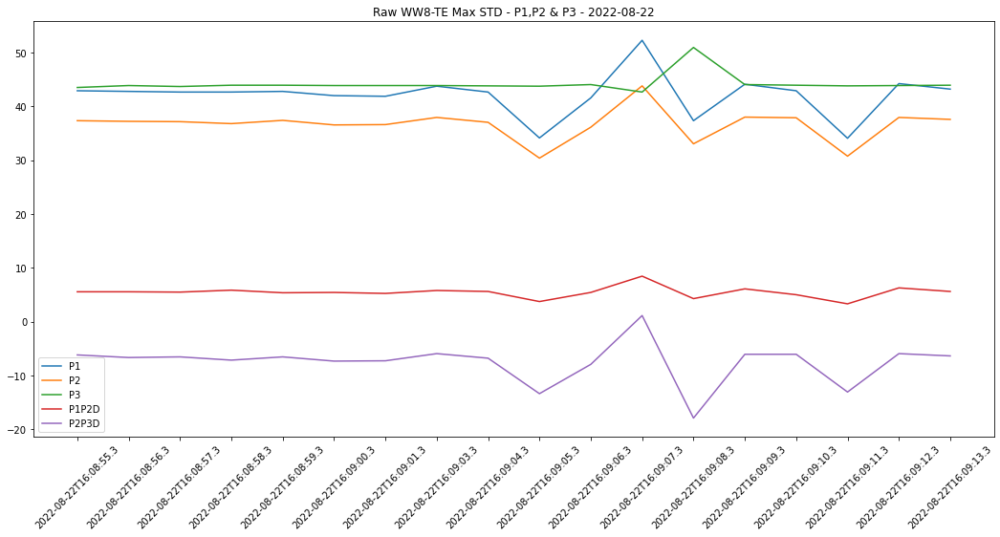

None

In [0]:
plt.figure(figsize=(18,8))

#length = range(1, len(final_df_05_30['std_P1P2'])+1)
plt.plot(raw_maxStd_WW8['dt'], raw_maxStd_WW8['Pressure1_PSI'], label='P1')
plt.plot(raw_maxStd_WW8['dt'], raw_maxStd_WW8['Pressure2_PSI'], label='P2')
plt.plot(raw_maxStd_WW8['dt'], raw_maxStd_WW8['Pressure3_PSI'], label='P3')
plt.plot(raw_maxStd_WW8['dt'], raw_maxStd_WW8['P1P2Delta'], label='P1P2D')
plt.plot(raw_maxStd_WW8['dt'], raw_maxStd_WW8['P2P3Delta'], label='P2P3D')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Raw WW8-TE Max STD - P1,P2 & P3 - 2022-08-22")
print(plt.legend())
print(plt.show())

In [0]:
final_df_WW8.sort_values('Diff_Std_P1P2_P2P3',ascending=True)

Out[89]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
31113,WW8,2022-08-22T15:15:45.6,55.769231,47.065934,44.769231,8.703297,2.296703,False,False,8.280220,1.631868,2.393284,6.837956,-4.44467
85801,WW8,2022-08-22T16:09:07.3,52.263736,43.802198,42.653846,8.461538,1.148352,False,False,5.439560,-7.917582,2.136861,6.410583,-4.27372
74540,WW8,2022-08-22T15:16:44.3,57.038462,48.818681,45.736264,8.219780,3.082418,False,False,6.225275,-3.928571,1.410328,5.085730,-3.67540
6777,WW8,2022-08-22T14:40:00.2,46.642857,38.060440,35.703297,8.582418,2.357143,False,False,6.950549,0.423077,2.606971,5.812262,-3.20529
40558,WW8,2022-08-22T14:30:05.1,53.714286,45.252747,42.653846,8.461538,2.598901,False,False,6.285714,-3.807692,1.538540,4.701095,-3.16255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14776,WW8,2022-08-22T17:19:48.2,46.340659,38.181319,37.153846,8.159341,1.027473,False,False,8.038462,1.027473,1.196642,0.042737,1.15391
59767,WW8,2022-08-22T18:17:12.3,46.642857,36.730769,34.373626,9.912088,2.357143,False,False,8.219780,2.417582,1.367591,0.128212,1.23938
43824,WW8,2022-08-22T18:18:52.6,47.912088,40.357143,37.818681,7.554945,2.538462,False,False,8.401099,2.357143,1.453066,0.128212,1.32485
18110,WW8,2022-08-22T18:15:51.6,47.186813,39.390110,37.516484,7.796703,1.873626,False,False,8.098901,1.873626,1.410328,0.042737,1.36759


### Max Std()

In [0]:
# Create dfs based on max diff in std column in descending order

df_std_max1_WW8 = final_df_WW8[(final_df_WW8.dt >= '2022-08-22T15:15:30.6') & (final_df_WW8.dt <= '2022-08-22T15:16:29.6')]



In [0]:
df_std_max1_WW8

Out[34]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
77058,WW8,2022-08-22T15:15:43.6,53.351648,45.071429,43.439560,8.280220,1.631868,False,False,6.285714,-3.324176,1.410328,3.504452,-2.09412
31113,WW8,2022-08-22T15:15:45.6,55.769231,47.065934,44.769231,8.703297,2.296703,False,False,8.280220,1.631868,2.393284,6.837956,-4.44467
74503,WW8,2022-08-22T15:16:07.6,55.829670,47.065934,44.890110,8.763736,2.175824,False,False,6.708791,-3.021978,1.581277,4.230985,-2.64971
74518,WW8,2022-08-22T15:16:22.6,56.978022,48.456044,45.494505,8.521978,2.961538,False,False,6.225275,-3.203297,1.624014,4.359197,-2.73518


In [0]:
# #IMP - We do see Backpressure just before we see max std in P2P3 sensor

raw_df_std_max1_WW8 = df_WW8_pd[(df_WW8_pd.dt >= '2022-08-22T15:15:30.6') & (df_WW8_pd.dt <= '2022-08-22T15:15:59.6')]

In [0]:
raw_df_std_max1_WW8

Out[97]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
46302,WW8,2022-08-22T15:15:30.6,47.065934,41.021978,44.043956,6.043956,-3.021978,True,False,6.285714,-3.021978,0.170949,0.341898,-0.17095
10597,WW8,2022-08-22T15:15:31.6,47.186813,41.021978,43.802198,6.164835,-2.780220,True,False,6.164835,-3.021978,0.085474,0.170949,-0.08547
56286,WW8,2022-08-22T15:15:32.6,47.126374,41.021978,44.104396,6.104396,-3.082418,True,False,6.104396,-3.021978,0.042737,0.213686,-0.17095
56288,WW8,2022-08-22T15:15:33.6,47.065934,40.780220,44.104396,6.285714,-3.324176,True,False,6.164835,-3.082418,0.128212,0.170949,-0.04274
51336,WW8,2022-08-22T15:15:34.6,46.703297,40.659341,44.043956,6.043956,-3.384615,True,False,6.104396,-3.324176,0.170949,0.042737,0.12821
71241,WW8,2022-08-22T15:15:35.6,46.945055,40.357143,44.164835,6.587912,-3.807692,True,False,6.285714,-3.384615,0.384635,0.299161,0.08547
77059,WW8,2022-08-22T15:15:36.6,45.736264,40.175824,44.043956,5.560440,-3.868132,True,False,6.043956,-3.807692,0.726533,0.042737,0.68380
71238,WW8,2022-08-22T15:15:37.6,38.543956,34.554945,50.087912,3.989011,-15.532967,True,False,5.560440,-3.868132,1.111168,8.248284,-7.13712
41242,WW8,2022-08-22T15:15:38.6,44.527473,38.060440,43.318681,6.467033,-5.258242,True,False,5.560440,-5.258242,1.752226,7.265328,-5.51310
71245,WW8,2022-08-22T15:15:39.6,47.609890,41.203297,43.802198,6.406593,-2.598901,True,False,6.406593,-5.258242,0.042737,1.880438,-1.83770


Legend

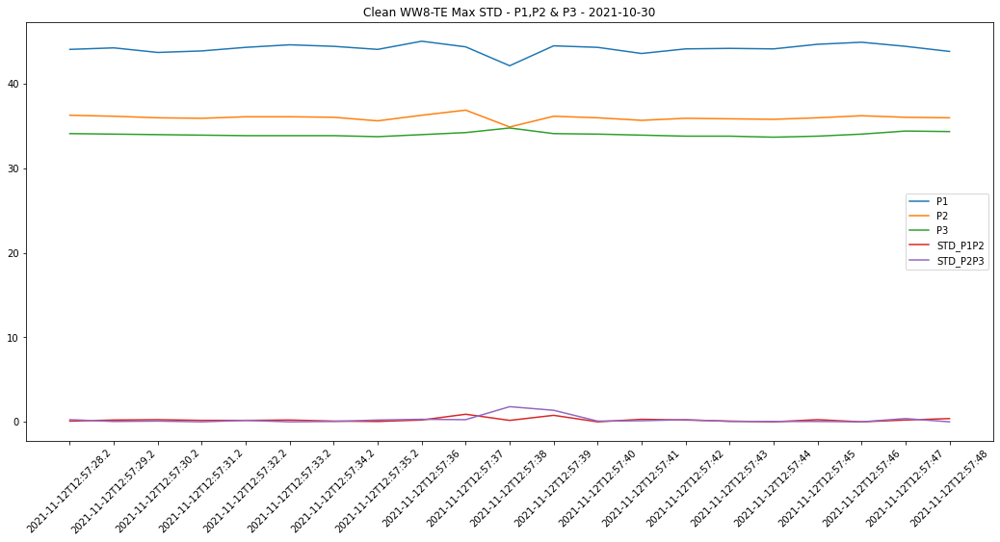

None

In [0]:
### CLEAN ####

plt.figure(figsize=(18,8))

#length = range(1, len(final_df_05_30['std_P1P2'])+1)
plt.plot(df_std_max1_WW8['dt'], df_std_max1_WW8['Pressure1_PSI'], label='P1')
plt.plot(df_std_max1_WW8['dt'], df_std_max1_WW8['Pressure2_PSI'], label='P2')
plt.plot(df_std_max1_WW8['dt'], df_std_max1_WW8['Pressure3_PSI'], label='P3')
plt.plot(df_std_max1_WW8['dt'], df_std_max1_WW8['std_P1P2'], label='STD_P1P2')
plt.plot(df_std_max1_WW8['dt'], df_std_max1_WW8['std_P2P3'], label='STD_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean WW8-TE Max STD - P1,P2 & P3 - 2021-11-12")
print(plt.legend())
print(plt.show())

Legend

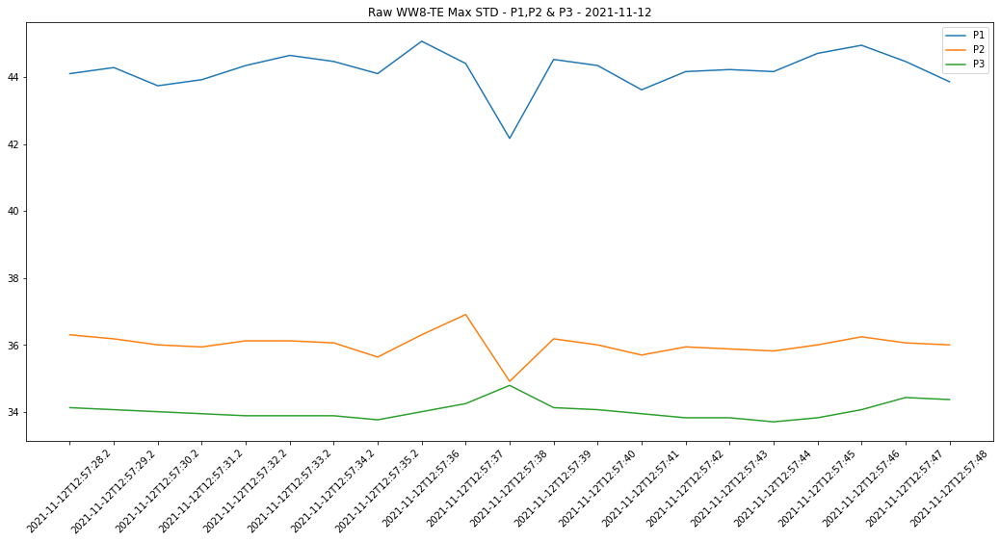

None

In [0]:
### RAW ####

#plt.figure(figsize=(18,8))

plt.figure(figsize=(18,8))

#length = range(1, len(final_df_05_30['std_P1P2'])+1)
plt.plot(raw_df_std_max1_WW8['dt'], raw_df_std_max1_WW8['Pressure1_PSI'], label='P1')
plt.plot(raw_df_std_max1_WW8['dt'], raw_df_std_max1_WW8['Pressure2_PSI'], label='P2')
plt.plot(raw_df_std_max1_WW8['dt'], raw_df_std_max1_WW8['Pressure3_PSI'], label='P3')
#plt.plot(raw_df_std_max1_WW8['dt'], raw_df_std_max1_WW8['std_P1P2'], label='STD_P1P2')
#plt.plot(raw_df_std_max1_WW8['dt'], raw_df_std_max1_WW8['std_P2P3'], label='STD_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Raw WW8-TE Max STD - P1,P2 & P3 - 2021-11-12")
print(plt.legend())
print(plt.show())

In [0]:
final_df_WW8.sort_values('Diff_Std_P1P2_P2P3',ascending=False)

Out[98]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
18110,WW8,2022-08-22T18:15:51.6,47.186813,39.390110,37.516484,7.796703,1.873626,False,False,8.098901,1.873626,1.410328,0.042737,1.36759
43824,WW8,2022-08-22T18:18:52.6,47.912088,40.357143,37.818681,7.554945,2.538462,False,False,8.401099,2.357143,1.453066,0.128212,1.32485
59767,WW8,2022-08-22T18:17:12.3,46.642857,36.730769,34.373626,9.912088,2.357143,False,False,8.219780,2.417582,1.367591,0.128212,1.23938
14776,WW8,2022-08-22T17:19:48.2,46.340659,38.181319,37.153846,8.159341,1.027473,False,False,8.038462,1.027473,1.196642,0.042737,1.15391
8822,WW8,2022-08-22T18:06:10.6,46.884615,37.335165,35.098901,9.549451,2.236264,False,False,7.857143,2.236264,1.196642,0.085474,1.11117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6777,WW8,2022-08-22T14:40:00.2,46.642857,38.060440,35.703297,8.582418,2.357143,False,False,6.950549,0.423077,2.606971,5.812262,-3.20529
74540,WW8,2022-08-22T15:16:44.3,57.038462,48.818681,45.736264,8.219780,3.082418,False,False,6.225275,-3.928571,1.410328,5.085730,-3.67540
85801,WW8,2022-08-22T16:09:07.3,52.263736,43.802198,42.653846,8.461538,1.148352,False,False,5.439560,-7.917582,2.136861,6.410583,-4.27372
31113,WW8,2022-08-22T15:15:45.6,55.769231,47.065934,44.769231,8.703297,2.296703,False,False,8.280220,1.631868,2.393284,6.837956,-4.44467


### Max Std() in P1P2 case for WW8

In [0]:
# Create dfs based on max diff in std column in descending order

df_std_max_WW8_P1P2 = final_df_WW8[(final_df_WW8.dt >= '2022-08-22T18:15:41.6') & (final_df_WW8.dt <= '2022-08-22T18:15:59.6')]

In [0]:
df_std_max_WW8_P1P2

Out[100]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
55466,WW8,2022-08-22T18:15:41.6,46.461538,37.939560,35.461538,8.521978,2.478022,False,False,8.582418,1.994505,0.470109,0.341898,0.12821
79695,WW8,2022-08-22T18:15:42.6,46.401099,37.576923,35.340659,8.824176,2.236264,False,False,8.824176,2.236264,0.213686,0.170949,0.04274
18124,WW8,2022-08-22T18:15:43.6,47.307692,38.060440,35.582418,9.247253,2.478022,False,False,8.824176,2.478022,0.299161,0.170949,0.12821
18125,WW8,2022-08-22T18:15:44.6,47.065934,38.483516,36.065934,8.582418,2.417582,False,False,8.824176,2.417582,0.470109,0.042737,0.42737
38810,WW8,2022-08-22T18:15:45.6,46.763736,38.423077,35.884615,8.340659,2.538462,False,False,8.582418,2.478022,0.170949,0.085474,0.08547
68219,WW8,2022-08-22T18:15:46.6,45.554945,37.516484,35.401099,8.038462,2.115385,False,False,8.340659,2.417582,0.213686,0.299161,-0.08547
68245,WW8,2022-08-22T18:15:47.6,46.401099,37.335165,34.917582,9.065934,2.417582,False,False,8.340659,2.417582,0.726533,0.213686,0.51285
68239,WW8,2022-08-22T18:15:48.6,46.642857,37.818681,35.401099,8.824176,2.417582,False,False,8.824176,2.417582,0.170949,0.000000,0.17095
14824,WW8,2022-08-22T18:15:49.6,45.494505,37.395604,35.219780,8.098901,2.175824,False,False,8.824176,2.417582,0.512847,0.170949,0.34190
3107,WW8,2022-08-22T18:15:50.6,47.972527,38.181319,36.368132,9.791209,1.813187,False,False,8.824176,2.175824,1.196642,0.256423,0.94022


In [0]:
# #IMP - We do see Backpressure just before we see max std in P2P3 sensor

# raw_maxStd_WW8 = df_WW8_pd[(df_WW8_pd.dt >= '2022-08-22T16:08:55.3') & (df_WW8_pd.dt <= '2022-08-22T16:09:13.3')]

In [0]:
#raw_maxStd_WW8

In [0]:
## Continue from here

In [0]:
from pyspark.sql.functions import to_timestamp,date_format
from pyspark.sql.functions import col

from pyspark.sql.functions import month,year

 
def getCPFluctuation():
  query = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where Date between '2021-08-01' and '2022-08-31'"  # yearly data
  
  query_df = spark.sql(query)
  spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")
  query_df = query_df.withColumn('month',month(query_df.Date)).withColumn('year',year(query_df.Date))
  query_df = query_df.withColumn("Date",to_timestamp(col("Date"))).withColumn("W_O_M", date_format(col("Date"), "W"))
    
  df_pd = query_df.toPandas()
  
  df = df_pd.groupby(['W_O_M','month','year','Device'],as_index=False).agg({'CP_P1P2D':'mean','CP_P2P3D':'mean'})
  
  return df

# def getCPFluctuation():
#   query = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where Date between '2021-08-01' and '2022-08-31'"  # yearly data
  
#   query_df = spark.sql(query)
#   spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")
#   #query_df = query_df.withColumn('month',month(query_df.Date)).withColumn('year',year(query_df.Date))
#   #query_df = query_df.withColumn("Date",to_timestamp(col("Date"))).withColumn("W_O_M", date_format(col("Date"), "W"))
    
#   df_pd = query_df.toPandas()
  
#   df = df_pd.groupby(['Device'],as_index=False).agg({'CP_P1P2D':'mean','CP_P2P3D':'mean'})
  
#   return df

In [0]:
data = getCPFluctuation()

In [0]:
data.head()

Out[19]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
0,1,1,2022,WW-005-TE,10.7,39.5
1,1,1,2022,WW-006-GF,8.1,2.2
2,1,1,2022,WW-021-TE,8.3,2.4
3,1,1,2022,WW-023-TE,8.9,2.1
4,1,1,2022,WW-024-TE,7.7,0.5


In [0]:
n_steps = 2
def my_fun(x):
    return x.iloc[-1] - x.iloc[0]

data['CP_P1P2D_RDiff'] = data['CP_P1P2D'].rolling(window=n_steps).apply(my_fun)
data['CP_P2P3D_RDiff'] = data['CP_P2P3D'].rolling(window=n_steps).apply(my_fun)

In [0]:
# def cal_roll_diff():  
#   for dev in data.Device.unique():
#     df = data[data['Device']==dev].sort_values(['W_O_M','month','year','Device'])
#     df['CP_P1P2D_RDiff'] = df['CP_P1P2D'].rolling(window=n_steps).apply(my_fun)
#     df['CP_P2P3D_RDiff'] = df['CP_P2P3D'].rolling(window=n_steps).apply(my_fun)
#   return df
  

In [0]:
cal_roll_diff()

Out[8]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,CP_P1P2D_RDiff,CP_P2P3D_RDiff
788,3,10,2021,WW-066-TE,2.7,1.0,NaN,NaN


In [0]:
#data.groupby(['Device','CP_P1P2D_RDiff','CP_P2P3D_RDiff'],as_index=False).agg({'CP_P1P2D_RDiff':'sum','CP_P2P3D_RDiff':'sum'})

## Device # WW-041-TE

In [0]:
dev_41 = data[data['Device']=='WW-041-TE'].sort_values(['Device','year','month','W_O_M'])

In [0]:
dev_41

Out[21]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
161,1,8,2021,WW-041-TE,8.614286,1.685714
444,2,8,2021,WW-041-TE,8.628571,1.671429
723,3,8,2021,WW-041-TE,8.514286,1.657143
1001,4,8,2021,WW-041-TE,8.580000,1.640000
1276,5,8,2021,WW-041-TE,8.550000,1.700000
203,1,9,2021,WW-041-TE,8.625000,1.650000
485,2,9,2021,WW-041-TE,8.500000,1.666667
763,3,9,2021,WW-041-TE,8.560000,1.660000
1039,4,9,2021,WW-041-TE,8.300000,1.528571
1314,5,9,2021,WW-041-TE,8.400000,1.600000


In [0]:
n_steps = 2
def my_fun(x):
    return x.iloc[-1] - x.iloc[0]

dev_41['CP_P1P2D_RD'] = dev_41['CP_P1P2D'].rolling(window=n_steps).apply(my_fun)
dev_41['CP_P2P3D_RD'] = dev_41['CP_P2P3D'].rolling(window=n_steps).apply(my_fun)

In [0]:
dev_41.round(5)

Out[22]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
161,1,8,2021,WW-041-TE,8.61429,1.68571
444,2,8,2021,WW-041-TE,8.62857,1.67143
723,3,8,2021,WW-041-TE,8.51429,1.65714
1001,4,8,2021,WW-041-TE,8.58000,1.64000
1276,5,8,2021,WW-041-TE,8.55000,1.70000
203,1,9,2021,WW-041-TE,8.62500,1.65000
485,2,9,2021,WW-041-TE,8.50000,1.66667
763,3,9,2021,WW-041-TE,8.56000,1.66000
1039,4,9,2021,WW-041-TE,8.30000,1.52857
1314,5,9,2021,WW-041-TE,8.40000,1.60000


In [0]:
import plotly.express as px

fig = px.box(dev_41['CP_P1P2D'])
fig.show()

In [0]:
fig = px.box(dev_41['CP_P2P3D'])
fig.show()

In [0]:
dev_41['std_CP_P1P2'] = dev_41['CP_P1P2D'].rolling(2).std()
dev_41['std_CP_P2P3'] = dev_41['CP_P2P3D'].rolling(2).std()

dev_41['Diff_Std_P1P2_P2P3'] = dev_41['std_CP_P1P2'] - dev_41['std_CP_P2P3']
dev_41['Diff_Std_P1P2_P2P3'] = dev_41['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
dev_41.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[108]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
245,1,11,2021,WW-041-TE,7.950000,1.366667,0.035355,0.094281,-0.05893
1436,6,10,2021,WW-041-TE,8.000000,1.500000,0.030305,0.080812,-0.05051
49,1,3,2022,WW-041-TE,8.120000,1.520000,0.014142,0.049497,-0.03536
1140,5,2,2022,WW-041-TE,8.100000,1.450000,0.030305,0.065660,-0.03536
1355,5,11,2021,WW-041-TE,8.033333,1.500000,0.016836,0.050508,-0.03367


In [0]:
dev_41.head(8)

Out[116]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,CP_P1P2D_RD,CP_P2P3D_RD,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
161,1,8,2021,WW-041-TE,8.614286,1.685714,NaN,NaN,NaN,NaN,NaN
444,2,8,2021,WW-041-TE,8.628571,1.671429,0.014286,-0.014286,0.010102,0.010102,0.00000
723,3,8,2021,WW-041-TE,8.514286,1.657143,-0.114286,-0.014286,0.080812,0.010102,0.07071
1001,4,8,2021,WW-041-TE,8.580000,1.640000,0.065714,-0.017143,0.046467,0.012122,0.03435
1276,5,8,2021,WW-041-TE,8.550000,1.700000,-0.030000,0.060000,0.021213,0.042426,-0.02121
203,1,9,2021,WW-041-TE,8.625000,1.650000,0.075000,-0.050000,0.053033,0.035355,0.01768
485,2,9,2021,WW-041-TE,8.500000,1.666667,-0.125000,0.016667,0.088388,0.011785,0.07660
763,3,9,2021,WW-041-TE,8.560000,1.660000,0.060000,-0.006667,0.042426,0.004714,0.03771


In [0]:
     dev_41['CP_P1P2D_RD'].sum(),dev_41['CP_P2P3D_RD'].sum()

Out[53]: (-0.039285714285712814, -0.06071428571428528)

In [0]:
 dev_41['std_CP_P1P2'].sum(),dev_41['std_CP_P2P3'].sum(),dev_41['Diff_Std_P1P2_P2P3'].sum(),dev_41['std_CP_P1P2'].mean(),dev_41['std_CP_P2P3'].mean()

Out[121]: (4.7818937871536376,
 2.226881284465176,
 2.5549900000000005,
 0.0713715490619946,
 0.033237034096495165)

In [0]:
print("Coef of Variability for P1P2 :", dev_41['std_CP_P1P2'].sum()/dev_41['CP_P1P2D'].mean()),
print("Coef of Variability for P2P3 :", dev_41['std_CP_P2P3'].sum()/dev_41['CP_P2P3D'].mean())

Coef of Variability for P1P2 : 0.5745913644031154
Coef of Variability for P2P3 : 1.4579202423533462

In [0]:
print("Coef of Variability for P1P2 :", dev_41['CP_P1P2D'].std()/dev_41['CP_P1P2D'].mean()),
print("Coef of Variability for P2P3 :", dev_41['CP_P2P3D'].std()/dev_41['CP_P2P3D'].mean())

Coef of Variability for P1P2 : 0.032268777076590816
Coef of Variability for P2P3 : 0.07143453199710484

In [0]:
dev_41.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[109]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
224,1,10,2021,WW-041-TE,7.900000,1.450000,0.353553,0.106066,0.24749
1211,5,5,2022,WW-041-TE,8.200000,1.533333,0.191929,0.037039,0.15489
636,3,4,2022,WW-041-TE,8.485714,1.600000,0.252538,0.101015,0.15152
745,3,8,2022,WW-041-TE,8.600000,1.600000,0.141421,0.010102,0.13132
119,1,6,2022,WW-041-TE,8.400000,1.550000,0.141421,0.011785,0.12964


In [0]:
query_val_WW41 = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device in ('WW-041-TE') and Date between '2021-10-01' and '2021-10-31'";
query_val_df_WW41 = spark.sql(query_val_WW41);
    
df_val_pd_WW41 = query_val_df_WW41.toPandas().sort_values('Date')

In [0]:
df_val_pd_WW41

Out[111]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-041-TE,2021-10-01,7.9,1.4
1,WW-041-TE,2021-10-02,7.9,1.5
2,WW-041-TE,2021-10-03,7.9,1.5
3,WW-041-TE,2021-10-04,8.1,1.5
4,WW-041-TE,2021-10-05,8.4,1.6
5,WW-041-TE,2021-10-06,8.5,1.6
6,WW-041-TE,2021-10-07,8.3,1.6
7,WW-041-TE,2021-10-08,7.9,1.5
8,WW-041-TE,2021-10-09,7.9,1.4
9,WW-041-TE,2021-10-10,8.3,1.6


In [0]:
%sql

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id = 'WW-041-TE' and Date between '2021-10-08' and '2021-10-11'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW-041-TE,2021-10-09,0.3,20,22,510,8.229734970911442,1.5382460676578318,8.340659340659343,1.6318681318681314,8.280219780219781,1.5714285714285694
WW-041-TE,2021-10-09,0.3,30,1,38,7.564488143435516,1.2803643724696339,7.615384615384627,1.3901098901098834,7.585164835164832,1.2994505494505475
WW-041-TE,2021-10-11,0.3,20,55,1332,7.918852918852898,1.3803996303996238,7.736263736263737,1.2692307692307736,7.857142857142847,1.3296703296703356
WW-041-TE,2021-10-11,0.3,30,7,236,7.918094617247162,1.419049171167815,7.736263736263737,1.2692307692307736,7.796703296703285,1.3901098901098834
WW-041-TE,2021-10-10,0.3,20,17,373,8.310034469551896,1.583905370768642,8.582417582417577,1.6318681318681314,8.340659340659329,1.6318681318681314
WW-041-TE,2021-10-08,0.3,20,27,655,8.175765455918127,1.5386712524117099,8.40109890109889,1.6318681318681314,8.280219780219781,1.5714285714285694
WW-041-TE,2021-10-08,0.3,30,3,103,7.7122052704577015,1.4100608129734347,7.494505494505503,1.5109890109890074,7.554945054945051,1.3901098901098976


In [0]:
# '2021-10-09'

query_041 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-10-09%'  and ConnectionDeviceID = 'WW-041-TE' "

df_041_9th = spark.sql(query_041)

df_pd_041 = df_041_9th.toPandas().sort_values('dt')

In [0]:
df_pd_041

Out[36]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
72032,WW-041-TE,2021-10-09T00:00:00.3,82.846154,74.565934,72.994505,8.280220,1.571429,False,False
40287,WW-041-TE,2021-10-09T00:00:01.3,82.967033,74.747253,73.175824,8.219780,1.571429,False,False
35342,WW-041-TE,2021-10-09T00:00:02.3,83.208791,75.049451,73.478022,8.159341,1.571429,False,False
80715,WW-041-TE,2021-10-09T00:00:03.3,83.450549,75.412088,73.840659,8.038462,1.571429,False,False
8528,WW-041-TE,2021-10-09T00:00:04.3,83.873626,75.412088,73.719780,8.461538,1.692308,False,False
...,...,...,...,...,...,...,...,...,...
37854,WW-041-TE,2021-10-09T23:59:55.5,79.945055,71.060440,69.368132,8.884615,1.692308,False,False
79735,WW-041-TE,2021-10-09T23:59:56.5,80.065934,71.362637,69.670330,8.703297,1.692308,False,False
38765,WW-041-TE,2021-10-09T23:59:57.5,82.967033,74.082418,72.269231,8.884615,1.813187,False,False
649,WW-041-TE,2021-10-09T23:59:58.5,81.637363,72.934066,71.120879,8.703297,1.813187,False,False


In [0]:
df_pd_041['roll_median_P1P2'] = df_pd_041['P1P2Delta'].rolling(3).median()
df_pd_041['roll_median_P2P3'] = df_pd_041['P2P3Delta'].rolling(3).median()


df_pd_041['roll_std_P1P2'] = df_pd_041['P1P2Delta'].rolling(2).std()
df_pd_041['roll_std_P2P3'] = df_pd_041['P2P3Delta'].rolling(2).std()

df_pd_041['Diff_Std_P1P2_P2P3'] = df_pd_041['roll_std_P1P2'] - df_pd_041['roll_std_P2P3']
df_pd_041['Diff_Std_P1P2_P2P3'] = df_pd_041['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
df_pd_041.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[38]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
31548,WW-041-TE,2021-10-09T02:29:29.8,69.912088,65.500000,71.423077,4.412088,-5.923077,True,False,6.043956,-1.148352,1.153905,3.376241,-2.22234
5489,WW-041-TE,2021-10-09T19:27:18.6,88.043956,80.549451,79.401099,7.494505,1.148352,False,False,5.983516,-2.236264,1.282117,3.376241,-2.09412
26370,WW-041-TE,2021-10-09T02:29:31.8,83.450549,75.109890,73.478022,8.340659,1.631868,False,False,5.016484,-4.593407,2.350547,4.401934,-2.05139
25724,WW-041-TE,2021-10-09T11:14:21,81.214286,75.774725,79.219780,5.439560,-3.445055,True,False,7.434066,1.208791,1.495803,3.376241,-1.88044
63574,WW-041-TE,2021-10-09T14:58:29,77.769231,72.148352,74.868132,5.620879,-2.719780,True,False,7.010989,1.208791,0.982956,2.777919,-1.79496


In [0]:
#original = df_pd_041

final_df_041 = df_pd_041.drop(df_pd_041.loc[(df_pd_041.P2P3Delta > 6) | (df_pd_041.P2P3Delta < 0 ) | (df_pd_041.P1P2Delta < 5 ) |(df_pd_041.P1P2Delta > 15 )].index)

In [0]:
final_df_041.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[121]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
5489,WW-041-TE,2021-10-09T19:27:18.6,88.043956,80.549451,79.401099,7.494505,1.148352,False,False,5.983516,-2.236264,1.282117,3.376241,-2.09412
26370,WW-041-TE,2021-10-09T02:29:31.8,83.450549,75.109890,73.478022,8.340659,1.631868,False,False,5.016484,-4.593407,2.350547,4.401934,-2.05139
46556,WW-041-TE,2021-10-09T10:04:01.4,84.478022,76.862637,76.197802,7.615385,0.664835,False,False,6.164835,-1.692308,1.453066,3.077080,-1.62401
74267,WW-041-TE,2021-10-09T10:03:46.6,85.928571,77.829670,76.379121,8.098901,1.450549,False,False,6.104396,-1.873626,1.880438,3.461715,-1.58128
20944,WW-041-TE,2021-10-09T04:41:30.4,79.642857,71.906593,70.576923,7.736264,1.329670,False,False,5.681319,-2.357143,1.495803,2.735182,-1.23938


In [0]:
final_df_041.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[122]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
41537,WW-041-TE,2021-10-09T21:15:41.9,81.758242,73.417582,72.329670,8.340659,1.087912,False,False,7.554945,1.087912,0.940219,0.000000,0.94022
30146,WW-041-TE,2021-10-09T10:09:09.2,50.329670,42.835165,41.203297,7.494505,1.631868,False,False,8.642857,1.692308,0.854744,0.042737,0.81201
58857,WW-041-TE,2021-10-09T11:24:01,80.730769,72.450549,71.362637,8.280220,1.087912,False,False,7.434066,1.087912,0.854744,0.128212,0.72653
80056,WW-041-TE,2021-10-09T16:54:24.1,83.450549,74.445055,73.054945,9.005495,1.390110,False,False,8.642857,1.450549,0.769270,0.042737,0.72653
48641,WW-041-TE,2021-10-09T14:32:42,83.208791,75.774725,74.565934,7.434066,1.208791,False,False,7.978022,1.269231,0.769270,0.085474,0.68380


### Max deviation scenario

In [0]:
# Create dfs based on max diff in std column in descending order

df_41_std_max1 = final_df_041[(final_df_041.dt >= '2021-10-09T19:27:00.6') & (final_df_041.dt <= '2021-10-09T19:27:28.6')]

In [0]:
# RAW - IMP - We do see Backpressure just before we see max std in P2P3 sensor

raw_41_std_max = df_pd_041[(df_pd_041.dt >= '2021-10-09T19:27:08.6') & (df_pd_041.dt <= '2021-10-09T19:27:28.6')]

In [0]:
df_41_std_max1

Out[130]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
69196,WW-041-TE,2021-10-09T19:27:03.6,89.373626,81.939560,80.791209,7.434066,1.148352,False,False,6.406593,-1.329670,0.726533,1.752226,-1.02569
23921,WW-041-TE,2021-10-09T19:27:04.6,88.346154,80.851648,80.126374,7.494505,0.725275,False,False,7.434066,0.725275,0.042737,0.299161,-0.25642
2515,WW-041-TE,2021-10-09T19:27:05.6,87.500000,80.368132,79.824176,7.131868,0.543956,False,False,7.434066,0.725275,0.256423,0.128212,0.12821
5489,WW-041-TE,2021-10-09T19:27:18.6,88.043956,80.549451,79.401099,7.494505,1.148352,False,False,5.983516,-2.236264,1.282117,3.376241,-2.09412
80073,WW-041-TE,2021-10-09T19:27:21.6,85.384615,78.373626,78.010989,7.010989,0.362637,False,False,7.010989,-0.060440,0.042737,0.299161,-0.25642
3198,WW-041-TE,2021-10-09T19:27:22.5,86.109890,78.857143,78.131868,7.252747,0.725275,False,False,7.071429,0.362637,0.170949,0.256423,-0.08547
58585,WW-041-TE,2021-10-09T19:27:23.5,85.142857,77.890110,77.406593,7.252747,0.483516,False,False,7.252747,0.483516,0.000000,0.170949,-0.17095
15002,WW-041-TE,2021-10-09T19:27:24.5,85.445055,77.890110,77.467033,7.554945,0.423077,False,False,7.252747,0.483516,0.213686,0.042737,0.17095
11782,WW-041-TE,2021-10-09T19:27:25.5,85.626374,78.192308,77.406593,7.434066,0.785714,False,False,7.434066,0.483516,0.085474,0.256423,-0.17095
72102,WW-041-TE,2021-10-09T19:27:26.5,85.747253,78.192308,77.285714,7.554945,0.906593,False,False,7.554945,0.785714,0.085474,0.085474,0.00000


Legend

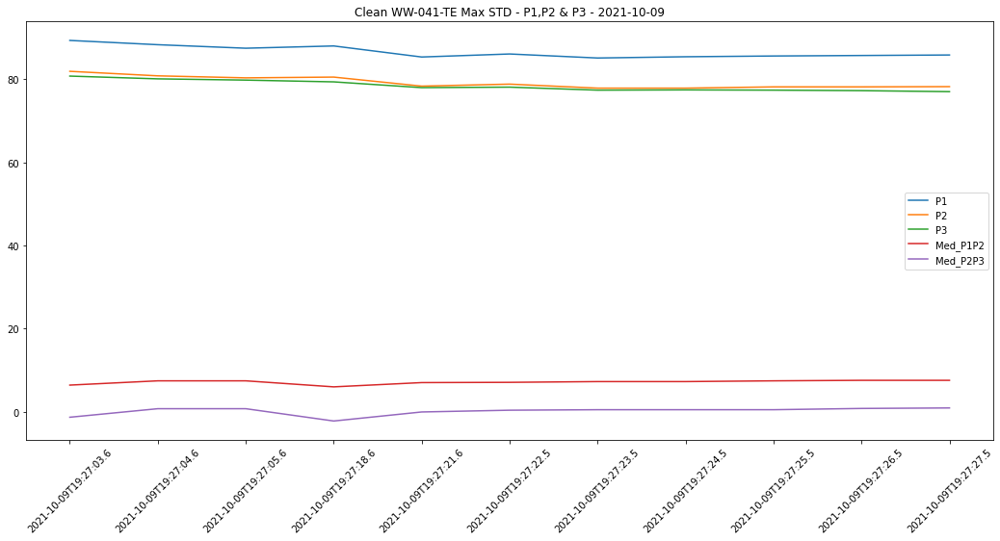

None

In [0]:
### CLEAN ####

plt.figure(figsize=(18,8))

plt.plot(df_41_std_max1['dt'], df_41_std_max1['Pressure1_PSI'], label='P1')
plt.plot(df_41_std_max1['dt'], df_41_std_max1['Pressure2_PSI'], label='P2')
plt.plot(df_41_std_max1['dt'], df_41_std_max1['Pressure3_PSI'], label='P3')
#plt.plot(df_41_std_max1['dt'], df_41_std_max1['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(df_41_std_max1['dt'], df_41_std_max1['roll_std_P2P3'], label='STD_P2P3')

plt.plot(df_41_std_max1['dt'], df_41_std_max1['roll_median_P1P2'], label='Med_P1P2')
plt.plot(df_41_std_max1['dt'], df_41_std_max1['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean WW-041-TE Max STD - P1,P2 & P3 - 2021-10-09")
print(plt.legend())
print(plt.show())

In [0]:
raw_41_std_max

Out[128]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
37750,WW-041-TE,2021-10-09T19:27:08.6,80.972527,74.868132,77.346154,6.104396,-2.478022,True,False,6.104396,-2.478022,0.213686,0.470109,-0.25642
80531,WW-041-TE,2021-10-09T19:27:09.6,77.769231,72.329670,76.076923,5.439560,-3.747253,True,False,6.104396,-2.478022,0.470109,0.897482,-0.42737
21945,WW-041-TE,2021-10-09T19:27:10.6,77.829670,72.269231,76.016484,5.560440,-3.747253,True,False,5.560440,-3.747253,0.085474,0.000000,0.08547
19635,WW-041-TE,2021-10-09T19:27:11.6,77.164835,71.846154,75.895604,5.318681,-4.049451,True,False,5.439560,-3.747253,0.170949,0.213686,-0.04274
16041,WW-041-TE,2021-10-09T19:27:12.6,77.406593,71.846154,75.532967,5.560440,-3.686813,True,False,5.560440,-3.747253,0.170949,0.256423,-0.08547
2038,WW-041-TE,2021-10-09T19:27:13.6,82.302198,75.714286,76.862637,6.587912,-1.148352,True,False,5.560440,-3.686813,0.726533,1.794963,-1.06843
40465,WW-041-TE,2021-10-09T19:27:14.6,81.153846,74.747253,76.500000,6.406593,-1.752747,True,False,6.406593,-1.752747,0.128212,0.427372,-0.29916
81745,WW-041-TE,2021-10-09T19:27:15.6,79.824176,73.780220,75.956044,6.043956,-2.175824,True,False,6.406593,-1.752747,0.256423,0.299161,-0.04274
69052,WW-041-TE,2021-10-09T19:27:16.6,79.461538,73.478022,75.714286,5.983516,-2.236264,True,False,6.043956,-2.175824,0.042737,0.042737,0.00000
58242,WW-041-TE,2021-10-09T19:27:17.6,76.802198,71.120879,74.747253,5.681319,-3.626374,True,False,5.983516,-2.236264,0.213686,0.982956,-0.76927


Legend

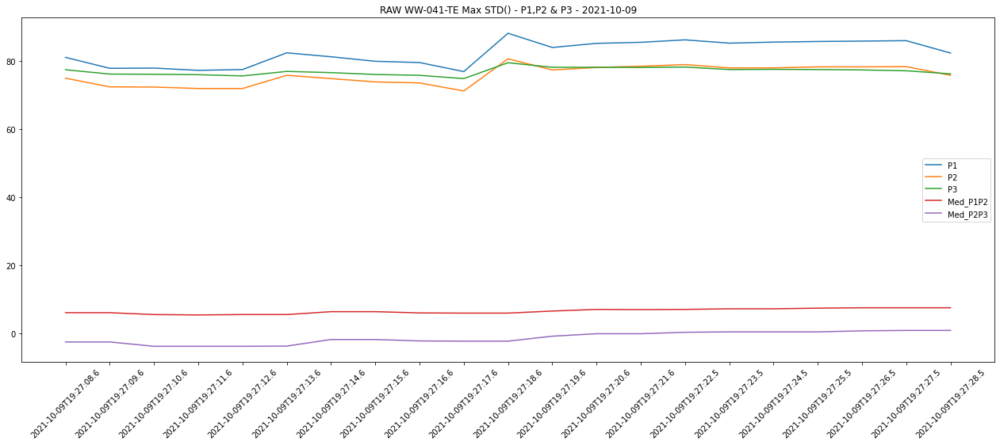

None

In [0]:
### RAW ####

plt.figure(figsize=(22,8))

plt.plot(raw_41_std_max['dt'], raw_41_std_max['Pressure1_PSI'], label='P1')
plt.plot(raw_41_std_max['dt'], raw_41_std_max['Pressure2_PSI'], label='P2')
plt.plot(raw_41_std_max['dt'], raw_41_std_max['Pressure3_PSI'], label='P3')
#plt.plot(raw_41_std_max['dt'], raw_41_std_max['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(raw_41_std_max['dt'], raw_41_std_max['roll_std_P2P3'], label='STD_P2P3')

plt.plot(raw_41_std_max['dt'], raw_41_std_max['roll_median_P1P2'], label='Med_P1P2')
plt.plot(raw_41_std_max['dt'], raw_41_std_max['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("RAW WW-041-TE Max STD() - P1,P2 & P3 - 2021-10-09")
print(plt.legend())
print(plt.show())

## Device # WW-033-TE

In [0]:
dev_33 = data[data['Device']=='WW-033-TE'].sort_values(['Device','year','month','W_O_M'])

In [0]:
dev_33

Out[137]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
158,1,8,2021,WW-033-TE,8.500000,3.000000
441,2,8,2021,WW-033-TE,8.500000,3.000000
720,3,8,2021,WW-033-TE,8.500000,3.000000
1311,5,9,2021,WW-033-TE,8.700000,2.900000
221,1,10,2021,WW-033-TE,8.700000,2.900000
503,2,10,2021,WW-033-TE,8.728571,2.928571
781,3,10,2021,WW-033-TE,8.728571,2.957143
1056,4,10,2021,WW-033-TE,8.742857,2.900000
1332,5,10,2021,WW-033-TE,8.785714,2.900000
1433,6,10,2021,WW-033-TE,8.700000,2.900000


In [0]:
dev_33['std_CP_P1P2'] = dev_33['CP_P1P2D'].rolling(2).std()
dev_33['std_CP_P2P3'] = dev_33['CP_P2P3D'].rolling(2).std()

dev_33['Diff_Std_P1P2_P2P3'] = dev_33['std_CP_P1P2'] - dev_33['std_CP_P2P3']
dev_33['Diff_Std_P1P2_P2P3'] = dev_33['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
dev_33.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[139]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
657,3,5,2022,WW-033-TE,8.900000,3.000000,0.000000,0.047140,-0.04714
1056,4,10,2021,WW-033-TE,8.742857,2.900000,0.010102,0.040406,-0.03030
781,3,10,2021,WW-033-TE,8.728571,2.957143,0.000000,0.020203,-0.02020
1187,5,4,2022,WW-033-TE,8.814286,2.971429,0.040406,0.050508,-0.01010
441,2,8,2021,WW-033-TE,8.500000,3.000000,0.000000,0.000000,0.00000


In [0]:
dev_33.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[140]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
1076,4,11,2021,WW-033-TE,8.171429,2.900000,0.444467,0.000000,0.44447
399,2,6,2022,WW-033-TE,8.671429,3.000000,0.161624,0.000000,0.16162
743,3,8,2022,WW-033-TE,8.971429,3.000000,0.222234,0.080812,0.14142
1352,5,11,2021,WW-033-TE,8.033333,2.900000,0.097648,0.000000,0.09765
1372,5,12,2021,WW-033-TE,8.716667,2.916667,0.112800,0.018519,0.09428


In [0]:
query_val_WW33 = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device in ('WW-033-TE') and Date between '2021-11-01' and '2021-11-30'";
query_val_df_WW33 = spark.sql(query_val_WW33);
    
df_val_pd_WW33 = query_val_df_WW33.toPandas().sort_values('Date')

In [0]:
df_val_pd_WW33

Out[142]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-033-TE,2021-11-01,8.7,2.9
1,WW-033-TE,2021-11-02,8.7,2.9
2,WW-033-TE,2021-11-03,8.7,2.9
3,WW-033-TE,2021-11-04,8.8,2.9
4,WW-033-TE,2021-11-05,8.8,2.9
5,WW-033-TE,2021-11-06,8.8,2.9
6,WW-033-TE,2021-11-07,8.8,2.9
7,WW-033-TE,2021-11-08,8.8,2.9
8,WW-033-TE,2021-11-09,8.8,2.9
9,WW-033-TE,2021-11-10,8.8,2.9


In [0]:
%sql

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id = 'WW-033-TE' and Date between '2021-11-21' and '2021-11-23'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW-033-TE,2021-11-22,0.3,60,419,43031,8.474819967510816,2.9272194770898947,8.763736263736263,2.901098901098905,8.7032967032967,2.901098901098905
WW-033-TE,2021-11-22,0.2,20,1295,44128,8.472754459553965,2.9286574669889753,8.763736263736263,2.901098901098905,8.7032967032967,2.901098901098905
WW-033-TE,2021-11-22,0.2,30,632,28421,8.484750093859242,2.928918834587192,8.763736263736263,2.901098901098905,8.7032967032967,2.901098901098905
WW-033-TE,2021-11-22,0.3,20,1258,72156,8.460281188682375,2.9246888914050646,8.763736263736263,2.901098901098905,8.7032967032967,2.901098901098905
WW-033-TE,2021-11-22,0.1,20,271,6968,8.539724770063508,2.935326011531454,8.763736263736263,2.901098901098905,8.703296703296715,2.901098901098905
WW-033-TE,2021-11-22,0.1,30,53,1923,8.65989210997005,2.9385946866446293,8.763736263736263,2.901098901098905,8.763736263736263,2.961538461538453
WW-033-TE,2021-11-22,0.3,30,920,63945,8.467126368040727,2.9260601701824234,8.763736263736263,2.901098901098905,8.7032967032967,2.901098901098905
WW-033-TE,2021-11-22,0.2,60,91,7024,8.510972583794736,2.9270335302511223,8.763736263736263,2.901098901098905,8.7032967032967,2.901098901098905
WW-033-TE,2021-11-22,0.1,60,2,126,8.804508983080416,2.9082940868655203,8.824175824175825,2.901098901098905,8.824175824175825,2.901098901098905
WW-033-TE,2021-11-21,0.3,20,1296,72626,8.733130341417008,2.916153449722035,8.763736263736263,2.901098901098905,8.703296703296715,2.901098901098905


In [0]:
# '2021-11-22'

query_033 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-11-22%'  and ConnectionDeviceID = 'WW-033-TE' "

df_033 = spark.sql(query_033)

df_pd_033 = df_033.toPandas().sort_values('dt')

In [0]:
df_pd_033

Out[145]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
68984,WW-033-TE,2021-11-22T00:00:00.9,72.934066,64.351648,61.390110,8.582418,2.961538,False,False
29996,WW-033-TE,2021-11-22T00:00:01.9,73.054945,64.170330,61.450549,8.884615,2.719780,False,False
80715,WW-033-TE,2021-11-22T00:00:02.9,72.994505,64.412088,61.390110,8.582418,3.021978,False,False
42276,WW-033-TE,2021-11-22T00:00:03.9,73.054945,64.351648,61.390110,8.703297,2.961538,False,False
78240,WW-033-TE,2021-11-22T00:00:04.9,73.115385,64.170330,61.390110,8.945055,2.780220,False,False
...,...,...,...,...,...,...,...,...,...
71927,WW-033-TE,2021-11-22T23:59:55.6,73.054945,65.318681,62.417582,7.736264,2.901099,False,False
214,WW-033-TE,2021-11-22T23:59:56.6,73.115385,65.379121,62.417582,7.736264,2.961538,False,False
42586,WW-033-TE,2021-11-22T23:59:57.6,73.115385,65.318681,62.357143,7.796703,2.961538,False,False
5094,WW-033-TE,2021-11-22T23:59:58.6,73.115385,65.258242,62.417582,7.857143,2.840659,False,False


In [0]:
df_pd_033['roll_median_P1P2'] = df_pd_033['P1P2Delta'].rolling(3).median()
df_pd_033['roll_median_P2P3'] = df_pd_033['P2P3Delta'].rolling(3).median()


df_pd_033['roll_std_P1P2'] = df_pd_033['P1P2Delta'].rolling(2).std()
df_pd_033['roll_std_P2P3'] = df_pd_033['P2P3Delta'].rolling(2).std()

df_pd_033['Diff_Std_P1P2_P2P3'] = df_pd_033['roll_std_P1P2'] - df_pd_033['roll_std_P2P3']
df_pd_033['Diff_Std_P1P2_P2P3'] = df_pd_033['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
#original = df_pd_033

final_df_033 = df_pd_033.drop(df_pd_033.loc[(df_pd_033.P2P3Delta > 6) | (df_pd_033.P2P3Delta < 0 ) | (df_pd_033.P1P2Delta < 5 ) |(df_pd_033.P1P2Delta > 15 )].index)

In [0]:
final_df_033.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[148]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
62777,WW-033-TE,2021-11-22T14:17:02.6,73.901099,65.439560,62.538462,8.461538,2.901099,False,False,8.461538,2.901099,1.837701,3.718138,-1.88044
10821,WW-033-TE,2021-11-22T14:16:30.8,72.692308,63.142857,60.000000,9.549451,3.142857,False,False,9.549451,3.142857,2.649708,4.188248,-1.53854
71685,WW-033-TE,2021-11-22T14:20:06.9,66.104396,55.587912,51.115385,10.516484,4.472527,False,False,10.516484,3.021978,0.085474,1.025693,-0.94022
175,WW-033-TE,2021-11-22T01:49:44.6,72.813187,64.170330,61.994505,8.642857,2.175824,False,False,8.642857,2.296703,0.042737,0.940219,-0.89748
11772,WW-033-TE,2021-11-22T01:49:43.6,72.934066,64.351648,60.846154,8.582418,3.505495,False,False,8.582418,3.082418,0.128212,0.854744,-0.72653


In [0]:
final_df_033.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[149]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
32048,WW-033-TE,2021-11-22T14:20:41.4,71.120879,66.043956,63.384615,5.076923,2.659341,False,False,9.247253,3.203297,2.948868,0.470109,2.47876
52009,WW-033-TE,2021-11-22T14:23:22.1,71.604396,65.862637,63.142857,5.741758,2.719780,False,False,9.005495,3.082418,2.350547,0.256423,2.09412
67622,WW-033-TE,2021-11-22T14:23:23.1,72.994505,64.109890,61.087912,8.884615,3.021978,False,False,8.884615,3.021978,2.222336,0.213686,2.00865
19214,WW-033-TE,2021-11-22T14:22:05.7,77.285714,71.423077,69.730769,5.862637,1.692308,False,False,9.851648,3.384615,3.162555,1.196642,1.96591
46825,WW-033-TE,2021-11-22T14:20:42.4,71.423077,63.384615,60.543956,8.038462,2.840659,False,False,8.038462,2.840659,2.094124,0.128212,1.96591


### deviation scenario

In [0]:
# Create dfs based on max diff in std column in descending order  <Mixed of P1P2 and P2P3 deviations>

df_33_dev = final_df_033[(final_df_033.dt >= '2021-11-22T14:17:00.6') & (final_df_033.dt <= '2021-11-22T14:20:45.4')]

In [0]:
# RAW - IMP - We do see Backpressure just before we see max std in P2P3 sensor

raw_33_dev = df_pd_033[(df_pd_033.dt >= '2021-11-22T14:17:00.6') & (df_pd_033.dt <= '2021-11-22T14:20:45.4')]

In [0]:
df_33_dev.shape, raw_33_dev.shape

Out[158]: ((224, 14), (225, 14))

Legend

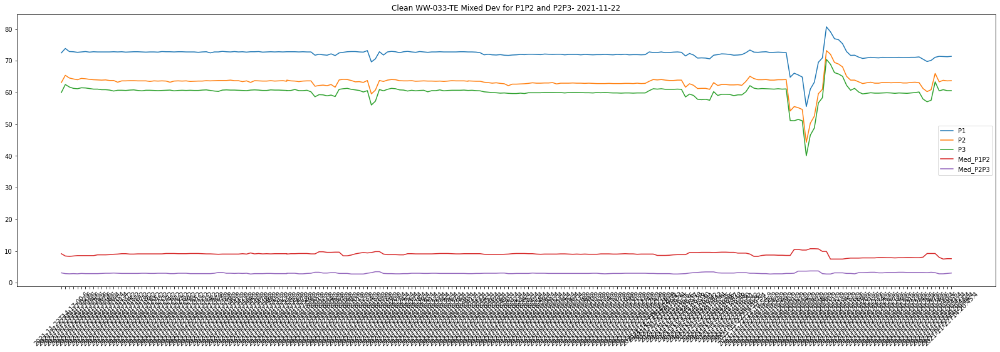

None

In [0]:
### CLEAN ####

plt.figure(figsize=(28,8))

plt.plot(df_33_dev['dt'], df_33_dev['Pressure1_PSI'], label='P1')
plt.plot(df_33_dev['dt'], df_33_dev['Pressure2_PSI'], label='P2')
plt.plot(df_33_dev['dt'], df_33_dev['Pressure3_PSI'], label='P3')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P2P3'], label='STD_P2P3')

plt.plot(df_33_dev['dt'], df_33_dev['roll_median_P1P2'], label='Med_P1P2')
plt.plot(df_33_dev['dt'], df_33_dev['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean WW-033-TE Mixed Dev for P1P2 and P2P3- 2021-11-22")
print(plt.legend())
print(plt.show())

In [0]:
raw_33_dev.head()

Out[156]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
72546,WW-033-TE,2021-11-22T14:17:00.6,72.510989,63.142857,60.000000,9.368132,3.142857,False,False,9.186813,3.142857,0.341898,0.085474,0.25642
28828,WW-033-TE,2021-11-22T14:17:01.6,70.879121,65.016484,67.373626,5.862637,-2.357143,True,False,8.884615,3.021978,2.478759,3.889087,-1.41033
62777,WW-033-TE,2021-11-22T14:17:02.6,73.901099,65.439560,62.538462,8.461538,2.901099,False,False,8.461538,2.901099,1.837701,3.718138,-1.88044
24812,WW-033-TE,2021-11-22T14:17:03.6,72.934066,64.593407,61.752747,8.340659,2.840659,False,False,8.340659,2.840659,0.085474,0.042737,0.04274
47609,WW-033-TE,2021-11-22T14:17:04.6,72.873626,64.291209,61.329670,8.582418,2.961538,False,False,8.461538,2.901099,0.170949,0.085474,0.08547


Legend

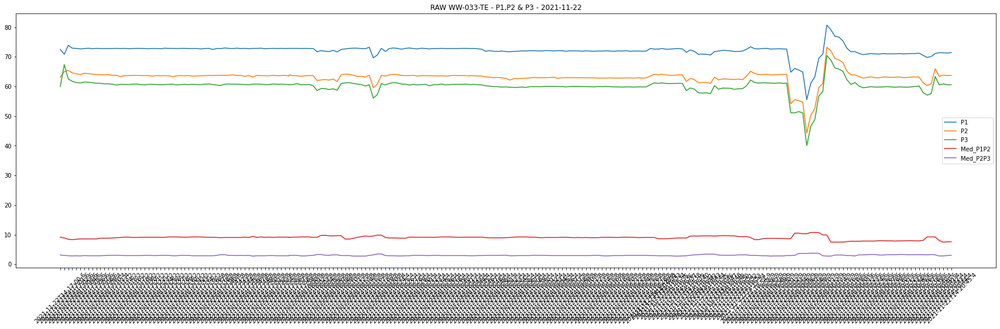

None

In [0]:
### RAW ####

plt.figure(figsize=(30,8))

plt.plot(raw_33_dev['dt'], raw_33_dev['Pressure1_PSI'], label='P1')
plt.plot(raw_33_dev['dt'], raw_33_dev['Pressure2_PSI'], label='P2')
plt.plot(raw_33_dev['dt'], raw_33_dev['Pressure3_PSI'], label='P3')
#plt.plot(raw_33_dev['dt'], raw_33_dev['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(raw_33_dev['dt'], raw_33_dev['roll_std_P2P3'], label='STD_P2P3')

plt.plot(raw_33_dev['dt'], raw_33_dev['roll_median_P1P2'], label='Med_P1P2')
plt.plot(raw_33_dev['dt'], raw_33_dev['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(raw_33_dev['dt'], raw_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("RAW WW-033-TE - P1,P2 & P3 - 2021-11-22")
print(plt.legend())
print(plt.show())

## Device # WW-035-TE  >> Data is only till Feb 2022

In [0]:
from pyspark.sql.functions import to_timestamp,date_format
from pyspark.sql.functions import col

from pyspark.sql.functions import month,year

 
def getCPFluctuation():
  query = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device = 'WW-035-TE' and date between '2021-08-01' and '2022-07-30'"  # yearly data
  
  query_df = spark.sql(query)
  spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")
  query_df = query_df.withColumn('month',month(query_df.Date)).withColumn('year',year(query_df.Date))
  query_df = query_df.withColumn("Date",to_timestamp(col("Date"))).withColumn("W_O_M", date_format(col("Date"), "W"))
    
  df_pd = query_df.toPandas().sort_values('Date')
  
  df = df_pd.groupby(['W_O_M','month','year','Device'],as_index=False).agg({'CP_P1P2D':'mean','CP_P2P3D':'mean'})
  
  return df

In [0]:
data = getCPFluctuation()

In [0]:
dev_35 = data.sort_values(['Device','year','month','W_O_M'])

In [0]:
dev_35['std_CP_P1P2'] = dev_35['CP_P1P2D'].rolling(2).std()
dev_35['std_CP_P2P3'] = dev_35['CP_P2P3D'].rolling(2).std()

dev_35['Diff_Std_P1P2_P2P3'] = dev_35['std_CP_P1P2'] - dev_35['std_CP_P2P3']
dev_35['Diff_Std_P1P2_P2P3'] = dev_35['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
dev_35

Out[8]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
2,1,8,2021,WW-035-TE,8.457143,1.071429,NaN,NaN,NaN
9,2,8,2021,WW-035-TE,7.842857,0.528571,0.434366,0.383858,0.05051
16,3,8,2021,WW-035-TE,8.060000,0.660000,0.153543,0.092934,0.06061
23,4,8,2021,WW-035-TE,7.885714,0.600000,0.123239,0.042426,0.08081
29,5,8,2021,WW-035-TE,7.966667,0.700000,0.057242,0.070711,-0.01347
3,1,9,2021,WW-035-TE,7.925000,0.675000,0.029463,0.017678,0.01179
10,2,9,2021,WW-035-TE,8.785714,1.414286,0.608617,0.522754,0.08586
17,3,9,2021,WW-035-TE,10.683333,2.900000,1.341819,1.050559,0.29126
24,4,9,2021,WW-035-TE,9.357143,1.800000,0.937758,0.777817,0.15994
30,5,9,2021,WW-035-TE,7.866667,0.533333,1.053926,0.895669,0.15826


In [0]:
dev_35.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[9]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
5,1,11,2021,WW-035-TE,10.500000,2.816667,0.565685,0.153206,0.41248
17,3,9,2021,WW-035-TE,10.683333,2.900000,1.341819,1.050559,0.29126
22,4,2,2022,WW-035-TE,10.700000,2.866667,1.424315,1.138105,0.28621
35,6,10,2021,WW-035-TE,9.700000,2.600000,0.303046,0.080812,0.22223
32,5,11,2021,WW-035-TE,8.233333,1.066667,0.744146,0.569053,0.17509


In [0]:
dev_35.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[10]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
6,1,12,2021,WW-035-TE,8.050000,0.650000,0.129636,0.294628,-0.16499
1,1,2,2022,WW-035-TE,8.100000,0.820000,0.000000,0.091924,-0.09192
8,2,2,2022,WW-035-TE,8.085714,0.685714,0.010102,0.094954,-0.08485
18,3,10,2021,WW-035-TE,9.800000,2.614286,0.787919,0.858630,-0.07071
20,3,12,2021,WW-035-TE,8.114286,0.628571,0.013469,0.074078,-0.06061


In [0]:
query_val_WW35 = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device in ('WW-035-TE') and Date between '2021-11-01' and '2021-12-15'";
query_val_df_WW35 = spark.sql(query_val_WW35);
    
df_val_pd_WW35 = query_val_df_WW35.toPandas().sort_values('Date')

In [0]:
df_val_pd_WW35

Out[14]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-035-TE,2021-11-01,10.5,2.8
1,WW-035-TE,2021-11-02,10.5,2.8
2,WW-035-TE,2021-11-03,10.5,2.8
3,WW-035-TE,2021-11-04,10.5,2.9
4,WW-035-TE,2021-11-05,10.5,2.8
5,WW-035-TE,2021-11-06,10.5,2.8
6,WW-035-TE,2021-11-07,10.5,2.8
7,WW-035-TE,2021-11-08,10.0,2.7
8,WW-035-TE,2021-11-09,10.5,2.8
9,WW-035-TE,2021-11-10,10.2,2.7


In [0]:
%sql

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id = 'WW-035-TE' and Date between '2021-11-01' and '2021-12-15'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW-035-TE,2021-11-01,0.3,20,30,698,10.291263893699382,2.7492206933467735,10.516483516483518,2.780219780219781,10.456043956043956,2.780219780219781
WW-035-TE,2021-11-01,0.2,20,1,20,10.471153846153848,2.756043956043956,10.456043956043956,2.780219780219781,10.456043956043956,2.780219780219781
WW-035-TE,2021-11-01,0.3,30,3,98,10.489347387306568,2.8326418479479716,10.516483516483518,2.840659340659343,10.516483516483518,2.840659340659343
WW-035-TE,2021-11-16,0.3,20,17,391,10.520193361625584,2.8547258368230244,10.516483516483518,2.840659340659343,10.516483516483518,2.840659340659343
WW-035-TE,2021-11-16,0.3,30,1,30,10.472161172161174,2.832600732600734,10.57692307692308,2.840659340659343,10.516483516483511,2.840659340659343
WW-035-TE,2021-11-17,0.3,20,11,248,10.490894186458704,2.8465083303792977,10.456043956043956,2.840659340659343,10.516483516483504,2.840659340659343
WW-035-TE,2021-11-26,0.2,20,5,115,7.682656473960822,0.5707596751074984,7.796703296703299,0.4835164835164818,7.675824175824175,0.5439560439560438
WW-035-TE,2021-11-26,0.3,30,3,97,7.736886824515688,0.5719950152939828,7.675824175824175,0.3021978021977958,7.736263736263737,0.4835164835164818
WW-035-TE,2021-11-26,0.2,30,1,32,7.6059409340659325,0.28897664835164427,7.554945054945051,0.2417582417582338,7.615384615384613,0.2719780219780219
WW-035-TE,2021-11-26,0.3,20,34,810,9.768898385565068,1.9483923483923435,10.939560439560438,2.719780219780219,10.758241758241766,2.659340659340657


In [0]:
# '2021-11-24'

query_035_24 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-11-24%'  and ConnectionDeviceID = 'WW-035-TE' "

df_035_24 = spark.sql(query_035_24)

df_pd_035 = df_035_24.toPandas().sort_values('dt')

In [0]:
df_pd_035

Out[17]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
53589,WW-035-TE,2021-11-24T00:00:00.7,38.543956,26.697802,23.796703,11.846154,2.901099,False,False
20592,WW-035-TE,2021-11-24T00:00:01.7,37.335165,25.912088,23.131868,11.423077,2.780220,False,False
49429,WW-035-TE,2021-11-24T00:00:02.5,35.703297,25.005495,22.467033,10.697802,2.538462,False,False
32617,WW-035-TE,2021-11-24T00:00:03.5,35.521978,24.763736,22.164835,10.758242,2.598901,False,False
20585,WW-035-TE,2021-11-24T00:00:04.5,34.978022,24.521978,21.983516,10.456044,2.538462,False,False
...,...,...,...,...,...,...,...,...,...
2054,WW-035-TE,2021-11-24T23:59:55,35.945055,24.824176,22.104396,11.120879,2.719780,False,False
80975,WW-035-TE,2021-11-24T23:59:56,35.884615,24.763736,21.983516,11.120879,2.780220,False,False
6028,WW-035-TE,2021-11-24T23:59:57,35.401099,24.280220,21.439560,11.120879,2.840659,False,False
10035,WW-035-TE,2021-11-24T23:59:58,35.219780,24.340659,21.681319,10.879121,2.659341,False,False


In [0]:
df_pd_035['roll_median_P1P2'] = df_pd_035['P1P2Delta'].rolling(3).median()
df_pd_035['roll_median_P2P3'] = df_pd_035['P2P3Delta'].rolling(3).median()


df_pd_035['roll_std_P1P2'] = df_pd_035['P1P2Delta'].rolling(2).std()
df_pd_035['roll_std_P2P3'] = df_pd_035['P2P3Delta'].rolling(2).std()

df_pd_035['Diff_Std_P1P2_P2P3'] = df_pd_035['roll_std_P1P2'] - df_pd_035['roll_std_P2P3']
df_pd_035['Diff_Std_P1P2_P2P3'] = df_pd_035['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
df_pd_035

Out[21]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
53589,WW-035-TE,2021-11-24T00:00:00.7,38.543956,26.697802,23.796703,11.846154,2.901099,False,False,NaN,NaN,NaN,NaN,NaN
20592,WW-035-TE,2021-11-24T00:00:01.7,37.335165,25.912088,23.131868,11.423077,2.780220,False,False,NaN,NaN,0.299161,0.085474,0.21369
49429,WW-035-TE,2021-11-24T00:00:02.5,35.703297,25.005495,22.467033,10.697802,2.538462,False,False,11.423077,2.780220,0.512847,0.170949,0.34190
32617,WW-035-TE,2021-11-24T00:00:03.5,35.521978,24.763736,22.164835,10.758242,2.598901,False,False,10.758242,2.598901,0.042737,0.042737,0.00000
20585,WW-035-TE,2021-11-24T00:00:04.5,34.978022,24.521978,21.983516,10.456044,2.538462,False,False,10.697802,2.538462,0.213686,0.042737,0.17095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2054,WW-035-TE,2021-11-24T23:59:55,35.945055,24.824176,22.104396,11.120879,2.719780,False,False,11.120879,2.719780,0.042737,0.000000,0.04274
80975,WW-035-TE,2021-11-24T23:59:56,35.884615,24.763736,21.983516,11.120879,2.780220,False,False,11.120879,2.719780,0.000000,0.042737,-0.04274
6028,WW-035-TE,2021-11-24T23:59:57,35.401099,24.280220,21.439560,11.120879,2.840659,False,False,11.120879,2.780220,0.000000,0.042737,-0.04274
10035,WW-035-TE,2021-11-24T23:59:58,35.219780,24.340659,21.681319,10.879121,2.659341,False,False,11.120879,2.780220,0.170949,0.128212,0.04274


In [0]:
df_pd_035.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[22]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
54156,WW-035-TE,2021-11-24T11:15:26.9,36.609890,27.423077,24.340659,9.186813,3.082418,False,False,11.362637,2.901099,2.179598,0.128212,2.05139
41061,WW-035-TE,2021-11-24T19:38:51.1,38.846154,29.840659,26.758242,9.005495,3.082418,False,False,11.846154,2.901099,2.222336,0.213686,2.00865
3776,WW-035-TE,2021-11-24T12:04:32.8,37.758242,28.329670,26.032967,9.428571,2.296703,False,False,11.664835,2.357143,2.008649,0.042737,1.96591
53104,WW-035-TE,2021-11-24T16:22:27.5,38.120879,28.752747,26.214286,9.368132,2.538462,False,False,11.302198,2.719780,2.179598,0.256423,1.92318
65170,WW-035-TE,2021-11-24T20:41:04.8,30.384615,20.532967,18.054945,9.851648,2.478022,False,False,10.576923,2.478022,1.880438,0.042737,1.83770


In [0]:
df_pd_035.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[24]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
47814,WW-035-TE,2021-11-24T06:37:07.2,35.824176,26.214286,23.675824,9.609890,2.538462,False,False,5.681319,-7.131868,2.777919,6.880693,-4.10277
78677,WW-035-TE,2021-11-24T18:16:27.8,51.840659,42.895604,40.719780,8.945055,2.175824,False,False,6.104396,-5.016484,2.008649,5.213941,-3.20529
20882,WW-035-TE,2021-11-24T16:06:41.3,52.021978,43.318681,41.505495,8.703297,1.813187,False,False,6.104396,-4.532967,1.837701,4.701095,-2.86339
68733,WW-035-TE,2021-11-24T19:22:07.4,46.945055,39.027473,37.879121,7.917582,1.148352,False,False,6.587912,-3.747253,0.940219,3.461715,-2.52150
14034,WW-035-TE,2021-11-24T14:00:04.5,35.884615,26.697802,24.340659,9.186813,2.357143,False,False,7.434066,-2.296703,1.239379,3.290766,-2.05139


Legend

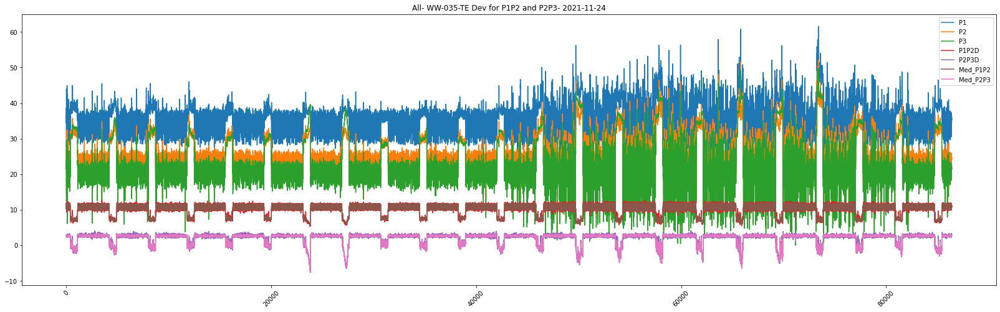

None

In [0]:
# 
plt.figure(figsize=(28,8))

length = range(1, len(df_pd_035['dt'])+1)
plt.plot(length, df_pd_035['Pressure1_PSI'], label='P1')
plt.plot(length, df_pd_035['Pressure2_PSI'], label='P2')
plt.plot(length, df_pd_035['Pressure3_PSI'], label='P3')
plt.plot(length, df_pd_035['P1P2Delta'], label='P1P2D')
plt.plot(length, df_pd_035['P2P3Delta'], label='P2P3D')

plt.plot(length, df_pd_035['roll_median_P1P2'], label='Med_P1P2')
plt.plot(length, df_pd_035['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("All- WW-035-TE Dev for P1P2 and P2P3- 2021-11-24")
print(plt.legend())
print(plt.show())

In [0]:
#original = df_pd_035

final_df_035_24 = df_pd_035.drop(df_pd_035.loc[(df_pd_035.P2P3Delta > 6) | (df_pd_035.P2P3Delta < 0 ) | (df_pd_035.P1P2Delta < 5 ) |(df_pd_035.P1P2Delta > 15 )].index)

In [0]:
final_df_035_24.shape,df_pd_035.shape

Out[46]: ((74461, 14), (86399, 14))

In [0]:
final_df_035_24.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[47]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
54156,WW-035-TE,2021-11-24T11:15:26.9,36.609890,27.423077,24.340659,9.186813,3.082418,False,False,11.362637,2.901099,2.179598,0.128212,2.05139
41061,WW-035-TE,2021-11-24T19:38:51.1,38.846154,29.840659,26.758242,9.005495,3.082418,False,False,11.846154,2.901099,2.222336,0.213686,2.00865
3776,WW-035-TE,2021-11-24T12:04:32.8,37.758242,28.329670,26.032967,9.428571,2.296703,False,False,11.664835,2.357143,2.008649,0.042737,1.96591
53104,WW-035-TE,2021-11-24T16:22:27.5,38.120879,28.752747,26.214286,9.368132,2.538462,False,False,11.302198,2.719780,2.179598,0.256423,1.92318
77978,WW-035-TE,2021-11-24T14:12:12.7,42.351648,33.164835,30.868132,9.186813,2.296703,False,False,12.027473,2.901099,2.265073,0.427372,1.83770


In [0]:
final_df_035_24.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[48]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
47814,WW-035-TE,2021-11-24T06:37:07.2,35.824176,26.214286,23.675824,9.609890,2.538462,False,False,5.681319,-7.131868,2.777919,6.880693,-4.10277
78677,WW-035-TE,2021-11-24T18:16:27.8,51.840659,42.895604,40.719780,8.945055,2.175824,False,False,6.104396,-5.016484,2.008649,5.213941,-3.20529
20882,WW-035-TE,2021-11-24T16:06:41.3,52.021978,43.318681,41.505495,8.703297,1.813187,False,False,6.104396,-4.532967,1.837701,4.701095,-2.86339
68733,WW-035-TE,2021-11-24T19:22:07.4,46.945055,39.027473,37.879121,7.917582,1.148352,False,False,6.587912,-3.747253,0.940219,3.461715,-2.52150
14034,WW-035-TE,2021-11-24T14:00:04.5,35.884615,26.697802,24.340659,9.186813,2.357143,False,False,7.434066,-2.296703,1.239379,3.290766,-2.05139


Legend

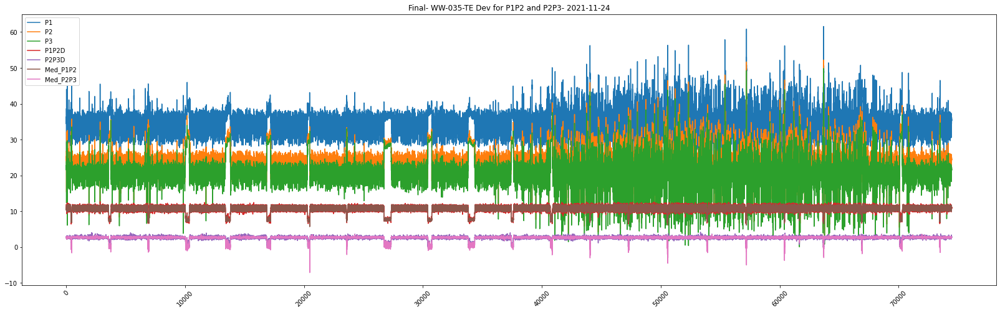

None

In [0]:
# 
plt.figure(figsize=(28,8))

length = range(1, len(final_df_035_24['dt'])+1)
plt.plot(length, final_df_035_24['Pressure1_PSI'], label='P1')
plt.plot(length, final_df_035_24['Pressure2_PSI'], label='P2')
plt.plot(length, final_df_035_24['Pressure3_PSI'], label='P3')
plt.plot(length, final_df_035_24['P1P2Delta'], label='P1P2D')
plt.plot(length, final_df_035_24['P2P3Delta'], label='P2P3D')

plt.plot(length, final_df_035_24['roll_median_P1P2'], label='Med_P1P2')
plt.plot(length, final_df_035_24['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Final- WW-035-TE Dev for P1P2 and P2P3- 2021-11-24")
print(plt.legend())
print(plt.show())

#### deviation scenario

In [0]:
# Create dfs based on max diff in std column in descending order  <Mixed of P1P2 and P2P3 deviations>

df_35_dev_24 = final_df_035_24[(final_df_035_24.dt >= '2021-11-24T06:36:55.2') & (final_df_035_24.dt <= '2021-11-24T06:37:17.2')]

In [0]:
# RAW - IMP - We do see Backpressure just before we see max std in P2P3 sensor

raw_035_24 = df_pd_035[(df_pd_035.dt >= '2021-11-24T06:36:55.2') & (df_pd_035.dt <= '2021-11-24T06:37:17.2')]

In [0]:
df_35_dev_24.shape, raw_035_24.shape

Out[41]: ((11, 14), (23, 14))

In [0]:
df_35_dev_24

Out[42]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
47814,WW-035-TE,2021-11-24T06:37:07.2,35.824176,26.214286,23.675824,9.609890,2.538462,False,False,5.681319,-7.131868,2.777919,6.880693,-4.10277
76750,WW-035-TE,2021-11-24T06:37:08.2,33.708791,23.978022,21.318681,9.730769,2.659341,False,False,9.609890,2.538462,0.085474,0.085474,-0.00000
47787,WW-035-TE,2021-11-24T06:37:09.1,35.340659,26.214286,23.796703,9.126374,2.417582,False,False,9.609890,2.538462,0.427372,0.170949,0.25642
43524,WW-035-TE,2021-11-24T06:37:10.1,36.368132,26.697802,24.098901,9.670330,2.598901,False,False,9.670330,2.598901,0.384635,0.128212,0.25642
18896,WW-035-TE,2021-11-24T06:37:11.1,37.576923,27.967033,25.186813,9.609890,2.780220,False,False,9.609890,2.598901,0.042737,0.128212,-0.08547
64541,WW-035-TE,2021-11-24T06:37:12.1,36.972527,27.543956,24.945055,9.428571,2.598901,False,False,9.609890,2.598901,0.128212,0.128212,0.00000
18910,WW-035-TE,2021-11-24T06:37:13.1,37.153846,27.483516,24.884615,9.670330,2.598901,False,False,9.609890,2.598901,0.170949,0.000000,0.17095
14829,WW-035-TE,2021-11-24T06:37:14.1,37.032967,27.362637,24.280220,9.670330,3.082418,False,False,9.670330,2.598901,0.000000,0.341898,-0.34190
60356,WW-035-TE,2021-11-24T06:37:15.1,36.730769,27.120879,24.340659,9.609890,2.780220,False,False,9.670330,2.780220,0.042737,0.213686,-0.17095
64545,WW-035-TE,2021-11-24T06:37:16.1,36.670330,27.120879,24.098901,9.549451,3.021978,False,False,9.609890,3.021978,0.042737,0.170949,-0.12821


Legend

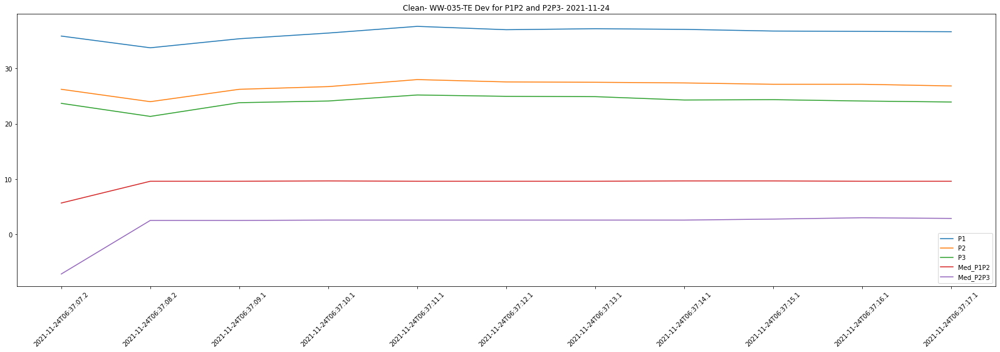

None

In [0]:
### CLEAN ####

plt.figure(figsize=(28,8))

plt.plot(df_35_dev_24['dt'], df_35_dev_24['Pressure1_PSI'], label='P1')
plt.plot(df_35_dev_24['dt'], df_35_dev_24['Pressure2_PSI'], label='P2')
plt.plot(df_35_dev_24['dt'], df_35_dev_24['Pressure3_PSI'], label='P3')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P2P3'], label='STD_P2P3')

plt.plot(df_35_dev_24['dt'], df_35_dev_24['roll_median_P1P2'], label='Med_P1P2')
plt.plot(df_35_dev_24['dt'], df_35_dev_24['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean- WW-035-TE Dev for P1P2 and P2P3- 2021-11-24")
print(plt.legend())
print(plt.show())

In [0]:
raw_035_24

Out[44]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
28748,WW-035-TE,2021-11-24T06:36:55.2,37.637363,31.956044,39.390110,5.681319,-7.434066,True,False,5.681319,-7.313187,0.000000,0.085474,-0.08547
33402,WW-035-TE,2021-11-24T06:36:56.2,37.576923,31.956044,39.390110,5.620879,-7.434066,True,False,5.681319,-7.434066,0.042737,0.000000,0.04274
37679,WW-035-TE,2021-11-24T06:36:57.2,37.456044,31.895604,39.390110,5.560440,-7.494505,True,False,5.620879,-7.434066,0.042737,0.042737,0.00000
53738,WW-035-TE,2021-11-24T06:36:58.2,37.456044,31.895604,39.390110,5.560440,-7.494505,True,False,5.560440,-7.494505,0.000000,0.000000,0.00000
53753,WW-035-TE,2021-11-24T06:36:59.2,37.456044,31.774725,39.329670,5.681319,-7.554945,True,False,5.560440,-7.494505,0.085474,0.042737,0.04274
30926,WW-035-TE,2021-11-24T06:37:00.2,37.516484,31.895604,39.329670,5.620879,-7.434066,True,False,5.620879,-7.494505,0.042737,0.085474,-0.04274
68578,WW-035-TE,2021-11-24T06:37:01.2,37.637363,31.956044,39.631868,5.681319,-7.675824,True,False,5.681319,-7.554945,0.042737,0.170949,-0.12821
43546,WW-035-TE,2021-11-24T06:37:02.2,37.758242,32.137363,39.329670,5.620879,-7.192308,True,False,5.620879,-7.434066,0.042737,0.341898,-0.29916
51849,WW-035-TE,2021-11-24T06:37:03.2,37.879121,32.137363,38.785714,5.741758,-6.648352,True,False,5.681319,-7.192308,0.085474,0.384635,-0.29916
43523,WW-035-TE,2021-11-24T06:37:04.2,37.879121,32.197802,39.329670,5.681319,-7.131868,True,False,5.681319,-7.131868,0.042737,0.341898,-0.29916


Legend

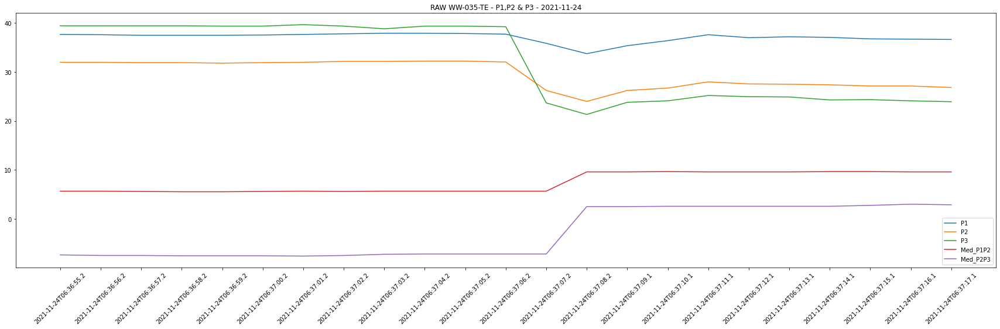

None

In [0]:
### RAW ####

plt.figure(figsize=(30,8))

plt.plot(raw_035_24['dt'], raw_035_24['Pressure1_PSI'], label='P1')
plt.plot(raw_035_24['dt'], raw_035_24['Pressure2_PSI'], label='P2')
plt.plot(raw_035_24['dt'], raw_035_24['Pressure3_PSI'], label='P3')
#plt.plot(raw_33_dev['dt'], raw_33_dev['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(raw_33_dev['dt'], raw_33_dev['roll_std_P2P3'], label='STD_P2P3')

plt.plot(raw_035_24['dt'], raw_035_24['roll_median_P1P2'], label='Med_P1P2')
plt.plot(raw_035_24['dt'], raw_035_24['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(raw_33_dev['dt'], raw_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("RAW WW-035-TE - P1,P2 & P3 - 2021-11-24")
print(plt.legend())
print(plt.show())

## Device # WW-044-TE >> Broken Sensors >> Constant BackPressure

In [0]:
from pyspark.sql.functions import to_timestamp,date_format
from pyspark.sql.functions import col

from pyspark.sql.functions import month,year

 
def getCPFluctuation():
  query = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device = 'WW-044-TE' and date between '2021-08-01' and '2022-07-30'"  # yearly data
  
  query_df = spark.sql(query)
  spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")
  query_df = query_df.withColumn('month',month(query_df.Date)).withColumn('year',year(query_df.Date))
  query_df = query_df.withColumn("Date",to_timestamp(col("Date"))).withColumn("W_O_M", date_format(col("Date"), "W"))
    
  df_pd = query_df.toPandas().sort_values('Date')
  
  df = df_pd.groupby(['W_O_M','month','year','Device'],as_index=False).agg({'CP_P1P2D':'mean','CP_P2P3D':'mean'})
  
  return df


# def getCPFluctuation():
#   query = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where Date between '2021-08-01' and '2022-08-31'"  # yearly data
  
#   query_df = spark.sql(query)
#   spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")
#   query_df = query_df.withColumn('month',month(query_df.Date)).withColumn('year',year(query_df.Date))
#   query_df = query_df.withColumn("Date",to_timestamp(col("Date"))).withColumn("W_O_M", date_format(col("Date"), "W"))
    
#   df_pd = query_df.toPandas()
  
#   df = df_pd.groupby(['W_O_M','month','year','Device'],as_index=False).agg({'CP_P1P2D':'mean','CP_P2P3D':'mean'})
  
#   return df

In [0]:
data = getCPFluctuation()

In [0]:
data.sort_values(['Device','year','month','W_O_M']) 

Out[40]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
7,1,8,2021,WW-044-TE,7.414286,1.071429
19,2,8,2021,WW-044-TE,7.400000,1.042857
31,3,8,2021,WW-044-TE,7.625000,1.125000
43,4,8,2021,WW-044-TE,7.600000,1.116667
55,5,8,2021,WW-044-TE,7.650000,1.150000
8,1,9,2021,WW-044-TE,7.650000,1.125000
20,2,9,2021,WW-044-TE,7.666667,1.150000
32,3,9,2021,WW-044-TE,7.683333,1.166667
44,4,9,2021,WW-044-TE,7.700000,1.150000
56,5,9,2021,WW-044-TE,7.633333,1.100000


In [0]:
data

Out[14]:

,year,Device,month
0,2022,WW-035-TE,2677049
1,2022,WW-035-TE,1877818
2,2021,WW-035-TE,2504532
3,2021,WW-035-TE,2332457
4,2021,WW-035-TE,2676494
5,2021,WW-035-TE,2578160
6,2021,WW-035-TE,2676753


In [0]:
dev_44 = data[data['Device']=='WW-044-TE'].sort_values(['Device','year','month','W_O_M'])

In [0]:
#dev_44

In [0]:
dev_44['std_CP_P1P2'] = dev_44['CP_P1P2D'].rolling(2).std()
dev_44['std_CP_P2P3'] = dev_44['CP_P2P3D'].rolling(2).std()

dev_44['Diff_Std_P1P2_P2P3'] = dev_44['std_CP_P1P2'] - dev_44['std_CP_P2P3']
dev_44['Diff_Std_P1P2_P2P3'] = dev_44['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
dev_44.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[45]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
54,5,7,2022,WW-044-TE,7.957143,1.014286,0.010102,0.212132,-0.20203
47,4,12,2021,WW-044-TE,7.142857,1.000000,0.030305,0.191929,-0.16162
22,2,11,2021,WW-044-TE,7.542857,1.457143,0.040406,0.111117,-0.07071
10,1,11,2021,WW-044-TE,7.600000,1.300000,0.141421,0.212132,-0.07071
28,3,5,2022,WW-044-TE,7.085714,1.028571,0.057242,0.109433,-0.05219


In [0]:
dev_44.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[46]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D,std_CP_P1P2,std_CP_P2P3,Diff_Std_P1P2_P2P3
12,2,1,2022,WW-044-TE,7.328571,1.328571,1.252589,0.404061,0.84853
59,5,12,2021,WW-044-TE,8.500000,1.666667,0.959645,0.471405,0.48824
0,1,1,2022,WW-044-TE,9.100000,1.900000,0.424264,0.164992,0.25927
14,2,3,2022,WW-044-TE,6.916667,1.183333,0.341768,0.139064,0.20270
52,5,5,2022,WW-044-TE,8.133333,1.500000,0.577471,0.377124,0.20035


In [0]:
query_val_WW44 = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where device in ('WW-044-TE') and Date between '2021-12-18' and '2022-01-15'";
query_val_df_WW44 = spark.sql(query_val_WW44);
    
df_val_pd_WW44 = query_val_df_WW44.toPandas().sort_values('Date')

In [0]:
df_val_pd_WW44

Out[79]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-044-TE,2021-12-18,7.0,1.2
1,WW-044-TE,2021-12-19,6.5,0.9
2,WW-044-TE,2021-12-20,6.7,1.0
3,WW-044-TE,2021-12-21,6.5,0.8
4,WW-044-TE,2021-12-22,6.5,0.8
5,WW-044-TE,2021-12-23,8.0,1.2
6,WW-044-TE,2021-12-24,7.7,1.3
7,WW-044-TE,2021-12-25,8.1,1.0
8,WW-044-TE,2021-12-26,9.1,2.0
9,WW-044-TE,2021-12-27,8.9,1.8


In [0]:
%sql

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id = 'WW-044-TE' and Date between '2021-12-21' and '2022-01-10'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW-044-TE,2021-12-31,0.3,20,552,23979,6.810408512210119,0.974408009939092,7.313186813186817,1.0879120879120876,6.890109890109898,1.0274725274725256
WW-044-TE,2021-12-31,0.1,20,118,2971,6.510221518636186,0.8004223982009236,6.587912087912088,0.8461538461538396,6.587912087912088,0.7857142857142918
WW-044-TE,2021-12-31,0.1,30,15,551,6.445643285933663,0.7485291478031934,6.587912087912088,0.7857142857142776,6.587912087912088,0.7857142857142776
WW-044-TE,2021-12-31,0.2,60,9,642,7.121512443942353,1.1898685426722813,7.373626373626379,1.3901098901098976,7.313186813186817,1.3296703296703214
WW-044-TE,2021-12-31,0.3,30,358,19303,6.8346425112991,0.9899745128724854,7.313186813186817,1.0879120879120876,6.95054945054946,1.0274725274725256
WW-044-TE,2021-12-31,0.2,30,181,7197,6.738771649359338,0.9372036883499948,7.373626373626379,1.3901098901098834,6.829670329670336,0.9670329670329636
WW-044-TE,2021-12-31,0.2,20,470,13994,6.696080502318901,0.9095734906796938,7.373626373626379,1.0879120879120876,6.829670329670321,0.9670329670329636
WW-044-TE,2021-12-31,0.3,60,102,8607,6.8395715473093475,0.988520715951884,7.313186813186817,1.0274725274725256,6.890109890109898,1.0274725274725256
WW-044-TE,2021-12-27,0.1,30,50,1773,8.956849692890247,1.8452303477684278,9.186813186813183,1.9340659340659414,9.12637362637362,1.8736263736263794
WW-044-TE,2021-12-27,0.1,60,1,62,9.060085076214099,1.711804324707552,9.065934065934059,1.6923076923076934,9.065934065934059,1.6923076923076934


In [0]:
# '2021-12-31'

query_044_31 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-12-31%'  and ConnectionDeviceID = 'WW-044-TE' "

df_044_31 = spark.sql(query_044_31)

df_pd_044 = df_044_31.toPandas().sort_values('dt')

In [0]:
df_pd_044

Out[54]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
32304,WW-044-TE,2021-12-31T00:00:00.2,32.620879,25.005495,23.252747,7.615385,1.752747,False,False
27338,WW-044-TE,2021-12-31T00:00:01.2,32.681319,24.461538,23.434066,8.219780,1.027473,False,False
20952,WW-044-TE,2021-12-31T00:00:02.2,32.681319,24.945055,23.373626,7.736264,1.571429,False,False
82139,WW-044-TE,2021-12-31T00:00:03.2,32.620879,24.945055,23.071429,7.675824,1.873626,False,False
5601,WW-044-TE,2021-12-31T00:00:04.2,32.681319,25.005495,23.313187,7.675824,1.692308,False,False
...,...,...,...,...,...,...,...,...,...
54843,WW-044-TE,2021-12-31T23:59:55.3,35.884615,31.230769,31.412088,4.653846,-0.181319,True,False
49506,WW-044-TE,2021-12-31T23:59:56.3,35.884615,31.109890,31.412088,4.774725,-0.302198,True,False
24633,WW-044-TE,2021-12-31T23:59:57.3,35.884615,30.686813,31.472527,5.197802,-0.785714,True,False
40862,WW-044-TE,2021-12-31T23:59:58.3,35.945055,31.170330,31.412088,4.774725,-0.241758,True,False


In [0]:
df_pd_044['roll_median_P1P2'] = df_pd_044['P1P2Delta'].rolling(3).median()
df_pd_044['roll_median_P2P3'] = df_pd_044['P2P3Delta'].rolling(3).median()


df_pd_044['roll_std_P1P2'] = df_pd_044['P1P2Delta'].rolling(2).std()
df_pd_044['roll_std_P2P3'] = df_pd_044['P2P3Delta'].rolling(2).std()

df_pd_044['Diff_Std_P1P2_P2P3'] = df_pd_044['roll_std_P1P2'] - df_pd_044['roll_std_P2P3']
df_pd_044['Diff_Std_P1P2_P2P3'] = df_pd_044['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
df_pd_044.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[82]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
77801,WW-044-TE,2021-12-31T08:58:21.4,34.434066,29.115385,28.087912,5.318681,1.027473,False,False,5.318681,0.664835,0.427372,1.324854,-0.89748
8384,WW-044-TE,2021-12-31T11:02:42.4,34.615385,29.357143,30.142857,5.258242,-0.785714,True,False,5.197802,0.060440,0.042737,0.854744,-0.81201
61262,WW-044-TE,2021-12-31T13:08:53.5,34.857143,30.021978,29.598901,4.835165,0.423077,False,False,4.895604,-0.060440,0.042737,0.812007,-0.76927
39694,WW-044-TE,2021-12-31T07:14:55.7,34.252747,28.087912,27.181319,6.164835,0.906593,False,False,6.164835,0.543956,0.213686,0.982956,-0.76927
10352,WW-044-TE,2021-12-31T20:46:29.7,35.703297,31.351648,32.197802,4.351648,-0.846154,True,False,4.412088,-0.241758,0.042737,0.812007,-0.76927


In [0]:
df_pd_044.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[84]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
27323,WW-044-TE,2021-12-31T17:12:56.5,34.978022,30.868132,31.049451,4.109890,-0.181319,True,False,4.412088,-0.181319,0.598321,0.000000,0.59832
70807,WW-044-TE,2021-12-31T22:49:10.7,35.945055,31.472527,31.653846,4.472527,-0.181319,True,False,4.532967,-0.181319,0.555584,0.000000,0.55558
13885,WW-044-TE,2021-12-31T21:19:37.7,35.824176,30.807692,31.291209,5.016484,-0.483516,True,False,4.412088,-0.181319,0.982956,0.470109,0.51285
79716,WW-044-TE,2021-12-31T21:50:53.7,35.401099,31.291209,31.532967,4.109890,-0.241758,True,False,4.532967,-0.241758,0.512847,0.000000,0.51285
82373,WW-044-TE,2021-12-31T09:32:19.9,34.192308,29.115385,28.934066,5.076923,0.181319,False,False,5.439560,0.181319,0.555584,0.042737,0.51285


In [0]:
#original = df_pd_044

final_df_044 = df_pd_044.drop(df_pd_044.loc[(df_pd_044.P2P3Delta > 6) | (df_pd_044.P2P3Delta < 0 ) | (df_pd_044.P1P2Delta < 5 ) |(df_pd_044.P1P2Delta > 15 )].index)

In [0]:
final_df_044.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[87]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
77801,WW-044-TE,2021-12-31T08:58:21.4,34.434066,29.115385,28.087912,5.318681,1.027473,False,False,5.318681,0.664835,0.427372,1.324854,-0.89748
39694,WW-044-TE,2021-12-31T07:14:55.7,34.252747,28.087912,27.181319,6.164835,0.906593,False,False,6.164835,0.543956,0.213686,0.982956,-0.76927
83648,WW-044-TE,2021-12-31T06:00:54.6,34.071429,27.604396,26.456044,6.467033,1.148352,False,False,6.467033,0.725275,0.000000,0.726533,-0.72653
13537,WW-044-TE,2021-12-31T08:52:27.2,34.675824,28.934066,28.390110,5.741758,0.543956,False,False,5.741758,0.181319,0.213686,0.940219,-0.72653
64951,WW-044-TE,2021-12-31T02:22:46.9,33.467033,26.153846,25.428571,7.313187,0.725275,False,False,7.313187,1.329670,0.042737,0.769270,-0.72653


In [0]:
final_df_044.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[88]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
82373,WW-044-TE,2021-12-31T09:32:19.9,34.192308,29.115385,28.934066,5.076923,0.181319,False,False,5.439560,0.181319,0.555584,0.042737,0.51285
2135,WW-044-TE,2021-12-31T00:33:46.9,32.923077,25.972527,23.978022,6.950549,1.994505,False,False,7.615385,1.692308,0.683796,0.213686,0.47011
84874,WW-044-TE,2021-12-31T01:50:58.7,33.225275,25.972527,24.582418,7.252747,1.390110,False,False,7.494505,1.390110,0.512847,0.042737,0.47011
27145,WW-044-TE,2021-12-31T04:40:38.5,34.434066,27.060440,26.093407,7.373626,0.967033,False,False,6.708791,0.967033,0.470109,0.000000,0.47011
79197,WW-044-TE,2021-12-31T01:13:00,33.104396,25.791209,24.280220,7.313187,1.510989,False,False,7.434066,1.510989,0.427372,0.000000,0.42737


In [0]:
# '2022-01-09'

query_044_09 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2022-01-09%'  and ConnectionDeviceID = 'WW-044-TE' "

df_044_09 = spark.sql(query_044_09)

df_pd_044_09 = df_044_09.toPandas().sort_values('dt')

In [0]:
df_pd_044_09['roll_median_P1P2'] = df_pd_044_09['P1P2Delta'].rolling(3).median()
df_pd_044_09['roll_median_P2P3'] = df_pd_044_09['P2P3Delta'].rolling(3).median()


df_pd_044_09['roll_std_P1P2'] = df_pd_044_09['P1P2Delta'].rolling(2).std()
df_pd_044_09['roll_std_P2P3'] = df_pd_044_09['P2P3Delta'].rolling(2).std()

df_pd_044_09['Diff_Std_P1P2_P2P3'] = df_pd_044_09['roll_std_P1P2'] - df_pd_044_09['roll_std_P2P3']
df_pd_044_09['Diff_Std_P1P2_P2P3'] = df_pd_044_09['Diff_Std_P1P2_P2P3'].round(5)

In [0]:
df_pd_044_09

Out[98]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
29119,WW-044-TE,2022-01-09T00:00:00.6,35.763736,32.560440,33.406593,3.203297,-0.846154,True,False,NaN,NaN,NaN,NaN,NaN
59110,WW-044-TE,2022-01-09T00:00:01.6,35.159341,32.500000,32.983516,2.659341,-0.483516,True,False,NaN,NaN,0.384635,0.256423,0.12821
80573,WW-044-TE,2022-01-09T00:00:02.6,35.159341,32.439560,33.406593,2.719780,-0.967033,True,False,2.719780,-0.846154,0.042737,0.341898,-0.29916
30200,WW-044-TE,2022-01-09T00:00:03.6,35.219780,32.439560,33.346154,2.780220,-0.906593,True,False,2.719780,-0.906593,0.042737,0.042737,0.00000
29117,WW-044-TE,2022-01-09T00:00:04.6,35.280220,32.379121,33.406593,2.901099,-1.027473,True,False,2.780220,-0.967033,0.085474,0.085474,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12263,WW-044-TE,2022-01-09T23:59:55.6,38.725275,35.098901,53.291209,3.626374,-18.192308,True,False,3.626374,-18.131868,0.000000,0.042737,-0.04274
63319,WW-044-TE,2022-01-09T23:59:56.6,38.725275,34.736264,53.351648,3.989011,-18.615385,True,False,3.626374,-18.192308,0.256423,0.299161,-0.04274
50366,WW-044-TE,2022-01-09T23:59:57.6,38.785714,35.280220,53.230769,3.505495,-17.950549,True,False,3.626374,-18.192308,0.341898,0.470109,-0.12821
78988,WW-044-TE,2022-01-09T23:59:58.6,38.725275,35.098901,53.291209,3.626374,-18.192308,True,False,3.626374,-18.192308,0.085474,0.170949,-0.08547


In [0]:
df_pd_044_09.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[99]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
5324,WW-044-TE,2022-01-09T19:25:28,38.120879,35.159341,44.890110,2.961538,-9.730769,True,False,2.961538,-9.005495,0.000000,0.854744,-0.85474
19122,WW-044-TE,2022-01-09T20:37:08.1,38.423077,35.340659,46.098901,3.082418,-10.758242,True,False,3.082418,-11.423077,0.085474,0.897482,-0.81201
15465,WW-044-TE,2022-01-09T04:51:27.5,35.219780,32.620879,32.560440,2.598901,0.060440,False,False,2.659341,-0.725275,0.042737,0.854744,-0.81201
55421,WW-044-TE,2022-01-09T03:28:44.6,34.857143,31.956044,31.593407,2.901099,0.362637,False,False,2.901099,0.362637,0.000000,0.769270,-0.76927
64403,WW-044-TE,2022-01-09T12:44:57.1,36.851648,34.071429,38.725275,2.780220,-4.653846,True,False,2.780220,-5.076923,0.000000,0.769270,-0.76927


In [0]:
df_pd_044_09.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[100]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
28251,WW-044-TE,2022-01-09T01:11:34.2,35.219780,28.631868,29.115385,6.587912,-0.483516,True,False,2.719780,-1.994505,2.777919,1.111168,1.66675
7282,WW-044-TE,2022-01-09T01:11:39.2,26.697802,16.362637,14.428571,10.335165,1.934066,False,False,12.390110,2.236264,1.453066,0.213686,1.23938
40259,WW-044-TE,2022-01-09T01:11:35.2,18.054945,6.752747,3.912088,11.302198,2.840659,False,False,6.587912,-0.483516,3.333503,2.350547,0.98296
50602,WW-044-TE,2022-01-09T01:11:42.2,31.835165,22.285714,19.626374,9.549451,2.659341,False,False,10.456044,2.659341,0.726533,0.128212,0.59832
35882,WW-044-TE,2022-01-09T18:22:59.8,38.664835,35.401099,42.835165,3.263736,-7.434066,True,False,2.780220,-7.434066,0.598321,0.042737,0.55558


In [0]:
#original = df_pd_044_09

final_df_044_09 = df_pd_044_09.drop(df_pd_044_09.loc[(df_pd_044_09.P2P3Delta > 6) | (df_pd_044_09.P2P3Delta < 0 ) | (df_pd_044_09.P1P2Delta < 5 ) |(df_pd_044_09.P1P2Delta > 15 )].index)

In [0]:
final_df_044_09.sort_values('Diff_Std_P1P2_P2P3',ascending=False).head()

Out[102]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
7282,WW-044-TE,2022-01-09T01:11:39.2,26.697802,16.362637,14.428571,10.335165,1.934066,False,False,12.390110,2.236264,1.453066,0.213686,1.23938
40259,WW-044-TE,2022-01-09T01:11:35.2,18.054945,6.752747,3.912088,11.302198,2.840659,False,False,6.587912,-0.483516,3.333503,2.350547,0.98296
50602,WW-044-TE,2022-01-09T01:11:42.2,31.835165,22.285714,19.626374,9.549451,2.659341,False,False,10.456044,2.659341,0.726533,0.128212,0.59832
61555,WW-044-TE,2022-01-09T01:22:57.9,33.164835,25.489011,24.642857,7.675824,0.846154,False,False,7.131868,0.846154,0.384635,0.000000,0.38464
73329,WW-044-TE,2022-01-09T02:23:52.1,34.736264,28.994505,28.813187,5.741758,0.181319,False,False,5.197802,0.181319,0.384635,0.000000,0.38464


In [0]:
final_df_044_09.sort_values('Diff_Std_P1P2_P2P3',ascending=True).head()

Out[103]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
78172,WW-044-TE,2022-01-09T02:01:28.2,33.769231,27.906593,27.000000,5.862637,0.906593,False,False,5.862637,0.483516,0.000000,0.769270,-0.76927
46575,WW-044-TE,2022-01-09T01:18:55.5,32.379121,25.005495,24.642857,7.373626,0.362637,False,False,7.373626,0.604396,0.000000,0.769270,-0.76927
63559,WW-044-TE,2022-01-09T01:11:41.2,32.137363,21.560440,18.719780,10.576923,2.840659,False,False,10.456044,1.934066,0.085474,0.812007,-0.72653
1852,WW-044-TE,2022-01-09T01:48:39.2,33.467033,27.241758,27.120879,6.225275,0.120879,False,False,6.285714,0.604396,0.085474,0.598321,-0.51285
31250,WW-044-TE,2022-01-09T01:39:19.7,33.225275,26.516484,26.335165,6.708791,0.181319,False,False,6.587912,0.543956,0.128212,0.641058,-0.51285


In [0]:
df_pd_044_09.shape,final_df_044_09.shape,

Out[104]: ((86340, 14), (4508, 14))

In [0]:
df_pd_044_09[4000:5000]

Out[111]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
55013,WW-044-TE,2022-01-09T01:06:40.6,35.521978,33.225275,34.796703,2.296703,-1.571429,True,False,2.659341,-1.873626,0.256423,0.299161,-0.04274
44543,WW-044-TE,2022-01-09T01:06:41.6,35.642857,32.923077,34.796703,2.719780,-1.873626,True,False,2.659341,-1.873626,0.299161,0.213686,0.08547
54943,WW-044-TE,2022-01-09T01:06:42.6,35.582418,32.862637,34.796703,2.719780,-1.934066,True,False,2.719780,-1.873626,0.000000,0.042737,-0.04274
62681,WW-044-TE,2022-01-09T01:06:43.6,35.521978,32.923077,34.796703,2.598901,-1.873626,True,False,2.719780,-1.873626,0.085474,0.042737,0.04274
82498,WW-044-TE,2022-01-09T01:06:44.6,35.461538,32.923077,34.796703,2.538462,-1.873626,True,False,2.598901,-1.873626,0.042737,0.000000,0.04274
22129,WW-044-TE,2022-01-09T01:06:45.6,35.461538,32.862637,34.917582,2.598901,-2.054945,True,False,2.598901,-1.873626,0.042737,0.128212,-0.08547
78371,WW-044-TE,2022-01-09T01:06:46.6,35.521978,32.923077,34.796703,2.598901,-1.873626,True,False,2.598901,-1.873626,0.000000,0.128212,-0.12821
27348,WW-044-TE,2022-01-09T01:06:47.6,35.521978,32.862637,34.857143,2.659341,-1.994505,True,False,2.598901,-1.994505,0.042737,0.085474,-0.04274
78411,WW-044-TE,2022-01-09T01:06:48.6,35.521978,32.802198,34.857143,2.719780,-2.054945,True,False,2.659341,-1.994505,0.042737,0.042737,0.00000
82478,WW-044-TE,2022-01-09T01:06:49.6,35.461538,32.862637,34.857143,2.598901,-1.994505,True,False,2.659341,-1.994505,0.085474,0.042737,0.04274


In [0]:
final_df_044_09

Out[107]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
40259,WW-044-TE,2022-01-09T01:11:35.2,18.054945,6.752747,3.912088,11.302198,2.840659,False,False,6.587912,-0.483516,3.333503,2.350547,0.98296
68778,WW-044-TE,2022-01-09T01:11:36.2,19.263736,7.417582,3.791209,11.846154,3.626374,False,False,11.302198,2.840659,0.384635,0.555584,-0.17095
17791,WW-044-TE,2022-01-09T01:11:37.2,22.164835,9.109890,6.631868,13.054945,2.478022,False,False,11.846154,2.840659,0.854744,0.812007,0.04274
74032,WW-044-TE,2022-01-09T01:11:38.2,23.615385,11.225275,8.989011,12.390110,2.236264,False,False,12.390110,2.478022,0.470109,0.170949,0.29916
7282,WW-044-TE,2022-01-09T01:11:39.2,26.697802,16.362637,14.428571,10.335165,1.934066,False,False,12.390110,2.236264,1.453066,0.213686,1.23938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49299,WW-044-TE,2022-01-09T02:30:06.9,34.313187,29.296703,29.175824,5.016484,0.120879,False,False,4.956044,0.120879,0.085474,0.042737,0.04274
25524,WW-044-TE,2022-01-09T02:30:07.9,34.313187,29.296703,28.994505,5.016484,0.302198,False,False,5.016484,0.181319,0.000000,0.128212,-0.12821
84946,WW-044-TE,2022-01-09T02:30:26.6,34.434066,29.357143,29.175824,5.076923,0.181319,False,False,4.956044,0.120879,0.128212,0.042737,0.08547
61264,WW-044-TE,2022-01-09T02:31:37.9,34.434066,29.417582,29.357143,5.016484,0.060440,False,False,4.895604,0.060440,0.128212,0.213686,-0.08547


Legend

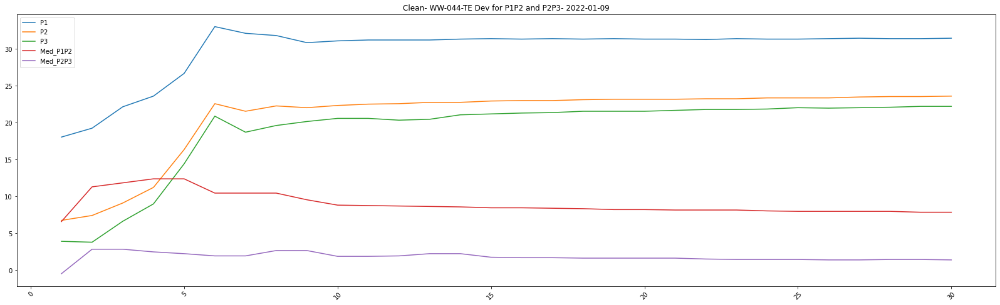

None

In [0]:
# For 9th Jan 2022 > Higher P1P2

plt.figure(figsize=(28,8))

length = range(1, len(final_df_044_09['dt'][:30])+1)
plt.plot(length, final_df_044_09['Pressure1_PSI'][:30], label='P1')
plt.plot(length, final_df_044_09['Pressure2_PSI'][:30], label='P2')
plt.plot(length, final_df_044_09['Pressure3_PSI'][:30], label='P3')
# plt.plot(length, df_pd_044_09['P1P2Delta'], label='P1P2D')
# plt.plot(length, df_pd_044_09['P2P3Delta'], label='P2P3D')

plt.plot(length, final_df_044_09['roll_median_P1P2'][:30], label='Med_P1P2')
plt.plot(length, final_df_044_09['roll_median_P2P3'][:30], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean- WW-044-TE Dev for P1P2 and P2P3- 2022-01-09")
print(plt.legend())
print(plt.show())

Legend

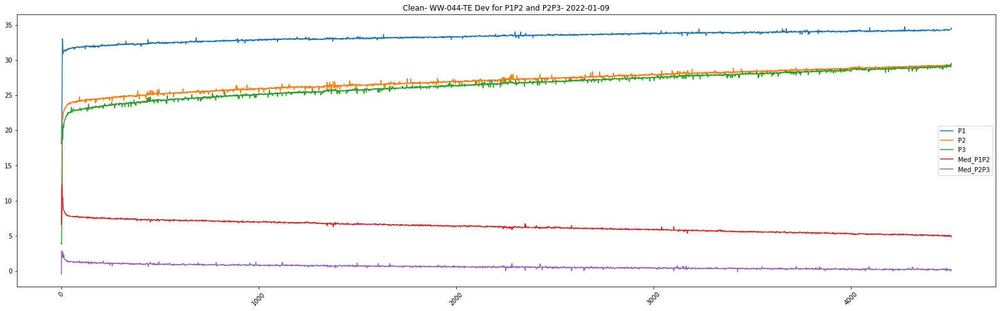

None

In [0]:
# For 9th Jan 2022 > Higher P1P2

plt.figure(figsize=(28,8))

length = range(1, len(final_df_044_09['dt'])+1)
plt.plot(length, final_df_044_09['Pressure1_PSI'], label='P1')
plt.plot(length, final_df_044_09['Pressure2_PSI'], label='P2')
plt.plot(length, final_df_044_09['Pressure3_PSI'], label='P3')
# plt.plot(length, df_pd_044_09['P1P2Delta'], label='P1P2D')
# plt.plot(length, df_pd_044_09['P2P3Delta'], label='P2P3D')

plt.plot(length, final_df_044_09['roll_median_P1P2'], label='Med_P1P2')
plt.plot(length, final_df_044_09['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean- WW-044-TE Dev for P1P2 and P2P3- 2022-01-09")
print(plt.legend())
print(plt.show())

Legend

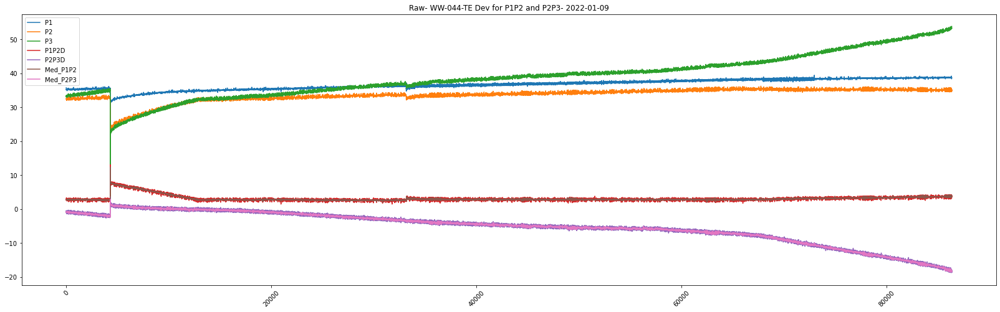

None

In [0]:
# For 9th Jan 2022 > Higher P1P2

plt.figure(figsize=(28,8))

length = range(1, len(df_pd_044_09['dt'])+1)
plt.plot(length, df_pd_044_09['Pressure1_PSI'], label='P1')
plt.plot(length, df_pd_044_09['Pressure2_PSI'], label='P2')
plt.plot(length, df_pd_044_09['Pressure3_PSI'], label='P3')
plt.plot(length, df_pd_044_09['P1P2Delta'], label='P1P2D')
plt.plot(length, df_pd_044_09['P2P3Delta'], label='P2P3D')

plt.plot(length, df_pd_044_09['roll_median_P1P2'], label='Med_P1P2')
plt.plot(length, df_pd_044_09['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Raw- WW-044-TE Dev for P1P2 and P2P3- 2022-01-09")
print(plt.legend())
print(plt.show())

#### deviation scenario

In [0]:
clean_44_dev_31 = final_df_044[(final_df_044.dt >= '2021-12-31T08:58:11.4') & (final_df_044.dt <= '2021-12-31T08:58:27.4')]

In [0]:
# Create dfs based on max diff in std column in descending order  <Mixed of P1P2 and P2P3 deviations>

raw_44_dev_31 = df_pd_044[(df_pd_044.dt >= '2021-12-31T08:58:11.4') & (df_pd_044.dt <= '2021-12-31T08:58:27.4')]

In [0]:
raw_44_dev_31

Out[93]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
1457,WW-044-TE,2021-12-31T08:58:11.4,34.373626,28.692308,28.813187,5.681319,-0.120879,True,False,5.560440,0.181319,0.085474,0.213686,-0.12821
82970,WW-044-TE,2021-12-31T08:58:12.4,34.373626,28.873626,28.692308,5.500000,0.181319,False,False,5.560440,0.181319,0.128212,0.213686,-0.08547
38252,WW-044-TE,2021-12-31T08:58:13.4,34.313187,28.934066,28.873626,5.379121,0.060440,False,False,5.500000,0.060440,0.085474,0.085474,0.00000
38192,WW-044-TE,2021-12-31T08:58:14.4,34.373626,28.813187,28.692308,5.560440,0.120879,False,False,5.500000,0.120879,0.128212,0.042737,0.08547
16744,WW-044-TE,2021-12-31T08:58:15.4,34.373626,28.813187,28.692308,5.560440,0.120879,False,False,5.560440,0.120879,0.000000,0.000000,0.00000
11623,WW-044-TE,2021-12-31T08:58:16.4,34.373626,28.934066,28.631868,5.439560,0.302198,False,False,5.560440,0.120879,0.085474,0.128212,-0.04274
77805,WW-044-TE,2021-12-31T08:58:17.4,34.494505,28.873626,28.692308,5.620879,0.181319,False,False,5.560440,0.181319,0.128212,0.085474,0.04274
77812,WW-044-TE,2021-12-31T08:58:18.4,34.434066,28.692308,28.692308,5.741758,0.000000,False,False,5.620879,0.181319,0.085474,0.128212,-0.04274
82966,WW-044-TE,2021-12-31T08:58:19.4,34.494505,29.296703,28.631868,5.197802,0.664835,False,False,5.620879,0.181319,0.384635,0.470109,-0.08547
77837,WW-044-TE,2021-12-31T08:58:20.4,34.373626,28.450549,29.296703,5.923077,-0.846154,True,False,5.741758,0.000000,0.512847,1.068431,-0.55558


In [0]:
# RAW - IMP - We do see Backpressure just before we see max std in P2P3 sensor

raw_035_24 = df_pd_035_24[(df_pd_035_24.dt >= '2021-11-24T06:36:55.2') & (df_pd_035_24.dt <= '2021-11-24T06:37:17.2')]

In [0]:
df_35_dev_24.shape, raw_035_24.shape

Out[33]: ((11, 14), (23, 14))

In [0]:
df_35_dev_24

Out[34]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
47814,WW-035-TE,2021-11-24T06:37:07.2,35.824176,26.214286,23.675824,9.609890,2.538462,False,False,5.681319,-7.131868,2.777919,6.880693,-4.10277
76750,WW-035-TE,2021-11-24T06:37:08.2,33.708791,23.978022,21.318681,9.730769,2.659341,False,False,9.609890,2.538462,0.085474,0.085474,-0.00000
47787,WW-035-TE,2021-11-24T06:37:09.1,35.340659,26.214286,23.796703,9.126374,2.417582,False,False,9.609890,2.538462,0.427372,0.170949,0.25642
43524,WW-035-TE,2021-11-24T06:37:10.1,36.368132,26.697802,24.098901,9.670330,2.598901,False,False,9.670330,2.598901,0.384635,0.128212,0.25642
18896,WW-035-TE,2021-11-24T06:37:11.1,37.576923,27.967033,25.186813,9.609890,2.780220,False,False,9.609890,2.598901,0.042737,0.128212,-0.08547
64541,WW-035-TE,2021-11-24T06:37:12.1,36.972527,27.543956,24.945055,9.428571,2.598901,False,False,9.609890,2.598901,0.128212,0.128212,0.00000
18910,WW-035-TE,2021-11-24T06:37:13.1,37.153846,27.483516,24.884615,9.670330,2.598901,False,False,9.609890,2.598901,0.170949,0.000000,0.17095
14829,WW-035-TE,2021-11-24T06:37:14.1,37.032967,27.362637,24.280220,9.670330,3.082418,False,False,9.670330,2.598901,0.000000,0.341898,-0.34190
60356,WW-035-TE,2021-11-24T06:37:15.1,36.730769,27.120879,24.340659,9.609890,2.780220,False,False,9.670330,2.780220,0.042737,0.213686,-0.17095
64545,WW-035-TE,2021-11-24T06:37:16.1,36.670330,27.120879,24.098901,9.549451,3.021978,False,False,9.609890,3.021978,0.042737,0.170949,-0.12821


Legend

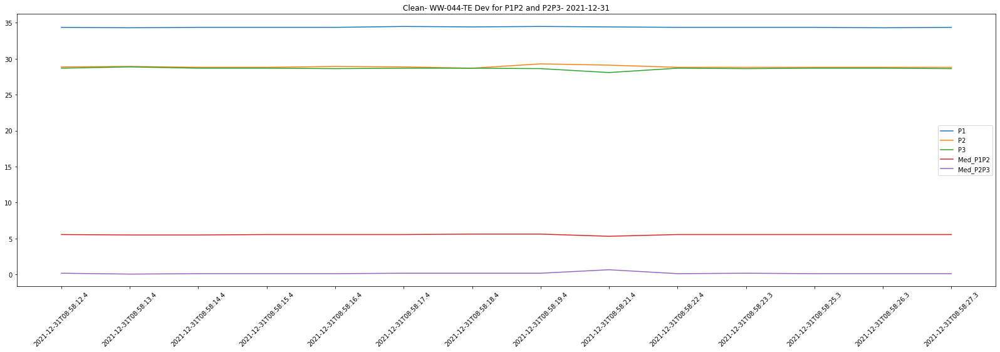

None

In [0]:
### CLEAN ####

plt.figure(figsize=(28,8))

plt.plot(clean_44_dev_31['dt'], clean_44_dev_31['Pressure1_PSI'], label='P1')
plt.plot(clean_44_dev_31['dt'], clean_44_dev_31['Pressure2_PSI'], label='P2')
plt.plot(clean_44_dev_31['dt'], clean_44_dev_31['Pressure3_PSI'], label='P3')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P2P3'], label='STD_P2P3')

plt.plot(clean_44_dev_31['dt'], clean_44_dev_31['roll_median_P1P2'], label='Med_P1P2')
plt.plot(clean_44_dev_31['dt'], clean_44_dev_31['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Clean- WW-044-TE Dev for P1P2 and P2P3- 2021-12-31")
print(plt.legend())
print(plt.show())

Legend

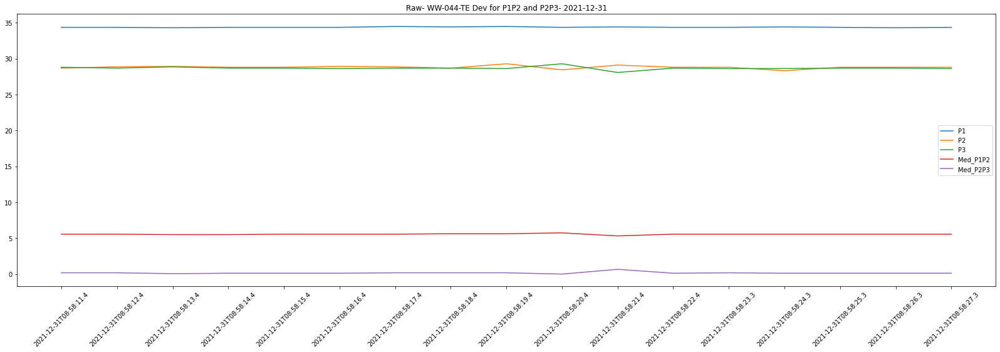

None

In [0]:
### CLEAN ####

plt.figure(figsize=(28,8))

plt.plot(raw_44_dev_31['dt'], raw_44_dev_31['Pressure1_PSI'], label='P1')
plt.plot(raw_44_dev_31['dt'], raw_44_dev_31['Pressure2_PSI'], label='P2')
plt.plot(raw_44_dev_31['dt'], raw_44_dev_31['Pressure3_PSI'], label='P3')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(df_33_dev['dt'], df_33_dev['roll_std_P2P3'], label='STD_P2P3')

plt.plot(raw_44_dev_31['dt'], raw_44_dev_31['roll_median_P1P2'], label='Med_P1P2')
plt.plot(raw_44_dev_31['dt'], raw_44_dev_31['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(df_33_dev['dt'], df_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("Raw- WW-044-TE Dev for P1P2 and P2P3- 2021-12-31")
print(plt.legend())
print(plt.show())

In [0]:
raw_035_24

Out[35]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,roll_median_P1P2,roll_median_P2P3,roll_std_P1P2,roll_std_P2P3,Diff_Std_P1P2_P2P3
28748,WW-035-TE,2021-11-24T06:36:55.2,37.637363,31.956044,39.390110,5.681319,-7.434066,True,False,5.681319,-7.313187,0.000000,0.085474,-0.08547
33402,WW-035-TE,2021-11-24T06:36:56.2,37.576923,31.956044,39.390110,5.620879,-7.434066,True,False,5.681319,-7.434066,0.042737,0.000000,0.04274
37679,WW-035-TE,2021-11-24T06:36:57.2,37.456044,31.895604,39.390110,5.560440,-7.494505,True,False,5.620879,-7.434066,0.042737,0.042737,0.00000
53738,WW-035-TE,2021-11-24T06:36:58.2,37.456044,31.895604,39.390110,5.560440,-7.494505,True,False,5.560440,-7.494505,0.000000,0.000000,0.00000
53753,WW-035-TE,2021-11-24T06:36:59.2,37.456044,31.774725,39.329670,5.681319,-7.554945,True,False,5.560440,-7.494505,0.085474,0.042737,0.04274
30926,WW-035-TE,2021-11-24T06:37:00.2,37.516484,31.895604,39.329670,5.620879,-7.434066,True,False,5.620879,-7.494505,0.042737,0.085474,-0.04274
68578,WW-035-TE,2021-11-24T06:37:01.2,37.637363,31.956044,39.631868,5.681319,-7.675824,True,False,5.681319,-7.554945,0.042737,0.170949,-0.12821
43546,WW-035-TE,2021-11-24T06:37:02.2,37.758242,32.137363,39.329670,5.620879,-7.192308,True,False,5.620879,-7.434066,0.042737,0.341898,-0.29916
51849,WW-035-TE,2021-11-24T06:37:03.2,37.879121,32.137363,38.785714,5.741758,-6.648352,True,False,5.681319,-7.192308,0.085474,0.384635,-0.29916
43523,WW-035-TE,2021-11-24T06:37:04.2,37.879121,32.197802,39.329670,5.681319,-7.131868,True,False,5.681319,-7.131868,0.042737,0.341898,-0.29916


Legend

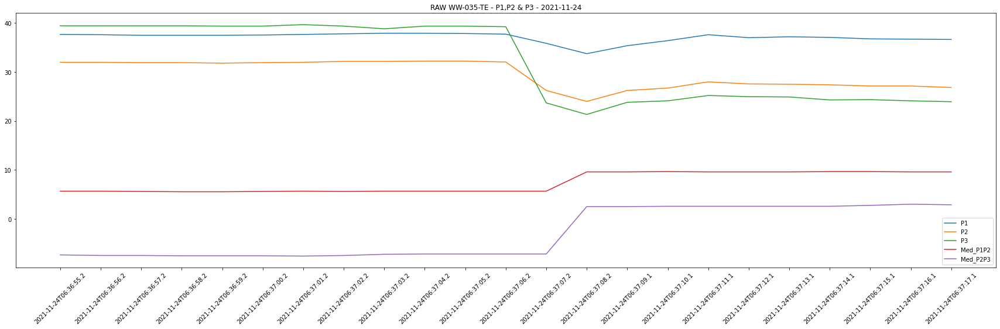

None

In [0]:
### RAW ####

plt.figure(figsize=(30,8))

plt.plot(raw_035_24['dt'], raw_035_24['Pressure1_PSI'], label='P1')
plt.plot(raw_035_24['dt'], raw_035_24['Pressure2_PSI'], label='P2')
plt.plot(raw_035_24['dt'], raw_035_24['Pressure3_PSI'], label='P3')
#plt.plot(raw_33_dev['dt'], raw_33_dev['roll_std_P1P2'], label='STD_P1P2')
#plt.plot(raw_33_dev['dt'], raw_33_dev['roll_std_P2P3'], label='STD_P2P3')

plt.plot(raw_035_24['dt'], raw_035_24['roll_median_P1P2'], label='Med_P1P2')
plt.plot(raw_035_24['dt'], raw_035_24['roll_median_P2P3'], label='Med_P2P3')
#plt.plot(raw_33_dev['dt'], raw_33_dev['Diff_Std_P1P2_P2P3'], label='Diff')


plt.xticks(rotation = 45)
plt.title("RAW WW-035-TE - P1,P2 & P3 - 2021-11-24")
print(plt.legend())
print(plt.show())

## <b> Device ID - WW-005-TE <b>

In [0]:
query_ww_005_test = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt >='2021-10-30' and dt <= '2021-11-02' and ConnectionDeviceID = 'WW-005-TE' ";

df_005_test = spark.sql(query_ww_005_test)

df_005_test_pd = df_005_test.toPandas()

In [0]:
df_005_test_pd

Out[19]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
0,WW-005-TE,2021-10-31T17:55:16.8,53.291209,43.379121,36.065934,9.912088,7.313187,False,False
1,WW-005-TE,2021-11-02T12:28:07.4,54.923077,45.131868,3.186813,9.791209,41.945055,False,False
2,WW-005-TE,2021-10-31T00:01:04.6,52.807692,43.137363,44.406593,9.670330,-1.269231,True,False
3,WW-005-TE,2021-10-31T12:15:08.4,55.527473,45.675824,29.054945,9.851648,16.620879,False,False
4,WW-005-TE,2021-11-01T03:59:15.5,53.109890,42.895604,21.983516,10.214286,20.912088,False,False
...,...,...,...,...,...,...,...,...,...
259123,WW-005-TE,2021-10-31T12:39:26.5,54.983516,45.131868,28.631868,9.851648,16.500000,False,False
259124,WW-005-TE,2021-11-02T11:50:21.9,53.956044,43.802198,2.521978,10.153846,41.280220,False,False
259125,WW-005-TE,2021-10-31T14:13:10,52.565934,43.560440,35.763736,9.005495,7.796703,False,False
259126,WW-005-TE,2021-11-01T05:20:08.3,53.532967,43.379121,18.538462,10.153846,24.840659,False,False


In [0]:
query_ww_005_max_CP = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt >='2021-10-31T10:52:16.3' and dt <= '2021-10-31T10:53:36.3' and ConnectionDeviceID = 'WW-005-TE' ";

df_005_max_cp = spark.sql(query_ww_005_max_CP)

df_005_max_cp_pd = df_005_max_cp.toPandas()

In [0]:
df_005_max_cp_pd.sort_values('dt')

Out[72]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
66,WW-005-TE,2021-10-31T10:52:16.3,55.890110,46.038462,29.175824,9.851648,16.862637,False,False
21,WW-005-TE,2021-10-31T10:52:17.3,56.010989,46.159341,29.175824,9.851648,16.983516,False,False
46,WW-005-TE,2021-10-31T10:52:18.3,56.313187,46.340659,29.296703,9.972527,17.043956,False,False
56,WW-005-TE,2021-10-31T10:52:19.3,56.071429,46.219780,29.296703,9.851648,16.923077,False,False
19,WW-005-TE,2021-10-31T10:52:20.3,56.373626,46.521978,29.175824,9.851648,17.346154,False,False
35,WW-005-TE,2021-10-31T10:52:21.3,56.252747,46.340659,28.994505,9.912088,17.346154,False,False
65,WW-005-TE,2021-10-31T10:52:22.3,56.313187,46.340659,29.296703,9.972527,17.043956,False,False
3,WW-005-TE,2021-10-31T10:52:23.3,56.071429,46.280220,29.296703,9.791209,16.983516,False,False
24,WW-005-TE,2021-10-31T10:52:24.3,56.615385,46.159341,29.598901,10.456044,16.560440,False,False
60,WW-005-TE,2021-10-31T10:52:25.3,55.950549,46.159341,29.296703,9.791209,16.862637,False,False


In [0]:
df_005_max_cp_pd.P2P3Delta.mean(),df_005_max_cp_pd.P2P3Delta.std(),df_005_max_cp_pd.P2P3Delta.min(),df_005_max_cp_pd.P2P3Delta.max()

Out[6]: (16.954735740450026,
 0.22502602703324057,
 16.379120879120876,
 17.34615384615384)

In [0]:
# 3rd STD

df_005_max_cp_pd.P2P3Delta.mean()-3*(df_005_max_cp_pd.P2P3Delta.std()),df_005_max_cp_pd.P2P3Delta.mean()+3*(df_005_max_cp_pd.P2P3Delta.std())

Out[9]: (16.279657659350306, 17.629813821549746)

In [0]:
df_005_max_cp_pd.P2P3Delta.std().cumsum()

Out[49]: array([0.22502603])

In [0]:
df_005_test_pd.dt.min(),df_005_test_pd.dt.max() 

Out[20]: ('2021-10-31T00:00:00', '2021-11-02T23:59:59.9')

In [0]:
%sql


select * from Daily_Cp_Patterns where ID = 'WW-005-TE' and Date = '2021-10-31';

ID,Date,Pattern,Start_Time,End_Time,SD_P1,SD_P2,SD_P3,SD_P1P2D,SD_P2P3D,Duration,BackPressure,SiphonagPressure,Start_Pressure1_PSI,Start_Pressure2_PSI,Start_Pressure3_PSI,Start_P1P2Delta,Start_P2P3Delta,End_Pressure1_PSI,End_Pressure2_PSI,End_Pressure3_PSI,End_P1P2Delta,End_P2P3Delta,SD_Filter,Duration_Filter
WW-005-TE,2021-10-31,4670,2021-10-31T08:31:49.900+0000,2021-10-31T08:33:42.600+0000,0.2251,0.1994,0.0554,0.1469,0.1997,113,0,0,54.92307692307692,44.58791208791209,31.230769230769226,10.335164835164832,13.357142857142861,54.379120879120876,44.346153846153854,31.230769230769226,10.032967032967022,13.115384615384627,0.3,30
WW-005-TE,2021-10-31,4168,2021-10-31T06:42:12.500+0000,2021-10-31T06:44:04.000+0000,0.1981,0.1457,0.0846,0.1062,0.1524,113,0,0,55.950549450549445,45.85714285714286,33.64835164835165,10.093406593406584,12.208791208791212,54.92307692307692,45.07142857142857,33.64835164835165,9.85164835164835,11.42307692307692,0.3,30
WW-005-TE,2021-10-31,4431,2021-10-31T07:43:10.900+0000,2021-10-31T07:44:51.700+0000,0.232,0.221,0.0643,0.1308,0.244,102,0,0,54.802197802197796,44.527472527472526,32.379120879120876,10.27472527472527,12.14835164835165,54.802197802197796,45.13186813186813,32.197802197802204,9.670329670329664,12.934065934065927,0.3,30
WW-005-TE,2021-10-31,4789,2021-10-31T09:01:01.700+0000,2021-10-31T09:02:37.200+0000,0.2166,0.1804,0.0719,0.2075,0.1954,97,0,0,54.681318681318686,44.16483516483517,30.686813186813183,10.516483516483518,13.478021978021985,54.379120879120876,44.527472527472526,30.686813186813183,9.85164835164835,13.840659340659343,0.3,30
WW-005-TE,2021-10-31,4992,2021-10-31T09:56:17.500+0000,2021-10-31T09:57:53.200+0000,0.2204,0.1681,0.0755,0.1513,0.1933,97,0,0,55.527472527472526,45.01098901098901,30.14285714285714,10.516483516483518,14.868131868131869,55.4065934065934,45.01098901098901,30.14285714285714,10.395604395604394,14.868131868131869,0.3,30
WW-005-TE,2021-10-31,4347,2021-10-31T07:18:23.400+0000,2021-10-31T07:19:56.800+0000,0.2809,0.2157,0.0715,0.1244,0.2375,94,0,0,55.104395604395606,45.252747252747255,32.802197802197796,9.85164835164835,12.45054945054946,55.28571428571429,45.01098901098901,32.802197802197796,10.274725274725284,12.208791208791212,0.3,30
WW-005-TE,2021-10-31,5099,2021-10-31T10:29:10.600+0000,2021-10-31T10:30:35.400+0000,0.264,0.177,0.0562,0.1224,0.1905,86,0,0,55.4065934065934,45.61538461538461,29.78021978021978,9.791208791208788,15.835164835164832,55.527472527472526,45.73626373626374,29.659340659340657,9.791208791208788,16.07692307692308,0.3,30
WW-005-TE,2021-10-31,5820,2021-10-31T12:50:49.000+0000,2021-10-31T12:52:14.400+0000,0.2931,0.1934,0.0816,0.1624,0.2052,85,0,0,55.043956043956044,45.07142857142857,28.93406593406594,9.972527472527474,16.137362637362628,54.92307692307692,45.19230769230769,29.05494505494505,9.730769230769226,16.137362637362642,0.3,30
WW-005-TE,2021-10-31,3120,2021-10-31T04:19:16.200+0000,2021-10-31T04:20:36.800+0000,0.2064,0.1435,0.0672,0.1132,0.1459,81,0,0,55.104395604395606,45.07142857142857,36.85164835164835,10.032967032967036,8.219780219780219,54.98351648351648,44.829670329670336,36.730769230769226,10.153846153846146,8.09890109890111,0.3,30
WW-005-TE,2021-10-31,2410,2021-10-31T03:12:41.300+0000,2021-10-31T03:14:00.000+0000,0.2455,0.1704,0.0731,0.1294,0.1647,80,0,0,53.83516483516483,43.74175824175825,38.302197802197796,10.093406593406584,5.439560439560452,53.956043956043956,43.681318681318686,38.181318681318686,10.27472527472527,5.5,0.3,30


In [0]:
df_005_30th_Oct = df_005_test_pd[(df_005_test_pd.dt >= '2021-10-30T00:00:00') & (df_005_test_pd.dt < '2021-10-31T00:00:00')].sort_values('dt')
df_005_31st_Oct = df_005_test_pd[(df_005_test_pd.dt >= '2021-10-31T00:00:00') & (df_005_test_pd.dt < '2021-11-01T00:00:00')].sort_values('dt')
df_005_1st_Nov = df_005_test_pd[(df_005_test_pd.dt >= '2021-11-01T00:00:00') & (df_005_test_pd.dt < '2021-11-02T00:00:00')].sort_values('dt')
#df_005_2nd_Nov = df_005_test_pd[(df_005_test_pd.dt >= '2021-11-02T00:00:00') & (df_005_test_pd.dt < '2021-11-03T00:00:00')]

In [0]:
df_005_31st_Oct

Out[3]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
0,WW-005-TE,2021-10-31T17:55:16.8,53.291209,43.379121,36.065934,9.912088,7.313187,False,False
1,WW-005-TE,2021-10-31T00:01:04.6,52.807692,43.137363,44.406593,9.670330,-1.269231,True,False
2,WW-005-TE,2021-10-31T12:15:08.4,55.527473,45.675824,29.054945,9.851648,16.620879,False,False
5,WW-005-TE,2021-10-31T05:05:00.6,55.829670,46.219780,36.186813,9.609890,10.032967,False,False
7,WW-005-TE,2021-10-31T22:56:26.2,53.835165,43.741758,33.769231,10.093407,9.972527,False,False
...,...,...,...,...,...,...,...,...,...
259184,WW-005-TE,2021-10-31T07:17:11.7,54.016484,43.560440,32.923077,10.456044,10.637363,False,False
259189,WW-005-TE,2021-10-31T23:31:13.6,54.076923,44.285714,32.137363,9.791209,12.148352,False,False
259191,WW-005-TE,2021-10-31T23:32:47,54.137363,44.285714,32.016484,9.851648,12.269231,False,False
259193,WW-005-TE,2021-10-31T12:39:26.5,54.983516,45.131868,28.631868,9.851648,16.500000,False,False


In [0]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from matplotlib.dates import MonthLocator, DateFormatter

# # Sample data
# dates = pd.date_range('2021-10-31', '2021-11-03')
# values = np.random.rand(len(dates))
# df = pd.DataFrame({"Date": df_005_31st.dt,
#                    "Device":df_005_31st.ID,
#                    "Value": values,
#                    "P1" :df_005_31st.Pressure1_PSI,
#                    "P2" :df_005_31st.Pressure2_PSI,
#                    "P3" :df_005_31st.Pressure3_PSI,
#                    "P1P2D" :df_005_31st.P1P2Delta,
#                    "P1P2D" :df_005_31st.P1P2Delta,                  
#                   })

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3213175969838240> in <module> 
 7 dates = pd . date_range ( '2021-10-31' , '2021-11-03' ) 
 8 values = np . random . rand ( len ( dates ) ) 
 ----> 9 df = pd.DataFrame({"Date": dt,
 10 "Device" : ID , 
 11 "Value" : values , 

 NameError : name 'dt' is not defined

In [0]:
# fig, ax = plt.subplots()

# ax.plot(df_005_31st.dt, df_005_31st.Pressure1_PSI)
# ax.plot(df_005_31st.dt, df_005_31st.Pressure2_PSI)
# ax.plot(df_005_31st.dt, df_005_31st.Pressure3_PSI)
# #ax.xaxis.set_major_locator(MonthLocator())  # Tick locator
# #ax.xaxis.set_major_formatter(DateFormatter('%B'))  # Date format


Out[40]:

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(12,10)})

Legend

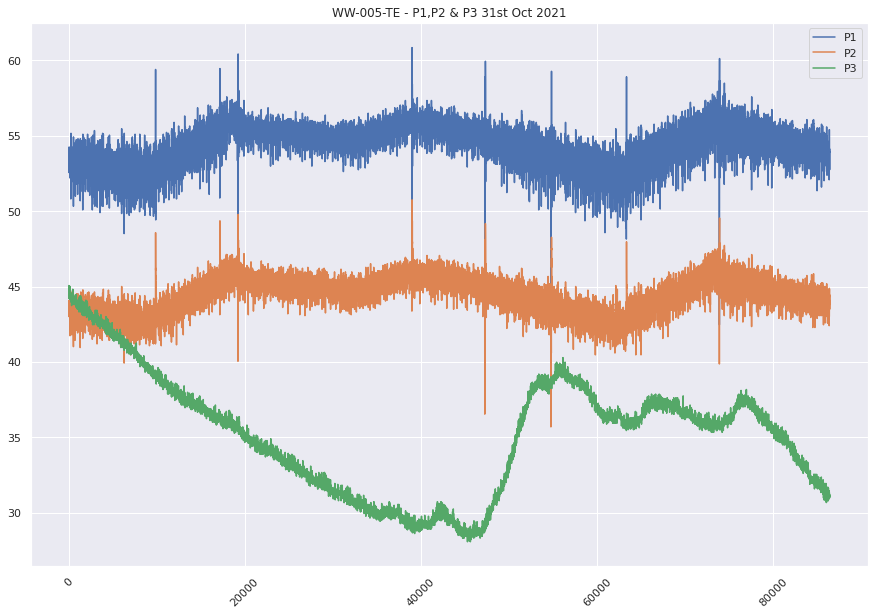

None

In [0]:
# plt.figure(figsize=(15,10))

# length = range(1, len(df_005_31st_Oct['Pressure1_PSI'])+1)
# plt.plot(length, df_005_31st_Oct['Pressure1_PSI'], label='P1')
# plt.plot(length, df_005_31st_Oct['Pressure2_PSI'], label='P2')
# plt.plot(length, df_005_31st_Oct['Pressure3_PSI'], label='P3')
# plt.xticks(rotation = 45)
# plt.title("WW-005-TE - P1,P2 & P3 31st Oct 2021")
# #plt.title("WW-006-GF - P1 & P3 - 2022-04-19")
# print(plt.legend())
# print(plt.show())

Legend

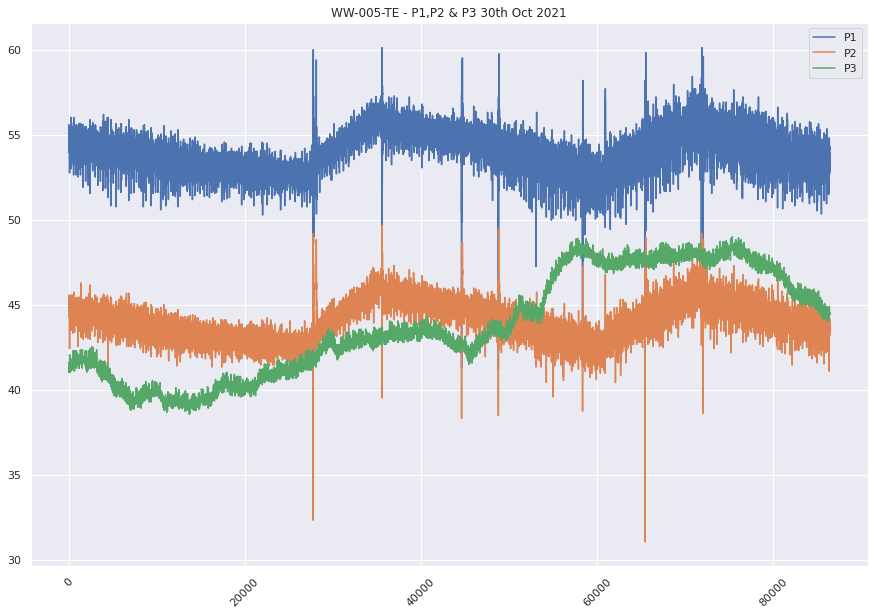

None

In [0]:
# plt.figure(figsize=(15,10))

# length = range(1, len(df_005_30th_Oct['Pressure1_PSI'])+1)
# plt.plot(length, df_005_30th_Oct['Pressure1_PSI'], label='P1')
# plt.plot(length, df_005_30th_Oct['Pressure2_PSI'], label='P2')
# plt.plot(length, df_005_30th_Oct['Pressure3_PSI'], label='P3')
# plt.xticks(rotation = 45)
# plt.title("WW-005-TE - P1,P2 & P3 30th Oct 2021")
# #plt.title("WW-006-GF - P1 & P3 - 2022-04-19")
# print(plt.legend())
# print(plt.show())

Legend

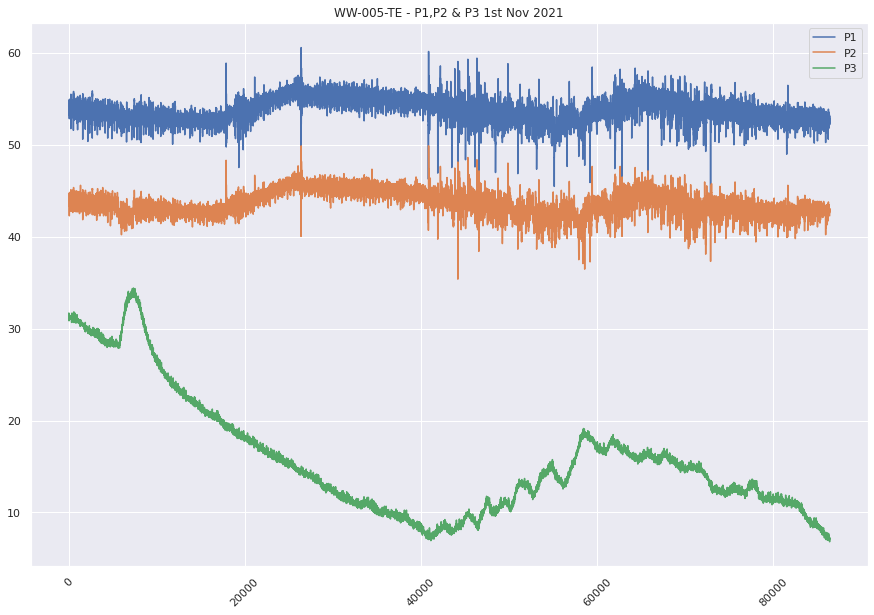

None

In [0]:
# plt.figure(figsize=(15,10))

# length = range(1, len(df_005_1st_Nov['Pressure1_PSI'])+1)
# plt.plot(length, df_005_1st_Nov['Pressure1_PSI'], label='P1')
# plt.plot(length, df_005_1st_Nov['Pressure2_PSI'], label='P2')
# plt.plot(length, df_005_1st_Nov['Pressure3_PSI'], label='P3')
# plt.xticks(rotation = 45)
# plt.title("WW-005-TE - P1,P2 & P3 1st Nov 2021")
# #plt.title("WW-006-GF - P1 & P3 - 2022-04-19")
# print(plt.legend())
# print(plt.show())

In [0]:
df_WW_005_query_pd.columns

Out[23]: Index(['ID', 'Date', 'Pattern', 'Start_Time', 'End_Time', 'SD_P1', 'SD_P2',
 'SD_P3', 'SD_P1P2D', 'SD_P2P3D', 'Duration', 'BackPressure',
 'SiphonagPressure', 'Start_Pressure1_PSI', 'Start_Pressure2_PSI',
 'Start_Pressure3_PSI', 'Start_P1P2Delta', 'Start_P2P3Delta',
 'End_Pressure1_PSI', 'End_Pressure2_PSI', 'End_Pressure3_PSI',
 'End_P1P2Delta', 'End_P2P3Delta', 'SD_Filter', 'Duration_Filter'],
 dtype='object')

In [0]:
WW_005_query = "select ID,Date,Start_Time,End_Time,SD_P1, SD_P2,SD_P3, SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter from Daily_Cp_Patterns where ID ='WW-005-TE' and Date ='2021-10-31' and Start_time >= '2021-10-31T10:48:23.700' and End_time < '2021-10-31T11:02:27.900' ";

df_WW_005_query = spark.sql(WW_005_query)

df_WW_005_query_pd = df_WW_005_query.toPandas()

In [0]:
df_WW_005_query_pd.sort_values('Start_Time')

Out[31]:

,ID,Date,Start_Time,End_Time,SD_P1,SD_P2,SD_P3,SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter
0,WW-005-TE,2021-10-31,2021-10-31 10:48:23.700,2021-10-31 10:49:13.100,0.2447,0.1682,0.0680,0.1067,0.1853,51,0.3,30
1,WW-005-TE,2021-10-31,2021-10-31 10:48:23.700,2021-10-31 10:49:13.100,0.2447,0.1682,0.0680,0.1067,0.1853,51,0.3,20
2,WW-005-TE,2021-10-31,2021-10-31 10:52:25.300,2021-10-31 10:52:46.300,0.2590,0.1986,0.1137,0.1711,0.2244,22,0.3,20
3,WW-005-TE,2021-10-31,2021-10-31 11:01:27.900,2021-10-31 11:01:53.400,0.1295,0.0839,0.0628,0.0897,0.1144,27,0.2,20


In [0]:
%sql

query

## <b> std() Analysis <b>

In [0]:
#-- %sql

#-- select * from Daily_Cp_Patterns where ID = 'WW-078-GF';

#-- select * from Daily_Cp_Patterns where Date between '2021-08-01' and '2022-08-01';

std_query = "select ID,Date,Pattern,Start_Time,End_Time,SD_P1, SD_P2,SD_P3, SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter from Daily_Cp_Patterns where Date between '2021-08-01' and '2022-08-01' ";

df_std_query = spark.sql(std_query)

df_std_query_pd = df_std_query.toPandas()

In [0]:
#df_std_query_pd[df_std_query_pd['SD_P2P3D']==df_std_query_pd['SD_P2P3D'].max()]  # Daily_Cp_Patterns > between '2021-08-01' and '2022-08-01' "

df_std_query_pd.sort_values('SD_P2P3D',ascending=False).head(10)

Out[15]:

,ID,Date,Pattern,Start_Time,End_Time,SD_P1,SD_P2,SD_P3,SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter
6020143,WW-043-TE,2022-05-31,8049,2022-05-31 13:39:16.200,2022-05-31 13:39:38.800,0.2022,0.2833,0.2944,0.1363,0.5342,23,0.3,20
5120757,WW-043-TE,2022-05-27,1651,2022-05-27 03:35:56.100,2022-05-27 03:36:23.000,0.2882,0.2926,0.2924,0.1345,0.5275,28,0.3,20
5514458,WW-043-TE,2022-05-20,11129,2022-05-20 17:43:00.200,2022-05-20 17:43:20.100,0.1955,0.2981,0.2801,0.1776,0.5263,21,0.3,20
5310788,WW-043-TE,2022-05-26,12500,2022-05-26 22:53:30.500,2022-05-26 22:53:53.100,0.2898,0.2904,0.2708,0.2089,0.5247,24,0.3,20
6275686,WW-023-TE,2021-09-05,2345,2021-09-05 06:38:33.000,2021-09-05 06:39:06.100,0.2522,0.2838,0.2654,0.0974,0.5177,34,0.3,20
8364172,WW-023-TE,2021-09-05,2345,2021-09-05 06:38:33.000,2021-09-05 06:39:06.100,0.2522,0.2838,0.2654,0.0974,0.5177,34,0.3,30
5440959,WW-045-TE,2022-06-26,3345,2022-06-26 10:38:14.600,2022-06-26 10:38:47.500,0.2552,0.2948,0.2609,0.5065,0.5013,34,0.3,30
2776266,WW-045-TE,2022-06-26,3345,2022-06-26 10:38:14.600,2022-06-26 10:38:47.500,0.2552,0.2948,0.2609,0.5065,0.5013,34,0.3,20
5736670,WW-043-TE,2022-06-07,14119,2022-06-07 22:14:04.900,2022-06-07 22:14:25.700,0.2700,0.2914,0.2331,0.1489,0.4989,22,0.3,20
895423,WW-006-GF,2021-08-14,9249,2021-08-14 22:12:28.200,2021-08-14 22:12:48.000,0.0582,0.2784,0.2336,0.2603,0.4987,20,0.3,20


In [0]:
#df_std_query_pd[df_std_query_pd['SD_P1P2D']==df_std_query_pd['SD_P1P2D'].max()]  # Daily_Cp_Patterns > between '2021-08-01' and '2022-08-01' "

df_std_query_pd.sort_values('SD_P1P2D',ascending=False).head(10)

Out[16]:

,ID,Date,Pattern,Start_Time,End_Time,SD_P1,SD_P2,SD_P3,SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter
6552022,WW-045-TE,2022-02-12,11796,2022-02-12 22:55:45.700,2022-02-12 22:56:10.600,0.2860,0.2849,0.2961,0.5377,0.1134,26,0.3,20
5730140,WW-045-TE,2022-04-07,5517,2022-04-07 11:54:27.800,2022-04-07 11:54:46.100,0.2795,0.2856,0.2821,0.5204,0.0954,20,0.3,20
6774441,WW-045-TE,2022-04-01,9625,2022-04-01 17:41:59.000,2022-04-01 17:42:22.800,0.2760,0.2791,0.2881,0.5175,0.1608,24,0.3,20
6701334,WW-045-TE,2022-03-25,7819,2022-03-25 15:27:06.700,2022-03-25 15:27:37.400,0.2853,0.2569,0.2544,0.5160,0.1162,32,0.3,20
8062896,WW-045-TE,2022-03-25,7819,2022-03-25 15:27:06.700,2022-03-25 15:27:37.400,0.2853,0.2569,0.2544,0.5160,0.1162,32,0.3,30
7268814,WW-045-TE,2022-04-03,7696,2022-04-03 17:33:28.600,2022-04-03 17:33:59.500,0.2814,0.2874,0.2839,0.5143,0.1224,32,0.3,30
5259333,WW-045-TE,2022-04-03,7696,2022-04-03 17:33:28.600,2022-04-03 17:33:59.500,0.2814,0.2874,0.2839,0.5143,0.1224,32,0.3,20
4133430,WW-006-GF,2022-04-17,1713,2022-04-17 03:31:09.600,2022-04-17 03:31:29.600,0.2886,0.2895,0.2671,0.5119,0.1670,21,0.3,20
4888336,WW-071-TE,2022-07-23,5335,2022-07-23 11:17:41.100,2022-07-23 11:18:00.100,0.2782,0.2506,0.2994,0.5104,0.0998,20,0.3,20
6244794,WW-005-TE,2022-02-10,3034,2022-02-10 09:18:28.800,2022-02-10 09:18:47.800,0.2954,0.2887,0.0831,0.5098,0.3166,20,0.3,20


In [0]:
# MedMean summary table
data[((data['Device']=='WW-043-TE'))& (data['month']==5) ].sort_values(['Device','year','month','W_O_M'])# & (data['Date']=='2022-05-31')]

Out[32]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
99,1,5,2022,WW-043-TE,2.100000,2.500000
380,2,5,2022,WW-043-TE,1.900000,2.300000
660,3,5,2022,WW-043-TE,1.871429,2.271429
938,4,5,2022,WW-043-TE,1.828571,2.200000
1212,5,5,2022,WW-043-TE,1.900000,2.200000


In [0]:
%sql

-- select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id = 'WW-005-TE' and Date = '2022-04-25'

-- select * from Daily_CP_Patterns_Full_Granular table where id

select * from Daily_CP_Patterns_2Filter_Comb_ComparisionResults where id='WW-043-TE' and Date between '2022-05-30' and '2022-06-01'

ID,Date,SD_Filter,Duration_Filter,num_patterns_var,total_duration_var,Mean_CP_P1P2D,Mean_CP_P2P3D,Mode_CP_P1P2D,Mode_CP_P2P3D,Median_CP_P1P2D,Median_CP_P2P3D
WW-043-TE,2022-05-31,0.3,60,6,452,1.8779052805601477,2.2234270154624136,1.8736263736263794,2.175824175824175,1.8736263736263794,2.236263736263737
WW-043-TE,2022-05-31,0.3,30,129,5049,1.881107998755065,2.2033445856975393,1.8131868131868174,2.175824175824175,1.8736263736263794,2.175824175824175
WW-043-TE,2022-05-31,0.3,20,434,12232,1.8796347537353957,2.2012609692464746,1.7527472527472554,2.175824175824175,1.8736263736263794,2.175824175824175
WW-043-TE,2022-06-01,0.3,20,398,10678,1.8720075579037703,2.2024780332983225,1.7527472527472554,2.175824175824175,1.8736263736263652,2.175824175824175
WW-043-TE,2022-06-01,0.3,60,2,131,1.803036657998489,2.3013170036070814,1.6923076923076934,2.236263736263737,1.8131868131868032,2.296703296703299
WW-043-TE,2022-06-01,0.3,30,106,3890,1.8664792790756928,2.2142786519393765,1.7527472527472554,2.236263736263737,1.8736263736263652,2.236263736263737
WW-043-TE,2022-06-01,0.2,20,2,46,1.8197563306258977,2.262541806020067,1.7527472527472554,2.296703296703299,1.8131868131868174,2.266483516483518
WW-043-TE,2022-05-30,0.3,30,172,6512,1.8798169735669774,2.1941639441639547,1.7527472527472554,2.175824175824175,1.8736263736263794,2.175824175824175
WW-043-TE,2022-05-30,0.3,60,7,471,1.871958190429528,2.199435384148763,1.7527472527472554,2.175824175824175,1.8736263736263794,2.175824175824175
WW-043-TE,2022-05-30,0.3,20,611,16741,1.8689655127144005,2.172282499174582,1.7527472527472554,2.175824175824175,1.8736263736263652,2.175824175824175


In [0]:
# %sql

# select * from Daily_CP_Patterns_Full_Granular table where id='WW-043-TE' and Date = '2022-05-31' and Pattern = 8049 -- start time > 2022-05-31 13:39:16.200 , end > 2022-05-31 13:39:38.800

query_043_gran = "select * from Daily_CP_Patterns_Full_Granular table where id='WW-043-TE' and Date = '2022-05-31' and Pattern = 8049 ";

df_043_gran = spark.sql(query_043_gran)

df_043_gran_pd = df_043_gran.toPandas()

In [0]:
df_043_gran_pd.sort_values('dt')

Out[41]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,Date,Pressure1_SD,Pressure2_SD,Pressure3_SD,Counter,Pattern,SD_Filter,Duration_Filter
5,WW-043-TE,2022-05-31T13:39:16.2,56.978022,54.983516,49.785714,1.994505,5.197802,False,False,2022-05-31,0.726533,0.598321,0.128212,1,8049,0.3,20
22,WW-043-TE,2022-05-31T13:39:17.2,57.038462,54.741758,49.785714,2.296703,4.956044,False,False,2022-05-31,0.042737,0.170949,0.000000,2,8049,0.3,20
10,WW-043-TE,2022-05-31T13:39:18.2,57.038462,54.620879,49.846154,2.417582,4.774725,False,False,2022-05-31,0.000000,0.085474,0.042737,3,8049,0.3,20
4,WW-043-TE,2022-05-31T13:39:19.2,57.159341,54.923077,49.967033,2.236264,4.956044,False,False,2022-05-31,0.085474,0.213686,0.085474,4,8049,0.3,20
21,WW-043-TE,2022-05-31T13:39:20.2,57.098901,54.862637,49.967033,2.236264,4.895604,False,False,2022-05-31,0.042737,0.042737,0.000000,5,8049,0.3,20
20,WW-043-TE,2022-05-31T13:39:21.2,56.796703,54.439560,50.087912,2.357143,4.351648,False,False,2022-05-31,0.213686,0.299161,0.085474,6,8049,0.3,20
3,WW-043-TE,2022-05-31T13:39:22.2,57.159341,54.681319,50.148352,2.478022,4.532967,False,False,2022-05-31,0.256423,0.170949,0.042737,7,8049,0.3,20
9,WW-043-TE,2022-05-31T13:39:23.8,56.736264,54.379121,50.148352,2.357143,4.230769,False,False,2022-05-31,0.299161,0.213686,0.000000,8,8049,0.3,20
8,WW-043-TE,2022-05-31T13:39:24.8,56.615385,54.016484,50.148352,2.598901,3.868132,False,False,2022-05-31,0.085474,0.256423,0.000000,9,8049,0.3,20
2,WW-043-TE,2022-05-31T13:39:25.8,56.857143,54.197802,50.269231,2.659341,3.928571,False,False,2022-05-31,0.170949,0.128212,0.085474,10,8049,0.3,20


In [0]:
df_043_gran_pd.P2P3Delta.std(),df_043_gran_pd.P2P3Delta.mean(),df_043_gran_pd.P2P3Delta.min(),df_043_gran_pd.P2P3Delta.max(),

Out[50]: (0.5461811473621322, 4.102006688963209, 3.324175824175825, 5.19780219780219)

In [0]:
query_043 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev 
  where dt >='2022-05-31T13:39:06.2' and dt <= '2022-05-31T13:39:46.2' and ConnectionDeviceID = 'WW-043-TE' ";

df_043 = spark.sql(query_043)

df_043_pd = df_043.toPandas()

In [0]:
df_043_pd.sort_values('dt')

Out[46]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
12,WW-043-TE,2022-05-31T13:39:06.2,51.719780,49.060440,50.269231,2.659341,-1.208791,True,False
9,WW-043-TE,2022-05-31T13:39:07.2,51.840659,49.060440,50.027473,2.780220,-0.967033,True,False
37,WW-043-TE,2022-05-31T13:39:08.2,51.780220,49.000000,50.329670,2.780220,-1.329670,True,False
15,WW-043-TE,2022-05-31T13:39:09.2,51.961538,49.241758,50.087912,2.719780,-0.846154,True,False
38,WW-043-TE,2022-05-31T13:39:10.2,52.021978,49.362637,49.725275,2.659341,-0.362637,True,False
21,WW-043-TE,2022-05-31T13:39:11.2,51.780220,49.362637,49.604396,2.417582,-0.241758,True,False
36,WW-043-TE,2022-05-31T13:39:12.2,52.505495,50.087912,49.604396,2.417582,0.483516,False,False
2,WW-043-TE,2022-05-31T13:39:13.2,53.412088,51.236264,49.483516,2.175824,1.752747,False,False
27,WW-043-TE,2022-05-31T13:39:14.2,56.071429,54.620879,49.241758,1.450549,5.379121,False,False
23,WW-043-TE,2022-05-31T13:39:15.2,55.950549,54.137363,49.604396,1.813187,4.532967,False,False


In [0]:
df_std_query_pd[df_std_query_pd['SD_P1P2D']==df_std_query_pd['SD_P1P2D'].max()] 

Out[38]:

,ID,Date,Pattern,Start_Time,End_Time,SD_P1,SD_P2,SD_P3,SD_P1P2D,SD_P2P3D,Duration,SD_Filter,Duration_Filter
6552022,WW-045-TE,2022-02-12,11796,2022-02-12 22:55:45.700,2022-02-12 22:56:10.600,0.286,0.2849,0.2961,0.5377,0.1134,26,0.3,20


In [0]:
# MedMean summary table
data[((data['Device']=='WW-045-TE'))& (data['month']==2)].sort_values(['Device','year','month','W_O_M'])# & (data['Date']=='2022-05-31')]

Out[39]:

,W_O_M,month,year,Device,CP_P1P2D,CP_P2P3D
31,1,2,2022,WW-045-TE,1.620000,0.300000
310,2,2,2022,WW-045-TE,1.628571,0.300000
592,3,2,2022,WW-045-TE,1.614286,0.300000
870,4,2,2022,WW-045-TE,1.742857,0.314286
1143,5,2,2022,WW-045-TE,1.750000,0.300000


In [0]:
query_045_gran = "select * from Daily_CP_Patterns_Full_Granular table where id='WW-045-TE' and Date = '2022-02-12' and Pattern = 11796 ";

df_045_gran = spark.sql(query_045_gran)

df_045_gran_pd = df_045_gran.toPandas()

In [0]:
df_045_gran_pd.sort_values('dt')

Out[44]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent,Date,Pressure1_SD,Pressure2_SD,Pressure3_SD,Counter,Pattern,SD_Filter,Duration_Filter
36,WW-045-TE,2022-02-12T09:20:07.7,66.346154,65.983516,65.681319,0.362637,0.302198,False,False,2022-02-12,0.213686,0.000000,0.085474,1,11796,0.2,20
33,WW-045-TE,2022-02-12T09:20:08.7,66.406593,65.862637,65.500000,0.543956,0.362637,False,False,2022-02-12,0.042737,0.085474,0.128212,2,11796,0.2,20
37,WW-045-TE,2022-02-12T09:20:09.7,66.587912,65.862637,65.560440,0.725275,0.302198,False,False,2022-02-12,0.128212,0.000000,0.042737,3,11796,0.2,20
26,WW-045-TE,2022-02-12T09:20:10.7,66.406593,65.802198,65.439560,0.604396,0.362637,False,False,2022-02-12,0.128212,0.042737,0.085474,4,11796,0.2,20
38,WW-045-TE,2022-02-12T09:20:11.7,66.527473,65.862637,65.560440,0.664835,0.302198,False,False,2022-02-12,0.085474,0.042737,0.085474,5,11796,0.2,20
46,WW-045-TE,2022-02-12T09:20:12.7,66.587912,65.802198,65.379121,0.785714,0.423077,False,False,2022-02-12,0.042737,0.042737,0.128212,6,11796,0.2,20
43,WW-045-TE,2022-02-12T09:20:13.7,66.587912,65.802198,65.379121,0.785714,0.423077,False,False,2022-02-12,0.000000,0.000000,0.000000,7,11796,0.2,20
27,WW-045-TE,2022-02-12T09:20:14.7,66.406593,65.741758,65.379121,0.664835,0.362637,False,False,2022-02-12,0.128212,0.042737,0.000000,8,11796,0.2,20
39,WW-045-TE,2022-02-12T09:20:15.7,66.527473,65.741758,65.439560,0.785714,0.302198,False,False,2022-02-12,0.085474,0.000000,0.042737,9,11796,0.2,20
28,WW-045-TE,2022-02-12T09:20:16.7,66.527473,65.741758,65.379121,0.785714,0.362637,False,False,2022-02-12,0.000000,0.000000,0.042737,10,11796,0.2,20


In [0]:
query_045 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt >='2022-02-12T22:55:43.7' and dt <= '2022-02-12T22:56:15.6' and ConnectionDeviceID = 'WW-045-TE' ";

df_045 = spark.sql(query_045)

df_045_pd = df_045.toPandas().sort_values('dt')

In [0]:
df_045_pd

Out[50]:

,ID,dt,Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta,P2P3Delta,P3P2BackPressureEvent,P2P1SiphonagPressureEvent
12,WW-045-TE,2022-02-12T22:55:43.7,62.236264,60.302198,60.060440,1.934066,0.241758,False,False
18,WW-045-TE,2022-02-12T22:55:44.7,62.236264,60.302198,60.000000,1.934066,0.302198,False,False
14,WW-045-TE,2022-02-12T22:55:45.7,62.719780,60.362637,60.060440,2.357143,0.302198,False,False
29,WW-045-TE,2022-02-12T22:55:46.7,62.659341,60.423077,60.000000,2.236264,0.423077,False,False
21,WW-045-TE,2022-02-12T22:55:47.7,62.840659,60.362637,60.120879,2.478022,0.241758,False,False
30,WW-045-TE,2022-02-12T22:55:48.7,62.840659,60.362637,60.181319,2.478022,0.181319,False,False
9,WW-045-TE,2022-02-12T22:55:49.7,62.901099,60.483516,60.302198,2.417582,0.181319,False,False
15,WW-045-TE,2022-02-12T22:55:50.7,62.961538,60.543956,60.302198,2.417582,0.241758,False,False
16,WW-045-TE,2022-02-12T22:55:51.7,62.840659,60.725275,60.423077,2.115385,0.302198,False,False
28,WW-045-TE,2022-02-12T22:55:52.7,62.780220,60.785714,60.423077,1.994505,0.362637,False,False


## <b> Device ID - W2-202-GF <b>

In [0]:
query_w2_202 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt >='2022-06-01'  and dt < '2022-07-01' and ConnectionDeviceID = 'W2-202-GF' ";

df_202 = spark.sql(query_w2_202)

df_202.show()



+---------+--------------------+------------------+------------------+------------------+--------------------+--------------------+---------------------+-------------------------+
 ID| dt| Pressure1_PSI| Pressure2_PSI| Pressure3_PSI| P1P2Delta| P2P3Delta|P3P2BackPressureEvent|P2P1SiphonagPressureEvent|
+---------+--------------------+------------------+------------------+------------------+--------------------+--------------------+---------------------+-------------------------+
W2-202-GF|2022-06-09T15:21:...| -999.0| 1.629494505494506| 1.629494505494506| -1000.6294945054944| 0.0| false| true|
W2-202-GF|2022-06-09T22:19:...| -999.0|1.5359743589743644|1.5359743589743644| -1000.5359743589744| 0.0| false| true|
W2-202-GF|2022-06-09T13:27:...| -999.0|1.5359743589743644|1.5359743589743644| -1000.5359743589744| 0.0| false| true|
W2-202-GF|2022-06-08T17:41:...| -999.0| 1.629494505494506| 1.629494505494506| -1000.6294945054944| 0.0| false| true|
W2-202-GF|2022-06-09T13:41:...| -999.0|1.5359743589743644| 1.629494505494506| -1000.5359743589744|-0.09352014652014162| true| true|
W2-202-GF|2022-06-09T05:08:...| -999.0| 1.629494505494506|1.5359743589743644| -1000.6294945054944| 0.09352014652014162| false| true|
W2-202-GF|2022-06-08T17:41:...| -999.0| 1.629494505494506| 1.629494505494506| -1000.6294945054944| 0.0| false| true|
W2-202-GF|2022-06-08T17:41:...| -999.0|1.5359743589743644| 1.629494505494506| -1000.5359743589744|-0.09352014652014162| true| true|
W2-202-GF|2022-06-09T05:08:...| -999.0| 1.629494505494506|1.5359743589743644| -1000.6294945054944| 0.09352014652014162| false| true|
W2-202-GF|2022-06-09T03:48:...| -999.0| 1.629494505494506|1.5359743589743644| -1000.6294945054944| 0.09352014652014162| false| true|
W2-202-GF|2022-06-13T06:09:...| -999.0|1.5359743589743644| 1.629494505494506| -1000.5359743589744|-0.09352014652014162| true| true|
W2-202-GF|2022-06-09T12:22:...| -999.0| 1.629494505494506|1.5359743589743644| -1000.6294945054944| 0.09352014652014162| false| true|
W2-202-GF|2022-06-08T19:15:...| -999.0|1.5359743589743644| 1.629494505494506| -1000.5359743589744|-0.09352014652014162| true| true|
W2-202-GF|2022-06-13T17:40:...|1.2554139194139253|1.5359743589743644|1.5359743589743644| -0.2805604395604391| 0.0| false| true|
W2-202-GF|2022-06-09T15:21:...| -999.0|1.5359743589743644| 1.629494505494506| -1000.5359743589744|-0.09352014652014162| true| true|
W2-202-GF|2022-06-14T00:48:...| 1.348934065934067| 1.629494505494506| 1.629494505494506| -0.2805604395604391| 0.0| false| true|
W2-202-GF|2022-06-09T03:48:...| -999.0|1.5359743589743644| 1.629494505494506| -1000.5359743589744|-0.09352014652014162| true| true|
W2-202-GF|2022-06-09T06:49:...| -999.0| 1.629494505494506| 1.629494505494506| -1000.6294945054944| 0.0| false| true|
W2-202-GF|2022-06-13T23:12:...|1.4424542124542157| 1.629494505494506| 1.629494505494506|-0.18704029304029035| 0.0| false| true|
W2-202-GF|2022-06-09T22:19:...| -999.0| 1.629494505494506|1.5359743589743644| -1000.6294945054944| 0.09352014652014162| false| true|
+---------+--------------------+------------------+------------------+------------------+--------------------+--------------------+---------------------+-------------------------+
only showing top 20 rows

### >> look into device - W2-202-GF 6th Month 2021, WW-005-TE - 10th month 2021 to 4th month 2022, WW-022-GF - 2nd and 3rd month 2022, ,WW-085-GF - 1st and 2nd month 2022 P1P2D,

## Generic

In [0]:
query_CP = "select * from CP_Patterns_2Filter_Comb_MedMean_Summary where Date between '2021-08-01' and '2022-07-30'";
query_val_CP = spark.sql(query_CP);
    
df_pd_CP = query_val_CP.toPandas().sort_values('Date')

In [0]:
df_pd_CP

Out[4]:

,Device,Date,CP_P1P2D,CP_P2P3D
0,WW-005-TE,2021-08-01,10.6,2.5
2437,WW-085-GF,2021-08-01,8.7,0.1
2435,WW-083-GF,2021-08-01,8.2,1.8
2432,WW-081-GF,2021-08-01,7.8,0.2
2156,WW-075-TE,2021-08-01,7.9,2.1
...,...,...,...,...
5044,WW-041-TE,2022-07-30,8.6,1.6
3611,WW-043-TE,2022-07-30,1.9,2.1
3172,WW-023-TE,2022-07-30,8.4,1.9
2962,WW-006-GF,2022-07-30,3.3,2.6


In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.backends.backend_pdf import PdfPages

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages('/dbfs/FileStore/tables/output_plt.pdf')     #create the pdf named 'output.pdf'
# for i in range(len(dev)):
#     subdf = df[df['group'] == df.iloc[i,1]]
dev = df_pd_CP.Device.unique().tolist()
#dev.remove("WW-085-GF")

#dev = ['WW-005-TE','WW-085-GF','WW-083-GF','WW-081-GF']

for device in dev:
  df_plot = df_pd_CP[df_pd_CP['Device']==device]
  #print(df_plot)
  #df_plot.sort_values('CP_P1P2D',inplace=True)
  plt.hist(df_plot['CP_P1P2D'])#.set(title=device)
  plt.title(device)
  #sns.boxplot(df_plot['CP_P1P2D']).set(title=device)
  #plt.show
  pp.savefig(plt.gcf())            #Save each figure in pdf
  plt.clf()
  df_plot = df_plot.iloc[0:0]
pp.close()

In [0]:
pp = PdfPages('/dbfs/FileStore/tables/output_CP_P2P3.pdf')     #create the pdf named 'output.pdf'
dev = df_pd_CP.Device.unique().tolist()

#dev = ['WW-005-TE','WW-085-GF','WW-083-GF','WW-081-GF']

for device in dev:
  df_plot = df_pd_CP[df_pd_CP['Device']==device]
  #print(df_plot)
  #df_plot.sort_values('CP_P1P2D',inplace=True)
  plt.hist(df_plot['CP_P2P3D'])#.set(title=device)
  plt.title(device + "- CP_P2P3D")
  #sns.boxplot(df_plot['CP_P1P2D']).set(title=device)
  #plt.show
  pp.savefig(plt.gcf())            #Save each figure in pdf
  plt.clf()
  df_plot = df_plot.iloc[0:0]
pp.close()

In [0]:
pp = PdfPages('/dbfs/FileStore/tables/output_CP_P1P2.pdf')     #create the pdf named 'output.pdf'
dev = df_pd_CP.Device.unique().tolist()

#dev = ['WW-005-TE','WW-085-GF','WW-083-GF','WW-081-GF']

for device in dev:
  df_plot = df_pd_CP[df_pd_CP['Device']==device]
  plt.hist(df_plot['CP_P1P2D'])#.set(title=device)
  plt.title(device + "- CP_P1P2D")
  #sns.boxplot(df_plot['CP_P1P2D']).set(title=device)
  #plt.show
  pp.savefig(plt.gcf())            #Save each figure in pdf
  plt.clf()
  df_plot = df_plot.iloc[0:0]
pp.close()

In [0]:
pp = PdfPages('/dbfs/FileStore/tables/output_final.pdf')     #create the pdf named 'output.pdf'
dev = df_pd_CP.Device.unique().tolist()

#dev = ['WW-005-TE','WW-085-GF','WW-083-GF','WW-081-GF']

for device in dev:
  df_plot = df_pd_CP[df_pd_CP['Device']==device]
  #print(df_plot)
  #df_plot.sort_values('CP_P1P2D',inplace=True)
  plt.subplot(1, 2, 2)
  plt.hist(df_plot['CP_P2P3D'])#.set(title=device)
  plt.title(device + "- CP_P2P3D")
  
  plt.subplot(1, 2, 1)
  plt.hist(df_plot['CP_P1P2D'])#.set(title=device)
  plt.title(device + "- CP_P1P2D")
    
  #sns.boxplot(df_plot['CP_P1P2D']).set(title=device)
  #plt.show
  pp.savefig(plt.gcf())            #Save each figure in pdf
  plt.clf()
  df_plot = df_plot.iloc[0:0]
pp.close()

In [0]:
df_pd_CP[df_pd_CP['Device']=='WW-075-TE'].CP_P1P2D.max()

Out[70]: 8.7

In [0]:
df_pd_CP[df_pd_CP['CP_P1P2D'] > 10].Device.unique()

Out[80]: array(['WW-005-TE', 'WW-035-TE', 'WW-026-TE', 'WW-071-TE', 'WW-085-GF',
 'WW-083-GF'], dtype=object)

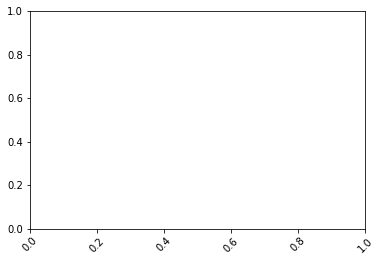

In [0]:
# import plotly.express as px
# import plotly

dev = df_pd_CP.Device.unique()
#length = range(1,len(df['CP_P2P3D'] + 1))
for device in dev:
  df_plot = df_pd_CP[df_pd_CP['Device']==device]
  fig = px.histogram(df_plot,df_plot['CP_P1P2D'],title=device)
  #fig.title(Device)
  plt.xticks(rotation = 45)
  #fig.show()
#   plotly.io.write_image(fig, '/dbfs/FileStore/tables/output_file.pdf', format='pdf')
#   #fig.write_image("/dbfs/FileStore/tables/fig1" + device +".png")
  
  
## Important for PDF plotting 

# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# from matplotlib.backends.backend_pdf import PdfPages

# pp = PdfPages('/dbfs/FileStore/tables/output2.pdf')     #create the pdf named 'output.pdf'
# # for i in range(len(dev)):
# #     subdf = df[df['group'] == df.iloc[i,1]]
# dev = df_pd_CP.Device.unique()
# for device in dev:
#   df_plot = df_pd_CP[df_pd_CP['Device']==device]
#   sns.histplot(df_plot['CP_P1P2D']).set(title=device)
#   plt.show
#   pp.savefig(plt.gcf())            #Save each figure in pdf
# pp.close()
  

In [0]:
#df_pd_CP[(df_pd_CP['Device']=='WW-005-TE')].sort_values('Date')

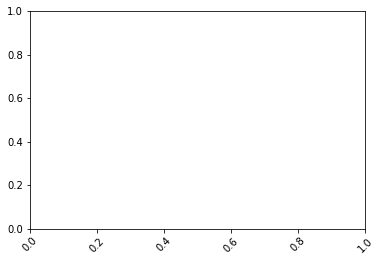

In [0]:
import plotly.express as px
dev = df_pd_CP.Device.unique()
#length = range(1,len(df['CP_P2P3D'] + 1))
for device in dev:
  df_plot = df_pd_CP[df_pd_CP['Device']==device]
  fig = px.histogram(df_plot,df_plot['CP_P2P3D'],title=device)
  #fig.title(Device)
  plt.xticks(rotation = 45)
  fig.show()

In [0]:
# query_005_31 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-10-31%'  and ConnectionDeviceID = 'WW-005-TE' "

# df_005_31 = spark.sql(query_005_31)

# pd_df_005_31 = df_005_31.toPandas().sort_values('dt')

# query_005_1 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-11-01%'  and ConnectionDeviceID = 'WW-005-TE' "

# df_005_1 = spark.sql(query_005_1)

# pd_df_005_1 = df_005_1.toPandas().sort_values('dt')

# query_005_2 = "select ConnectionDeviceID as ID, dt, Pressure1_PSI,Pressure2_PSI,Pressure3_PSI,P1P2Delta, P2P3Delta ,P3P2BackPressureEvent,P2P1SiphonagPressureEvent from logfiles_dev where dt like '%2021-11-02%'  and ConnectionDeviceID = 'WW-005-TE' "

# df_005_2 = spark.sql(query_005_2)

# pd_df_005_2 = df_005_2.toPandas().sort_values('dt')

In [0]:
pd_df_005_31

In [0]:
# ### CLEAN ####

# plt.figure(figsize=(18,8))

# length = range(1, len(pd_df_005_31['std_P1P2'])+1)
# plt.plot(length, pd_df_005_31['Pressure1_PSI'], label='P1')
# plt.plot(length, pd_df_005_31['Pressure2_PSI'], label='P2')
# plt.plot(length, pd_df_005_31['Pressure3_PSI'], label='P3')
# plt.plot(length, pd_df_005_31['std_P1P2'], label='STD_P1P2')
# plt.plot(length, pd_df_005_31['std_P2P3'], label='STD_P2P3')
# #plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


# plt.xticks(rotation = 45)
# plt.title("WW-005-TE P1,P2 & P3 - 2021-10-31")
# print(plt.legend())
# print(plt.show())

In [0]:
# ### CLEAN ####

# plt.figure(figsize=(18,8))

# length = range(1, len(pd_df_005_31['std_P1P2'])+1)
# plt.plot(length, pd_df_005_31['Pressure1_PSI'], label='P1')
# plt.plot(length, pd_df_005_31['Pressure2_PSI'], label='P2')
# plt.plot(length, pd_df_005_31['Pressure3_PSI'], label='P3')
# plt.plot(length, pd_df_005_31['std_P1P2'], label='STD_P1P2')
# plt.plot(length, pd_df_005_31['std_P2P3'], label='STD_P2P3')
# #plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


# plt.xticks(rotation = 45)
# plt.title("WW-005-TE P1,P2 & P3 - 2021-10-31")
# print(plt.legend())
# print(plt.show())

In [0]:
# ### CLEAN ####

# plt.figure(figsize=(18,8))

# length = range(1, len(pd_df_005_31['std_P1P2'])+1)
# plt.plot(length, pd_df_005_31['Pressure1_PSI'], label='P1')
# plt.plot(length, pd_df_005_31['Pressure2_PSI'], label='P2')
# plt.plot(length, pd_df_005_31['Pressure3_PSI'], label='P3')
# plt.plot(length, pd_df_005_31['std_P1P2'], label='STD_P1P2')
# plt.plot(length, pd_df_005_31['std_P2P3'], label='STD_P2P3')
# #plt.plot(df_std_max1['dt'], df_std_max1['Diff_Std_P1P2_P2P3'], label='Diff')


# plt.xticks(rotation = 45)
# plt.title("WW-005-TE P1,P2 & P3 - 2021-10-31")
# print(plt.legend())
# print(plt.show())

In [0]:
test_data = getCPFluctuation()